# Week 3 - Classification

This week, we shift from gathering human textual classifications through crowdsourcing, to using machine learning models and algorithms that train on those human classifications and extend them to documents far too numerous to read. If you recall, *clustering* allows us to stably partition text data (e.g., documents, turns of conversation) according to all patterns of covariation among available text features. *Classification*, by contrast, partitions text data according to only those features and their variation that enable us to mimic and extrapolate human annotations.

In this notebook, we will show how to use a variety of classification methods, including Naïve Bayes, Logistic regression, K-nearest neighbor, decision trees and random forests, support vector machines and even a simple neural network, the perceptron. We will also demonstrate ensemble techniques that can link several such methods into a single, more accurate, classification pipeline. We will finally learn to use conventions and metrics to evaluate classifier performance on out-of-sample data. 

For this notebook we will be using the following packages.

In [0]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
!pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git
import lucem_illud_2020 #pip install -U git+git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git

#All these packages need to be installed from pip
#For ML
import sklearn
import sklearn.naive_bayes
import sklearn.tree
import sklearn.ensemble
import sklearn.neural_network
import sklearn.decomposition
import sklearn.feature_extraction
import sklearn.datasets

import numpy as np #arrays
import matplotlib.pyplot as plt #Plots
import matplotlib.colors # For nice colours
import seaborn #Makes plots look nice, also heatmaps
import scipy as sp #for interp

#These are from the standard library
import collections
import os
import os.path
import random
import re
import glob
import pandas
import requests
import json
import math
import tarfile

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning
%matplotlib inline

  Cloning git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git to /tmp/pip-req-build-kr4qpqkt
  Running command git clone -q git://github.com/Computational-Content-Analysis-2020/lucem_illud_2020.git /tmp/pip-req-build-kr4qpqkt
  Created wheel for lucem-illud-2020: filename=lucem_illud_2020-8.0.1-cp36-none-any.whl size=35151 sha256=89db49726276cca2b75953ad3fe7ce4c0fd3e20c970f343bbbadd5e034adb893
  Stored in directory: /tmp/pip-ephem-wheel-cache-_406_59b/wheels/a8/16/91/3c63788e494d360378317fe5ec9f4972f661844af8ae8c26f0
Successfully built lucem-illud-2020
  Found existing installation: lucem-illud-2020 8.0.1
    Uninstalling lucem-illud-2020-8.0.1:
      Successfully uninstalled lucem-illud-2020-8.0.1


We can easily visualize the rendered datasets because they are generated in two dimensions.

I rewrite the code below to load various datasets from Lucem Illud for google collab (since I didn't have enough resources on RCC at time of writing). Then I load those datasets

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
def generateVecs(df, sents = False):
    df['tokenized_text'] = df['text'].apply(lambda x: word_tokenize(x))
    df['normalized_text'] = df['tokenized_text'].apply(lambda x: normalizeTokens(x))

    if sents:
        df['tokenized_sents'] = df['text'].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])
        df['normalized_sents'] = df['tokenized_sents'].apply(lambda x: [normlizeTokens(s) for s in x])

    ngCountVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=0.5, min_df=3, stop_words='english', norm='l2')
    newsgroupsVects = ngCountVectorizer.fit_transform([' '.join(l) for l in df['normalized_text']])
    df['vect'] = [np.array(v).flatten() for v in newsgroupsVects.todense()]
    return df

In [0]:
def loadReddit(holdBackFraction = .2):
    print("Loading Reddit data")
    redditDf = pandas.read_csv('/content/drive/My Drive/Content Analysis/data/reddit.csv')
    redditDf = redditDf.dropna()
    redditDf['category'] = [s.split(':')[0] for s in redditDf['subreddit']]
    print("Converting to vectors")
    return lucem_illud_2020.generateVecs(redditDf)

In [0]:
def loadNewsGroups(categories = ['comp.sys.mac.hardware', 'comp.windows.x', 'misc.forsale', 'rec.autos']):
    newsgroupsCategories = categories
    dataDirectory='/content/drive/My Drive/Content Analysis/data'
    newsgroups = sklearn.datasets.fetch_20newsgroups(subset='train', data_home = dataDirectory)
    newsgroupsDF = pandas.DataFrame(columns = ['text', 'category', 'source_file'])

    for category in newsgroupsCategories:
        print("Loading data for: {}".format(category))
        ng = sklearn.datasets.fetch_20newsgroups(subset='train', categories = [category], remove=['headers', 'footers', 'quotes'], data_home = dataDirectory)
        newsgroupsDF = newsgroupsDF.append(pandas.DataFrame({'text' : ng.data, 'category' : [category] * len(ng.data), 'source_file' : ng.filenames}), ignore_index=True)

    print("Converting to vectors")
    return lucem_illud_2020.generateVecs(newsgroupsDF)

In [0]:
def loadSenateSmall():
    print("Loading senate data")
    senReleasesDF = pandas.read_csv(os.path.join('/content/drive/My Drive/Content Analysis/data/','ObamaClintonReleases.csv'), index_col=0)
    senReleasesDF = senReleasesDF.dropna(axis=0, how='any')

    senReleasesDF['category'] = senReleasesDF['targetSenator']
    print("Converting to vectors")
    return lucem_illud_2020.generateVecs(senReleasesDF)

In [0]:
def loadSenateLarge():
    dataDir = os.path.join('/content/drive/My Drive/Content Analysis/data/', 'grimmerPressReleases')
    senReleasesDF = pandas.DataFrame()

    for senatorName in [d for d in os.listdir(dataDir) if d[0] != '.']:
        print("Loading senator: {}".format(senatorName))
        senPath = os.path.join(dataDir, senatorName)
        senReleasesDF = senReleasesDF.append(loadDir(senPath, senatorName), ignore_index = True)

    print("Converting to vectors")
    return lucem_illud_2020.generateVecs(senReleasesDF)

In [0]:
def _loadEmailZip(targetFile, category):
    # regex for stripping out the leading "Subject:" and any spaces after it
    subject_regex = re.compile(r"^Subject:\s+")

    #The dict that will become the DataFrame
    emailDict = {
        'category' : [],
        'text' : [],
    }
    with tarfile.open(targetFile) as tar:
        for tarinfo in tar.getmembers():
            if tarinfo.isreg():
                with tar.extractfile(tarinfo) as f:
                    s = f.read().decode('latin1', 'surrogateescape')
                    for line in s.split('\n'):
                        if line.startswith("Subject:"):
                            #Could also save the subject field
                            subject = subject_regex.sub("", line).strip()
                            emailDict['text'].append(subject)
    emailDict['category'] = [category] * len(emailDict['text'])
    return pandas.DataFrame(emailDict)

In [0]:
def loadSpam(holdBackFraction = .2):
    print("Loading Spam")
    spamDF = _loadEmailZip(os.path.join('/content/drive/My Drive/Content Analysis/data/','Spam_Data/20021010_spam.tar.bz2'), 'spam')
    print("Loading Ham")
    spamDF = spamDF.append(_loadEmailZip(os.path.join('/content/drive/My Drive/Content Analysis/data/','Spam_Data/20021010_hard_ham.tar.bz2'), 'not spam'), ignore_index= True)
    spamDF = spamDF.append(_loadEmailZip(os.path.join('/content/drive/My Drive/Content Analysis/data/','Spam_Data/20021010_easy_ham.tar.bz2'), 'not spam'), ignore_index= True)
    spamDF['is_spam'] = [c == 'spam' for c in spamDF['category']]
    spamDF['binary'] = spamDF['is_spam']

    print("Converting to vectors")
    return lucem_illud_2020.generateVecs(spamDF)

In [0]:
dfTrainReddit, dfTestReddit = lucem_illud_2020.trainTestSplit(loadReddit())


Loading Reddit data
Converting to vectors


In [0]:
dfTrainNews, dfTestNews = lucem_illud_2020.trainTestSplit(loadNewsGroups())


Loading data for: comp.sys.mac.hardware
Loading data for: comp.windows.x
Loading data for: misc.forsale
Loading data for: rec.autos
Converting to vectors


In [0]:
dfTrainSen, dfTestSen = lucem_illud_2020.trainTestSplit(loadSenateSmall())
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSenateLarge())


Loading senate data
Converting to vectors


In [0]:
dfTrainSpam, dfTestSpam = lucem_illud_2020.trainTestSplit(loadSpam())

Loading Spam
Loading Ham
Converting to vectors


In [0]:
#Bayes
clf_nb = sklearn.naive_bayes.GaussianNB()

#Analogizes
clf_linsvc = sklearn.svm.SVC(kernel = 'linear', probability = True) #slow, set probability = False to speed up, but lose ROC
clf_polysvc = sklearn.svm.SVC(kernel = 'poly', degree = 3, probability = True) #slower
clf_neigh = sklearn.neighbors.KNeighborsClassifier(5, weights='distance')# k, 'distance' or 'uniform'

#Classical Regression
clf_logreg = sklearn.linear_model.LogisticRegression()

#Symbolists
clf_dtree = sklearn.tree.DecisionTreeClassifier()
clf_rf = sklearn.ensemble.RandomForestClassifier()

#Connectionists
clf_mlp = sklearn.neural_network.MLPClassifier()

#Ensemble
clf_gbc = sklearn.ensemble.GradientBoostingClassifier()

#Stochastic gradient descent
clf_sgd=sklearn.linear_model.SGDClassifier(loss="hinge", penalty="l2", max_iter=5)




## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Go back through all of the cells above and generate 10 distinct artificial datasets and classify them with all of the available methods. Add a cell immediately below and describe which classifier(s) worked best with which artificially constructed data source and why. Then go through all of the empirical datasets (i.e., Newsgroups, Senate Small, Senate Large, Email Spam) and classify them with all available methods. Add a second cell immediately below and describe which classifier(s) worked best with which data set and why.

<span style="color:red">***Stretch*** (but also required) Wander through the SKLearn documentation available [here](http://scikit-learn.org/stable/), particularly perusing the classifiers. In cells following, identify and implement a new classifier that we have not yet used (e.g., AdaBoost, CART) on one artificial dataset and one real dataset (used above). Then, in the next cell describe the classifier, detail how it compares with the approaches above, and why it performed better or worse than others.

Dataset:  1
Method:  nb
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0                0.6  0.44   0.538462           0.600769    0.28
1                0.6  0.44   0.333333           0.350000    0.60


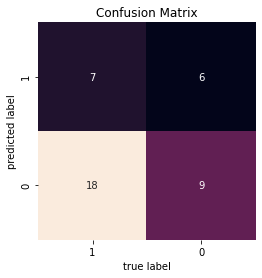

None


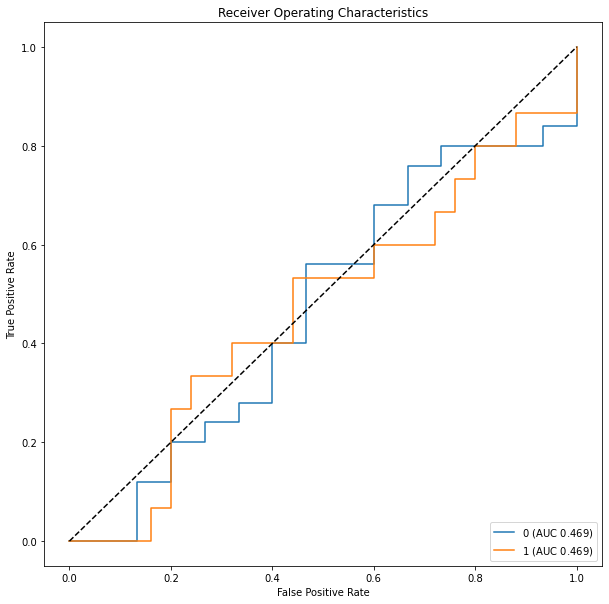

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


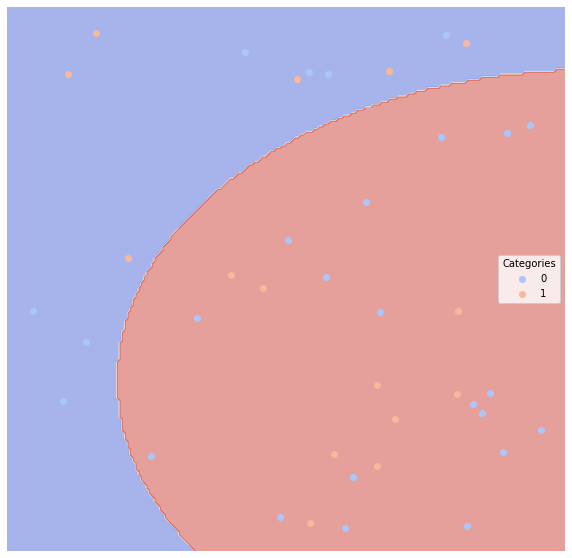

None
Time taken for method  nb  on dataset  1  is  0.5004875659942627  seconds
.........................................
Dataset:  1
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.575  0.486667   0.600000           0.619000  0.240000
1              0.575  0.486667   0.366667           0.368889  0.733333


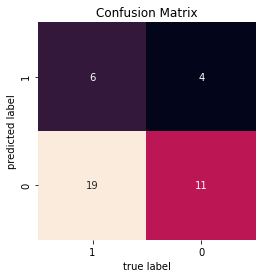

None


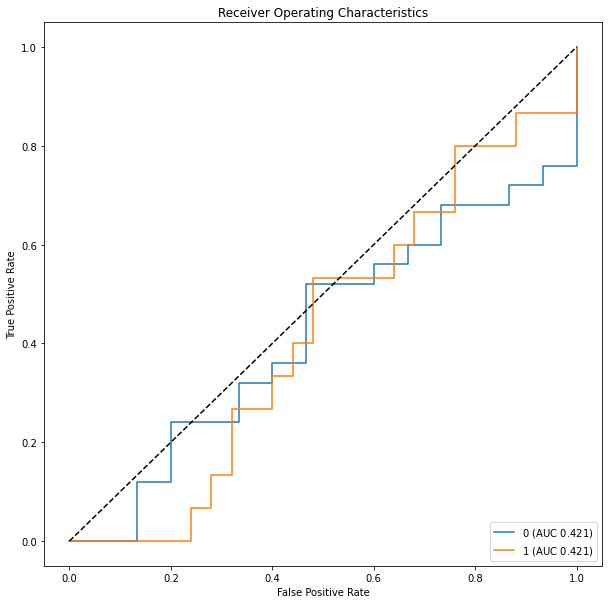

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


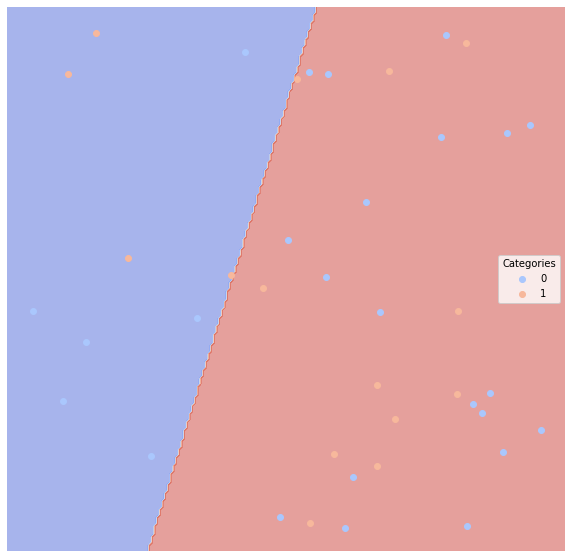

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


None
Time taken for method  linsvc  on dataset  1  is  0.5655608177185059  seconds
.........................................
Dataset:  1
Method:  polysvc
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0              0.625  0.5      0.000              0.625     0.0
1              0.625  0.5      0.375              0.375     1.0


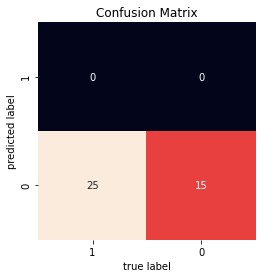

None


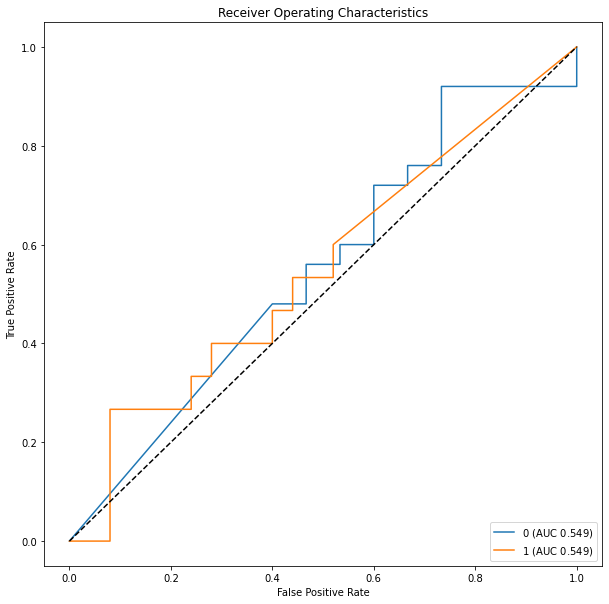

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


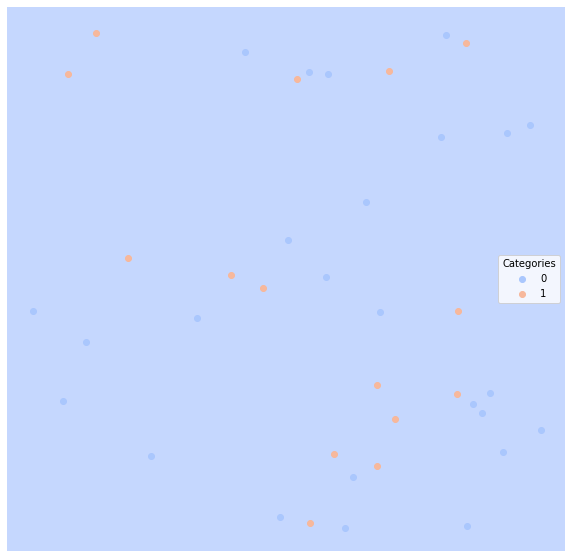

None
Time taken for method  polysvc  on dataset  1  is  0.5772857666015625  seconds
.........................................
Dataset:  1
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.575  0.446667   0.562500           0.602500  0.360000
1              0.575  0.446667   0.333333           0.352778  0.533333


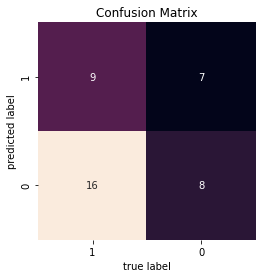

None


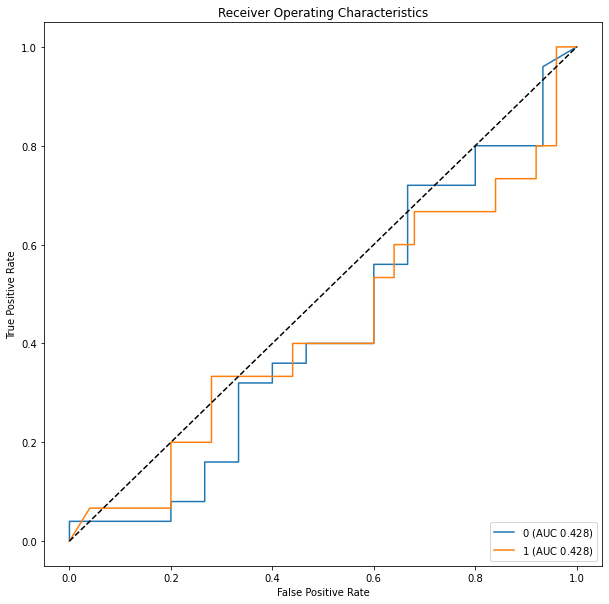

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


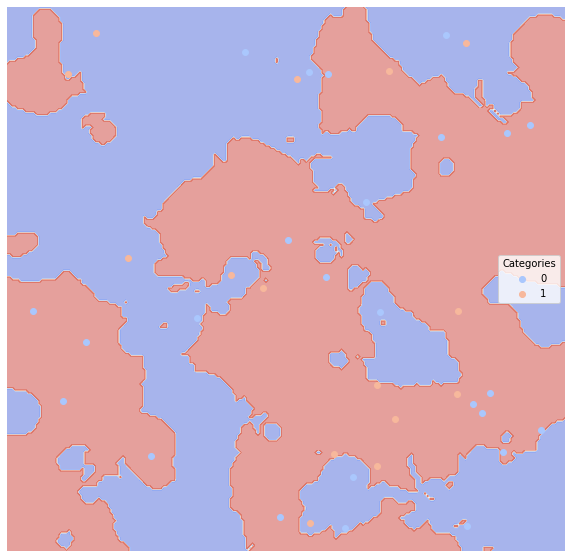

None
Time taken for method  neigh  on dataset  1  is  0.5803091526031494  seconds
.........................................
Dataset:  1
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.575  0.486667   0.600000           0.619000  0.240000
1              0.575  0.486667   0.366667           0.368889  0.733333


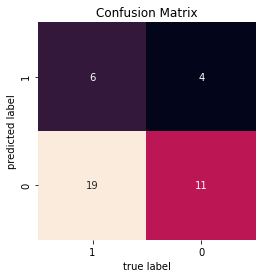

None


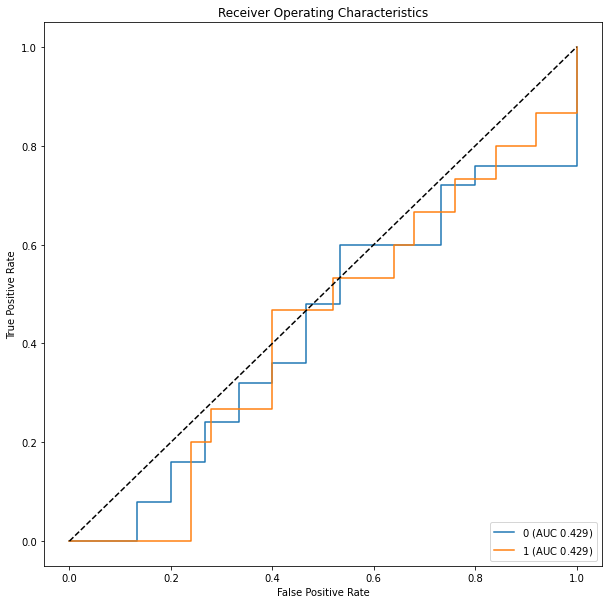

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


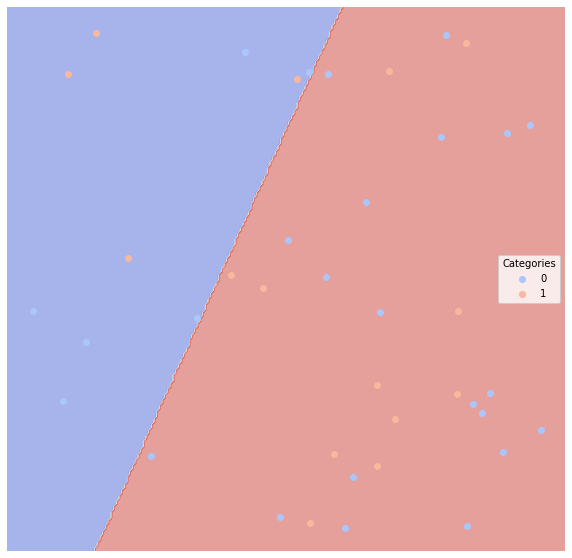

None
Time taken for method  logreg  on dataset  1  is  0.5352725982666016  seconds
.........................................
Dataset:  1
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.525  0.473333       0.60           0.613000  0.480000
1              0.525  0.473333       0.35           0.363333  0.466667


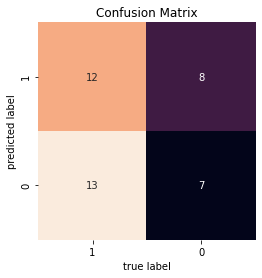

None


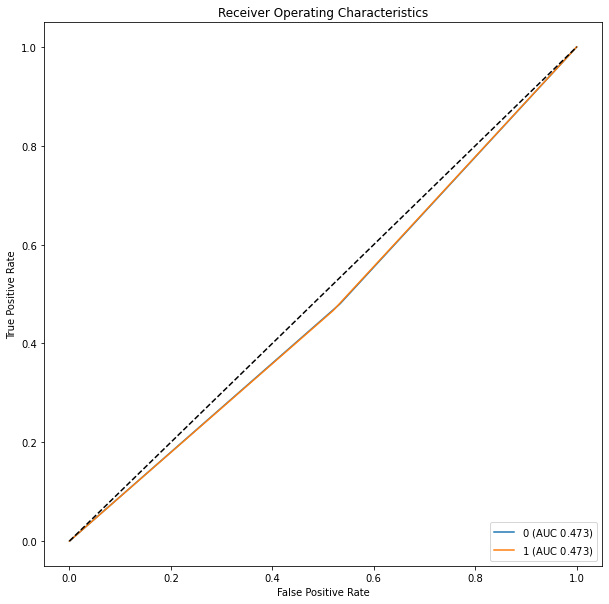

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


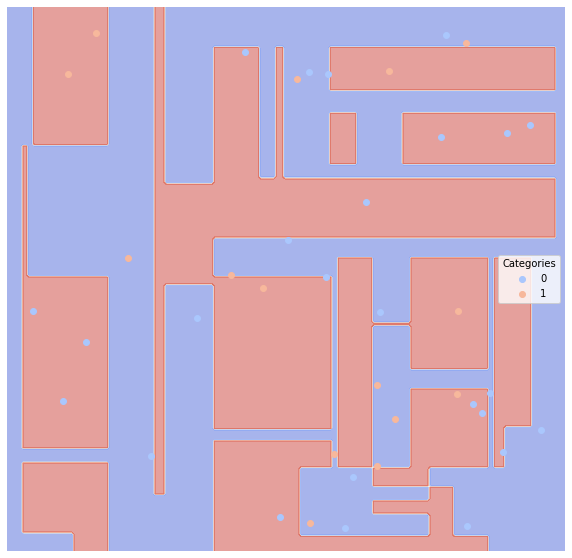

None
Time taken for method  dtree  on dataset  1  is  0.7629148960113525  seconds
.........................................
Dataset:  1
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0                0.5  0.506667   0.631579           0.628158  0.480000
1                0.5  0.506667   0.380952           0.378175  0.533333


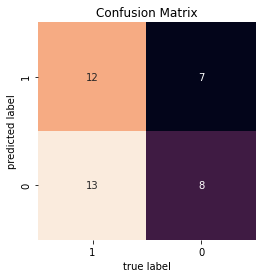

None


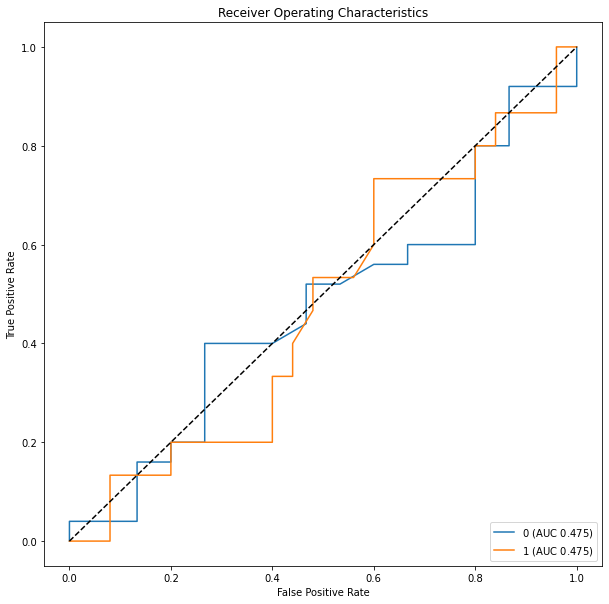

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


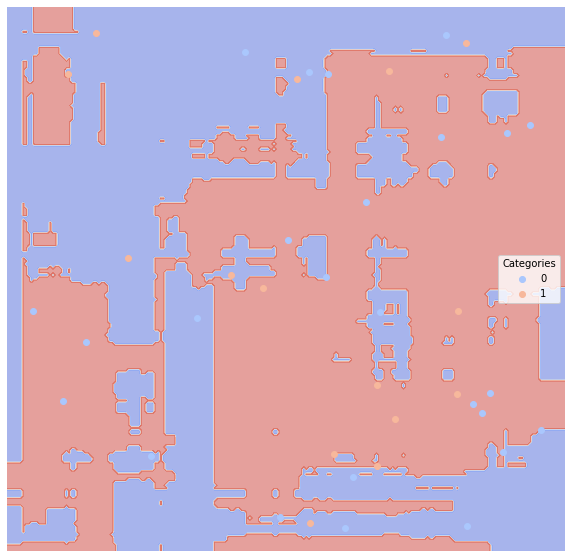

None
Time taken for method  rf  on dataset  1  is  0.9365932941436768  seconds
.........................................
Dataset:  1
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.575  0.486667   0.600000           0.619000  0.240000
1              0.575  0.486667   0.366667           0.368889  0.733333


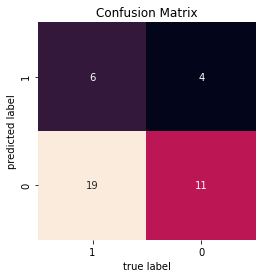

None


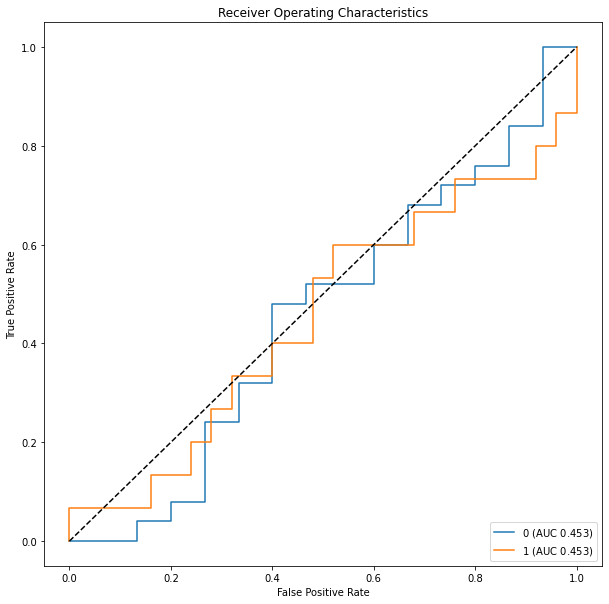

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


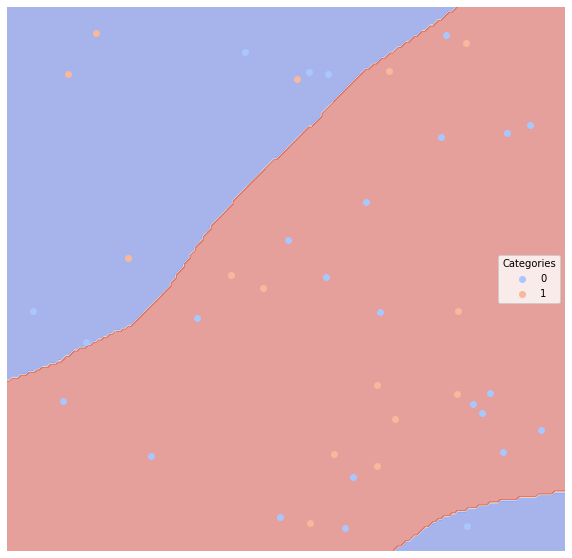

None
Time taken for method  mlp  on dataset  1  is  0.8320653438568115  seconds
.........................................
Dataset:  1
Method:  gbc
          Error_Rate   AUC  Precision  Average_Precision  Recall
Category                                                        
0              0.425  0.58       0.70              0.667    0.56
1              0.425  0.58       0.45              0.420    0.60


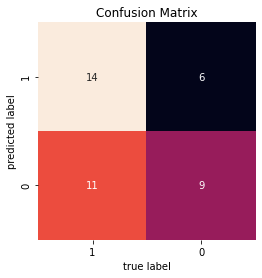

None


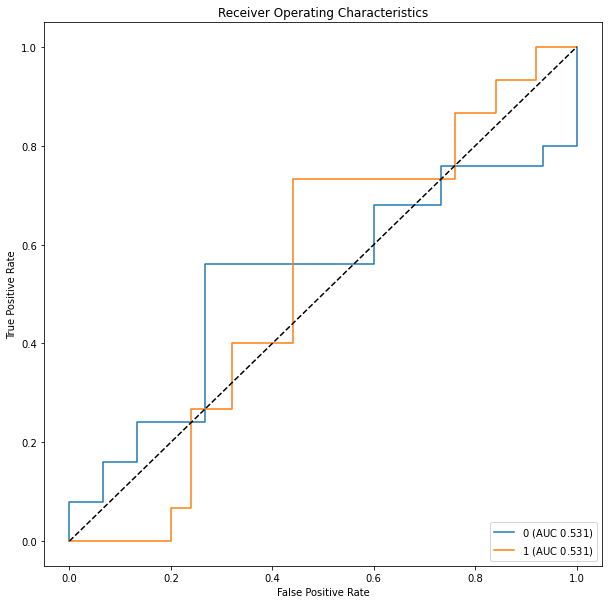

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


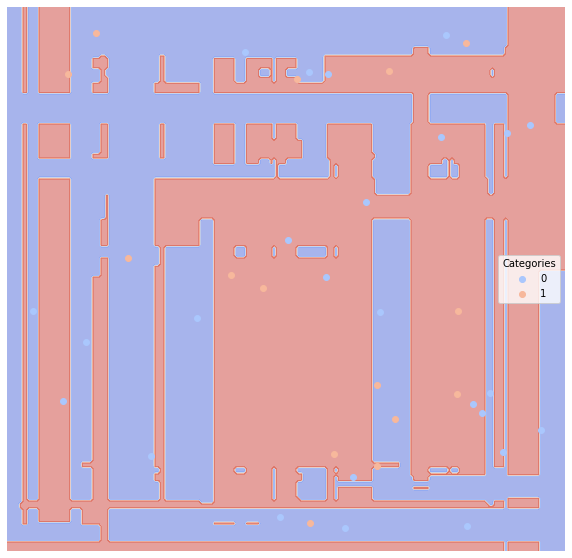

None
Time taken for method  gbc  on dataset  1  is  0.6099748611450195  seconds
.........................................
Dataset:  2
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0             0.4925  0.518818   0.483636           0.479647  0.707447
1             0.4925  0.518818   0.560000           0.539906  0.330189


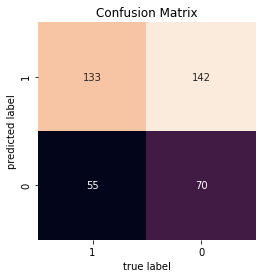

None


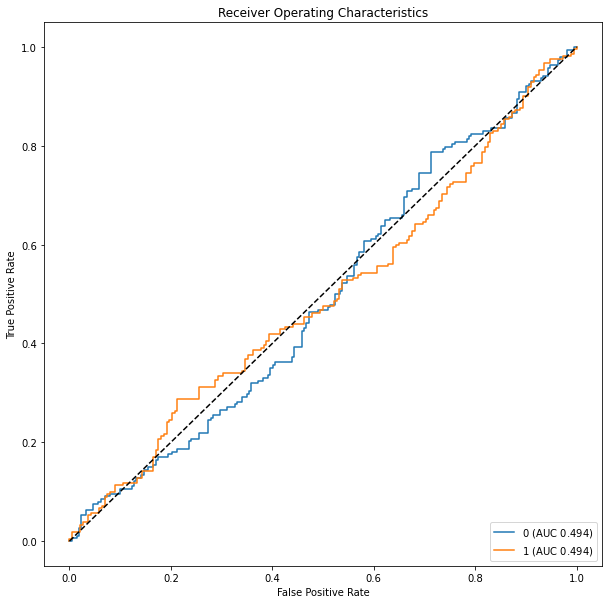

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


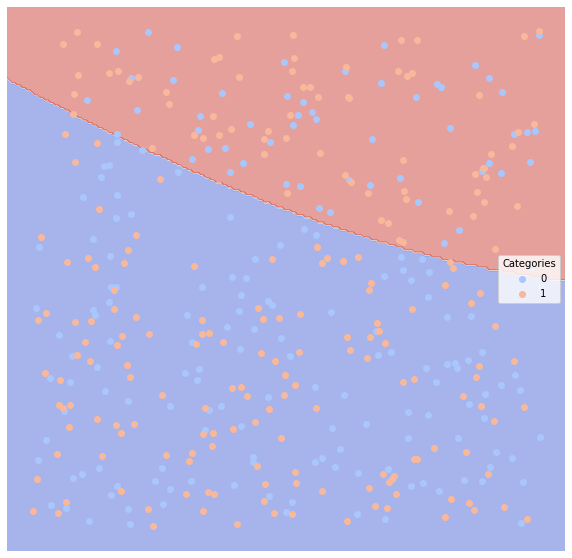

None
Time taken for method  nb  on dataset  2  is  0.5215256214141846  seconds
.........................................
Dataset:  2
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.51  0.495383   0.466102           0.467719  0.585106
1               0.51  0.495383   0.524390           0.527724  0.405660


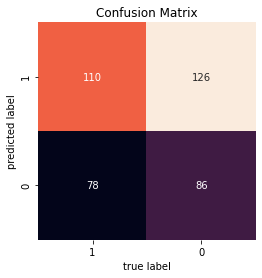

None


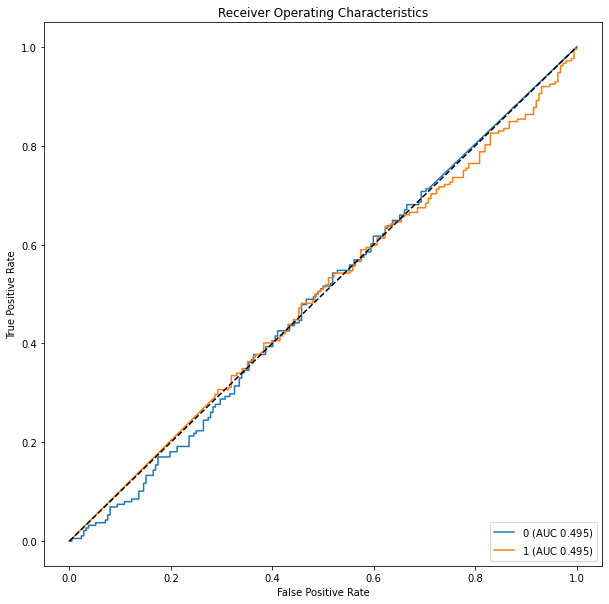

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


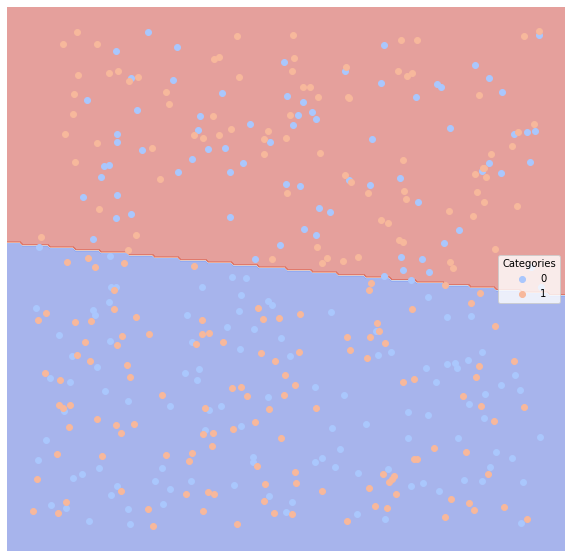

None
Time taken for method  linsvc  on dataset  2  is  1.2653005123138428  seconds
.........................................
Dataset:  2
Method:  polysvc
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0               0.53  0.5       0.47               0.47     1.0
1               0.53  0.5       0.00               0.53     0.0


/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


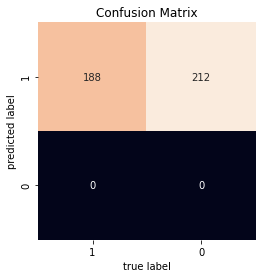

None


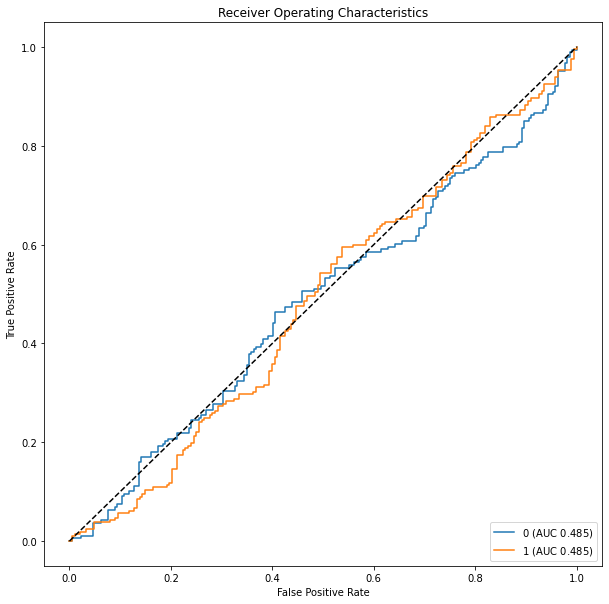

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


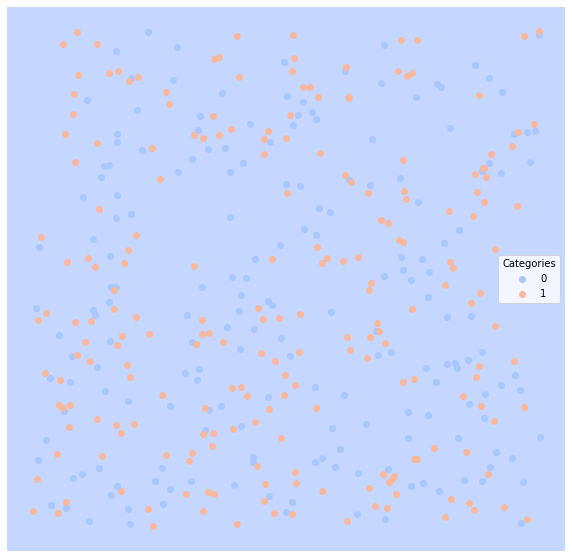

None
Time taken for method  polysvc  on dataset  2  is  1.4637668132781982  seconds
.........................................
Dataset:  2
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0             0.5175  0.483189   0.453659           0.461916  0.494681
1             0.5175  0.483189   0.512821           0.521896  0.471698


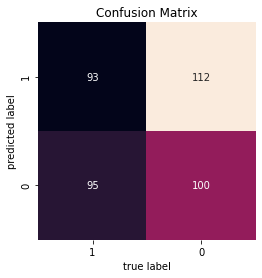

None


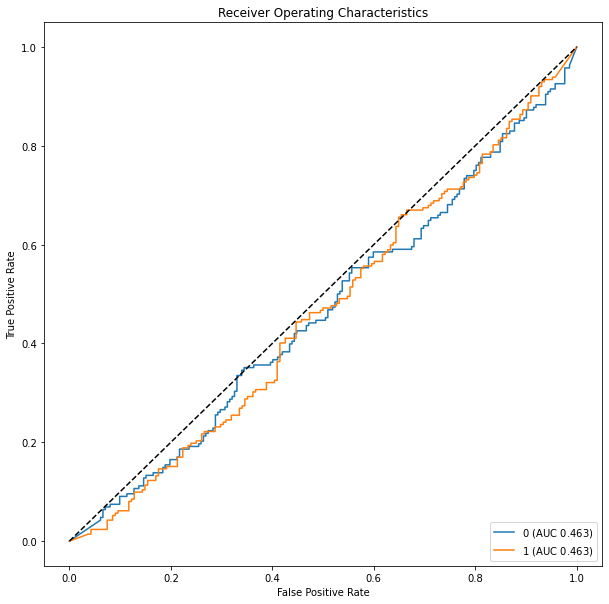

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


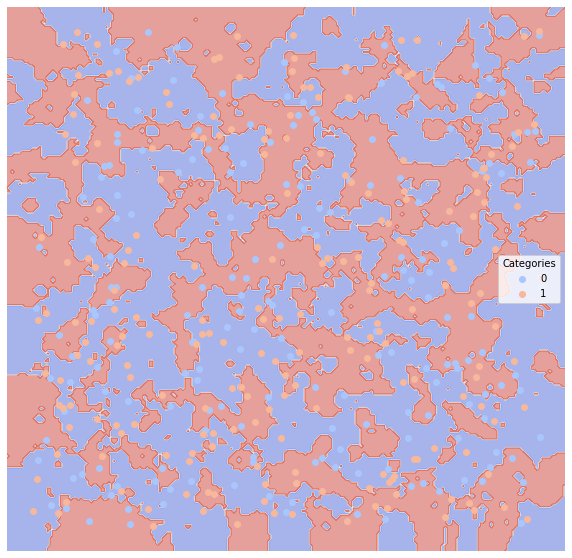

None
Time taken for method  neigh  on dataset  2  is  0.9201087951660156  seconds
.........................................
Dataset:  2
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0                0.5  0.510237   0.477612           0.475183  0.680851
1                0.5  0.510237   0.545455           0.535249  0.339623


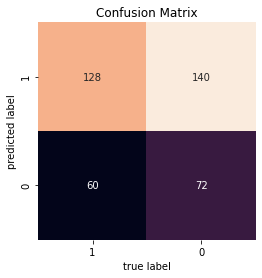

None


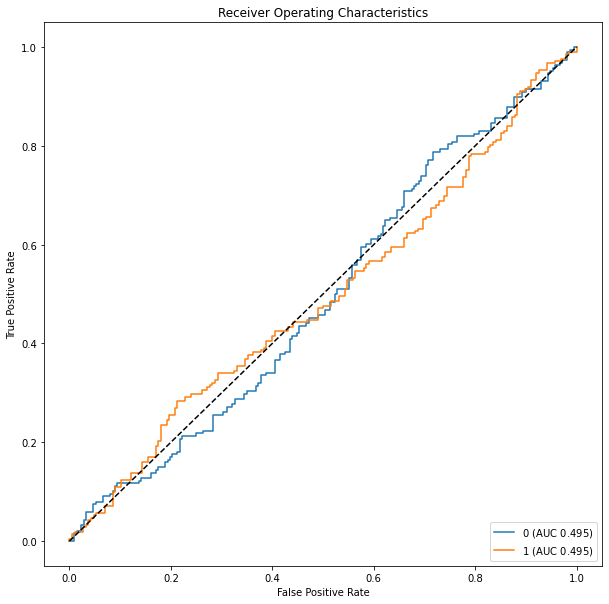

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


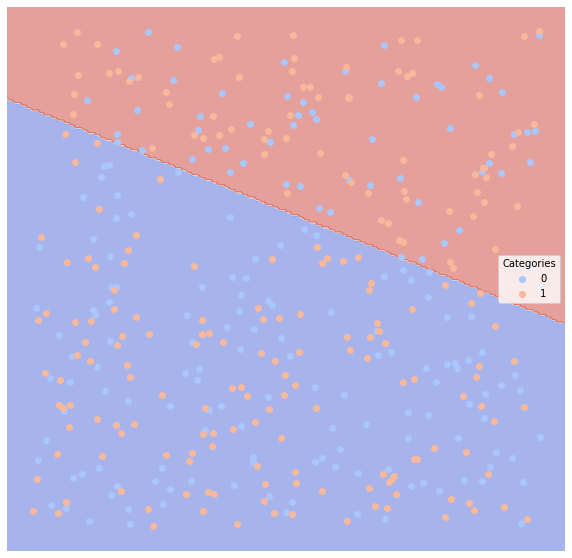

None
Time taken for method  logreg  on dataset  2  is  0.5674867630004883  seconds
.........................................
Dataset:  2
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0             0.5075  0.494731   0.465116           0.467402  0.531915
1             0.5075  0.494731   0.524324           0.527403  0.457547


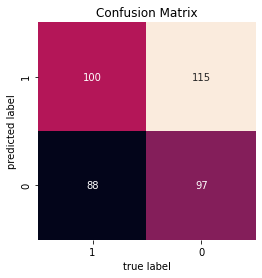

None


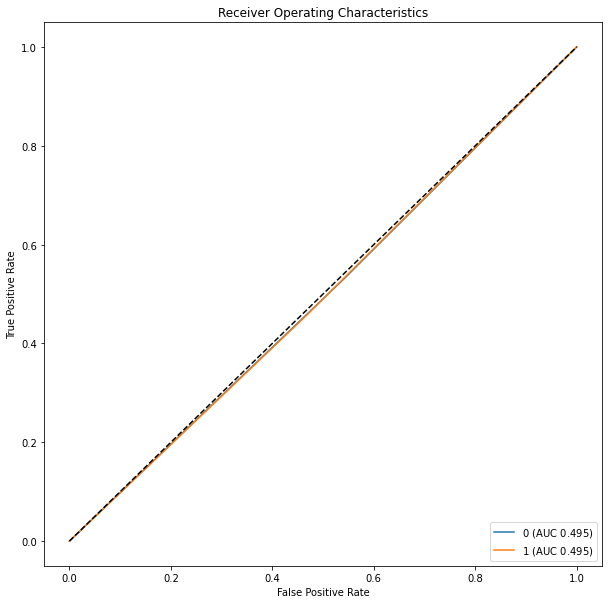

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


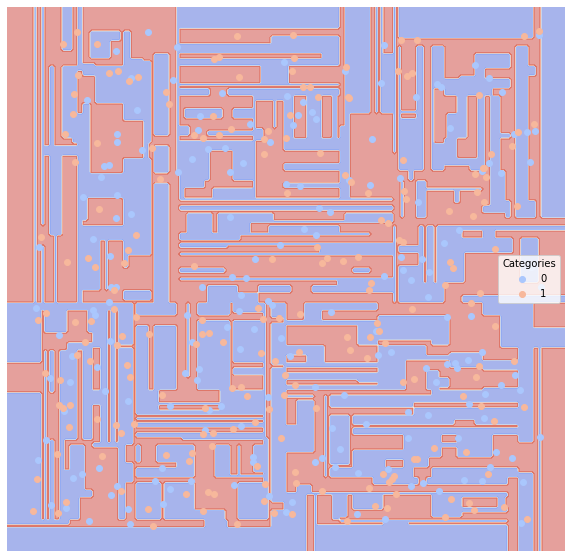

None
Time taken for method  dtree  on dataset  2  is  0.5806009769439697  seconds
.........................................
Dataset:  2
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.51  0.489663   0.459596           0.464964  0.484043
1               0.51  0.489663   0.519802           0.524949  0.495283


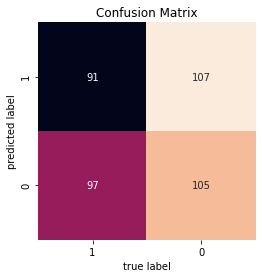

None


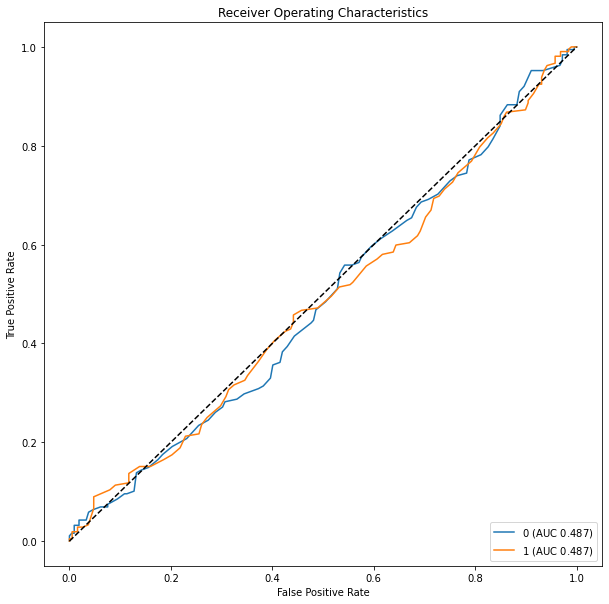

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


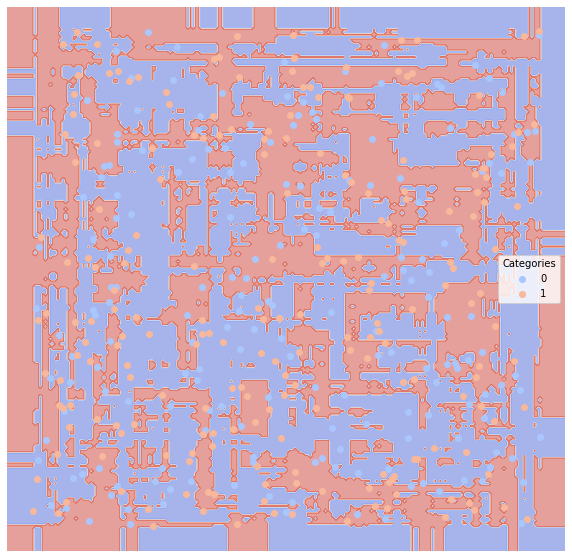

None
Time taken for method  rf  on dataset  2  is  1.408646583557129  seconds
.........................................
Dataset:  2
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision   Recall
Category                                                             
0              0.495  0.515255   0.481343           0.477783  0.68617
1              0.495  0.515255   0.553030           0.537930  0.34434


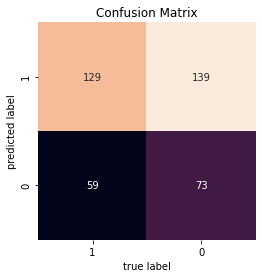

None


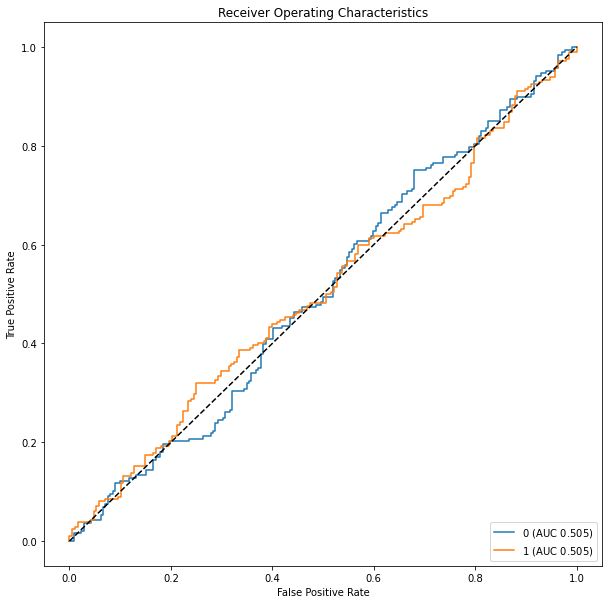

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


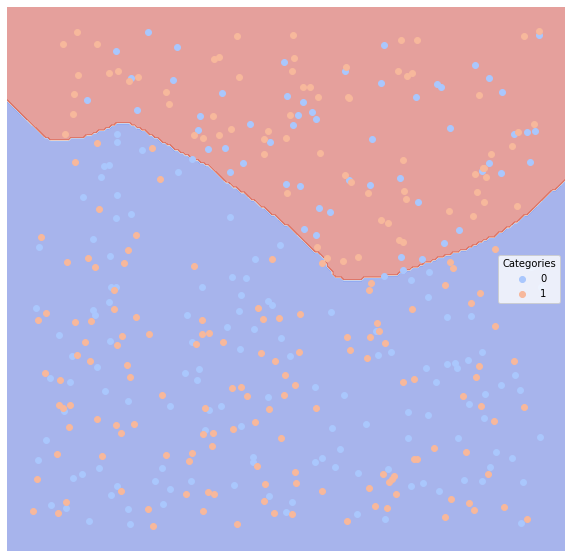

None
Time taken for method  mlp  on dataset  2  is  0.8542916774749756  seconds
.........................................
Dataset:  2
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.49  0.509735   0.479798           0.474951  0.505319
1               0.49  0.509735   0.539604           0.534938  0.514151


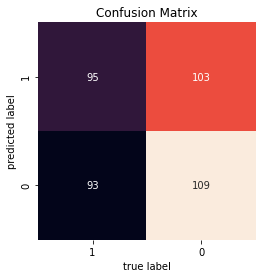

None


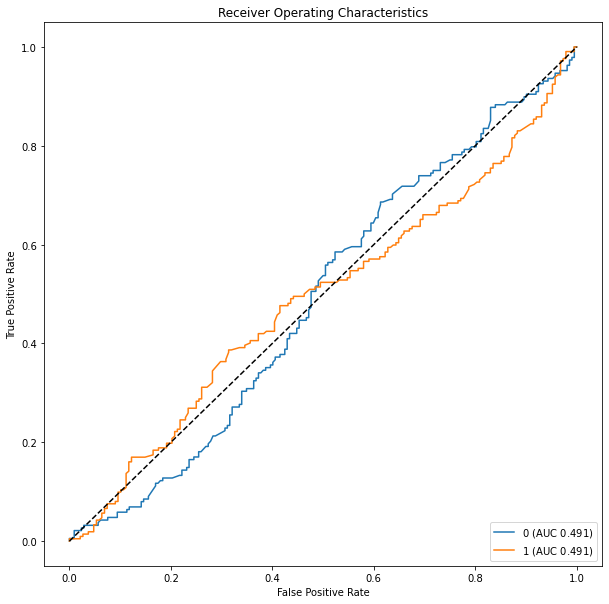

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


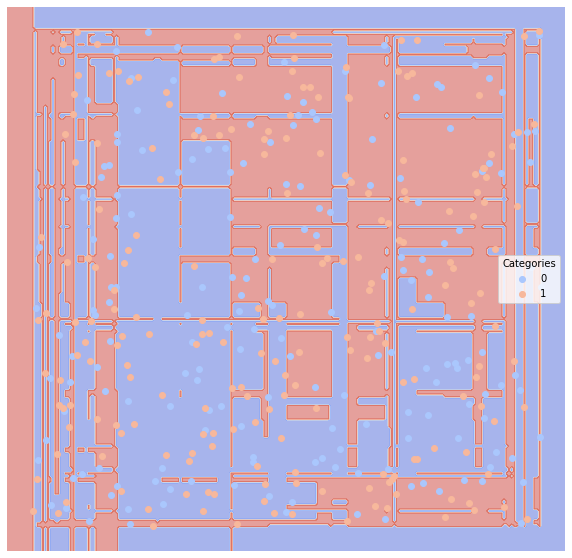

None
Time taken for method  gbc  on dataset  2  is  0.8001019954681396  seconds
.........................................
Dataset:  3
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.964486   0.943925           0.939671  0.990196
1              0.035  0.964486   0.989247           0.958681  0.938776


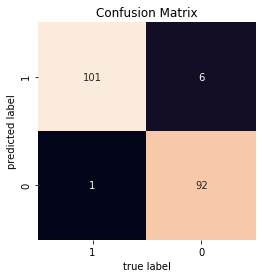

None


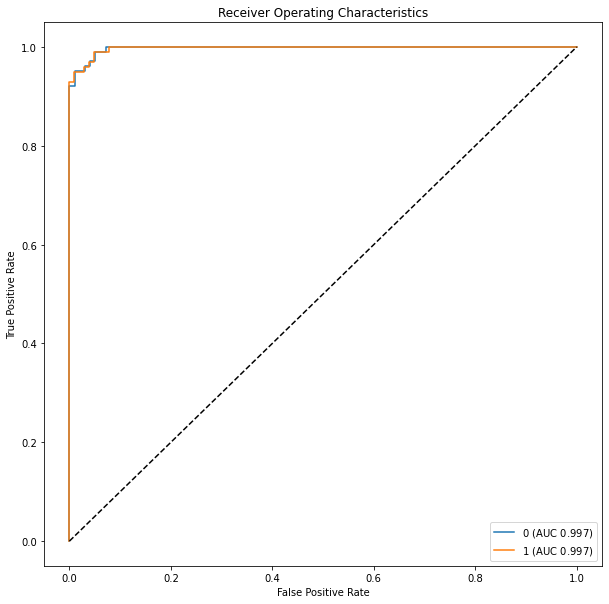

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


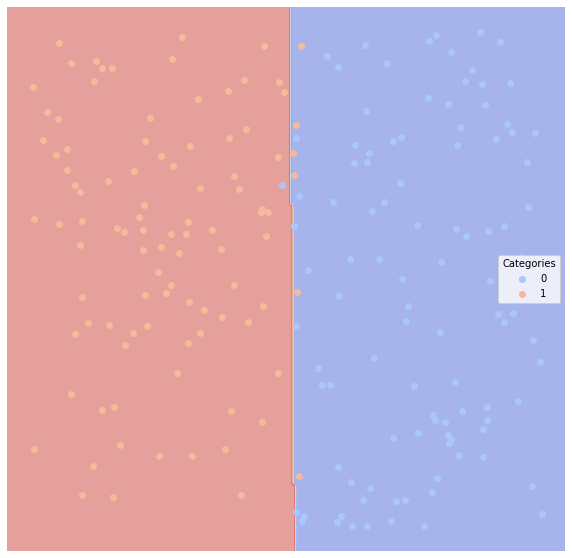

None
Time taken for method  nb  on dataset  3  is  0.719557523727417  seconds
.........................................
Dataset:  3
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.964486   0.943925           0.939671  0.990196
1              0.035  0.964486   0.989247           0.958681  0.938776


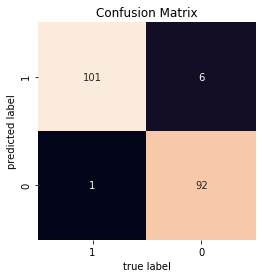

None


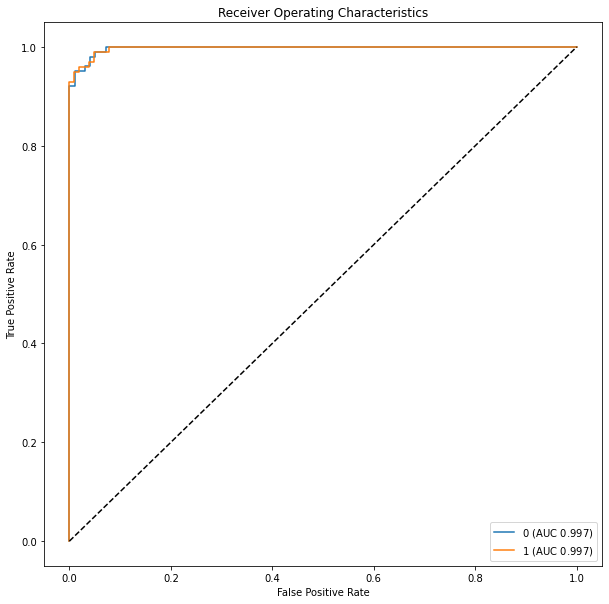

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


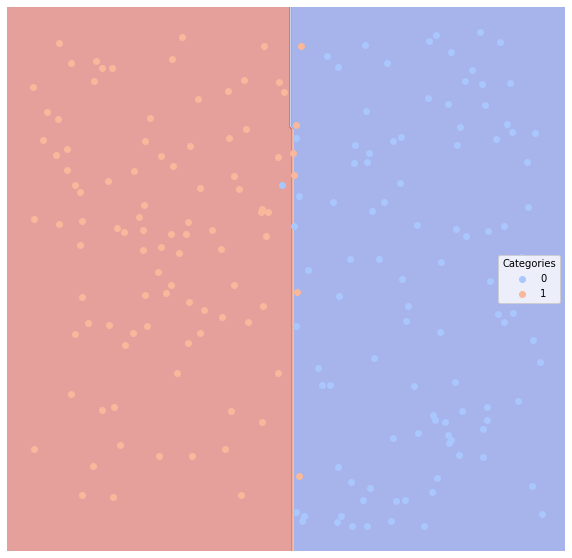

None
Time taken for method  linsvc  on dataset  3  is  0.5415060520172119  seconds
.........................................
Dataset:  3
Method:  polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.045  0.955282   0.969697           0.942656  0.941176
1              0.045  0.955282   0.940594           0.926800  0.969388


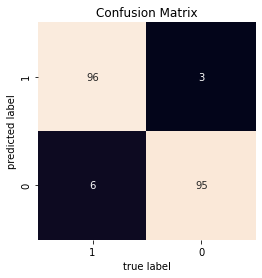

None


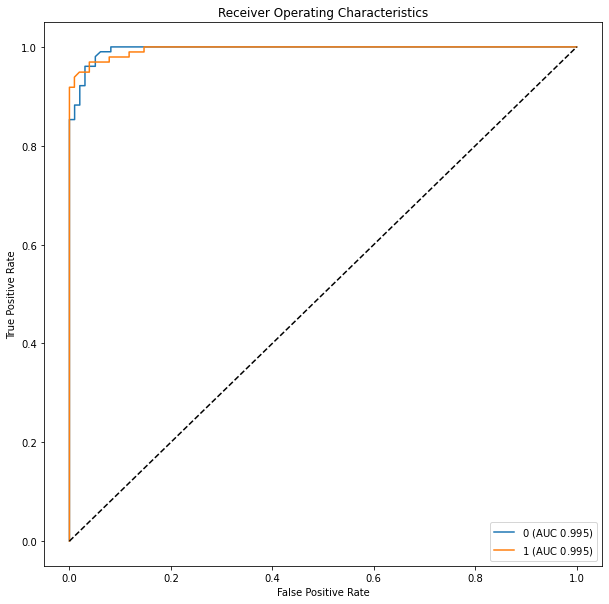

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


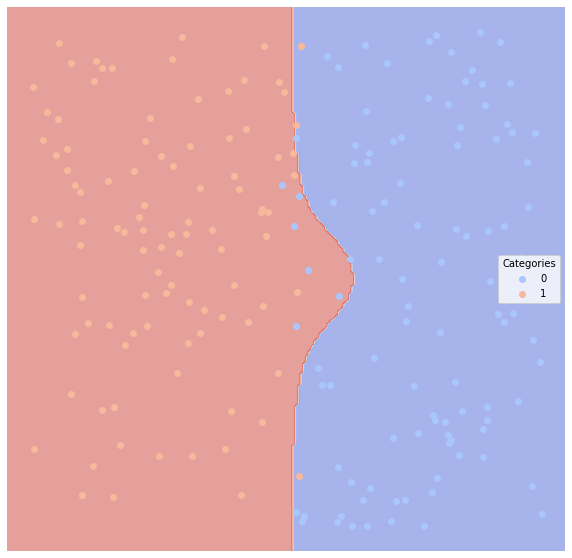

None
Time taken for method  polysvc  on dataset  3  is  0.6636524200439453  seconds
.........................................
Dataset:  3
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.055  0.944678   0.933333           0.916732  0.960784
1              0.055  0.944678   0.957895           0.924474  0.928571


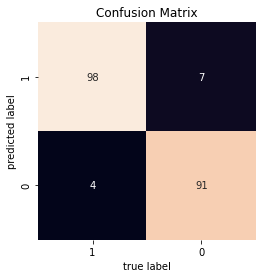

None


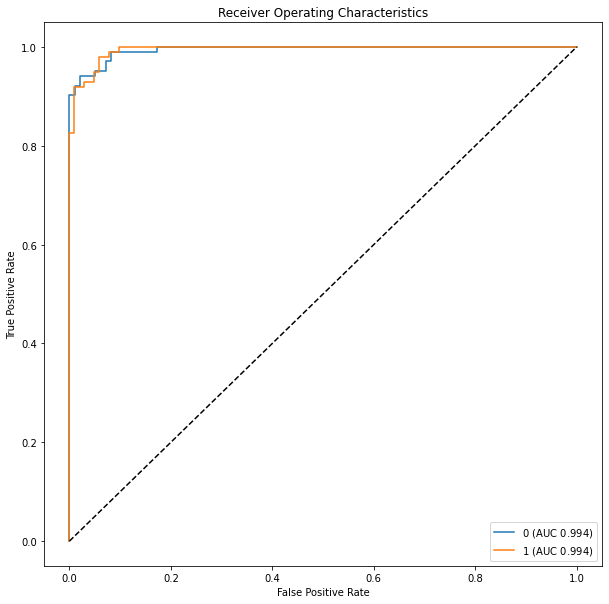

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


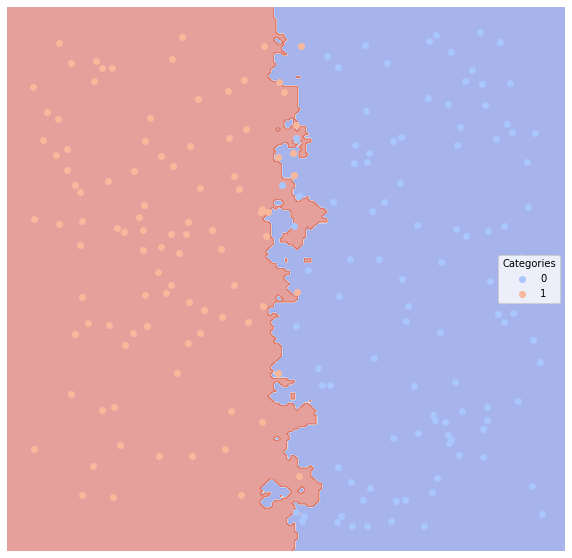

None
Time taken for method  neigh  on dataset  3  is  0.6175694465637207  seconds
.........................................
Dataset:  3
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.964486   0.943925           0.939671  0.990196
1              0.035  0.964486   0.989247           0.958681  0.938776


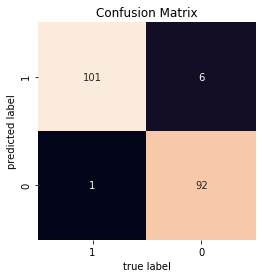

None


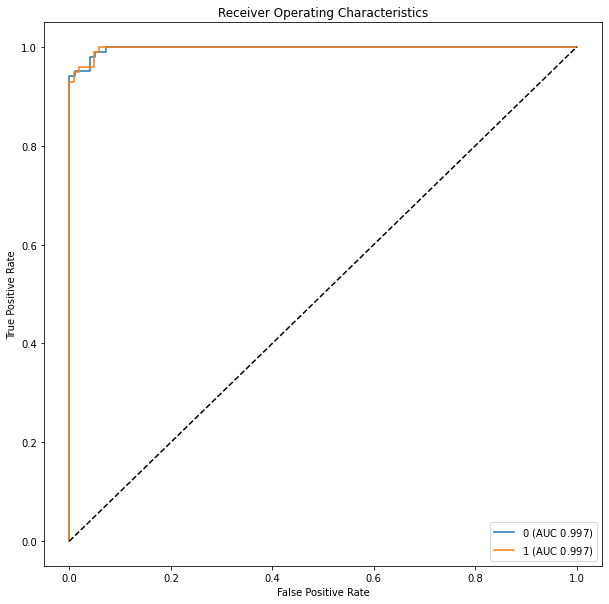

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


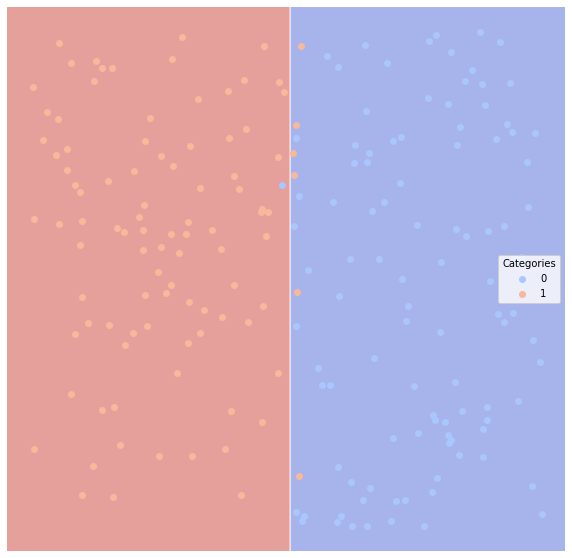

None
Time taken for method  logreg  on dataset  3  is  0.5311498641967773  seconds
.........................................
Dataset:  3
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.065  0.934474   0.915888           0.899971  0.960784
1              0.065  0.934474   0.956989           0.914102  0.908163


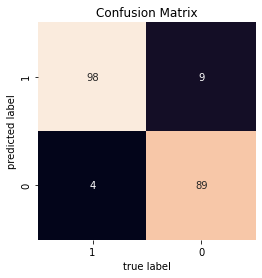

None


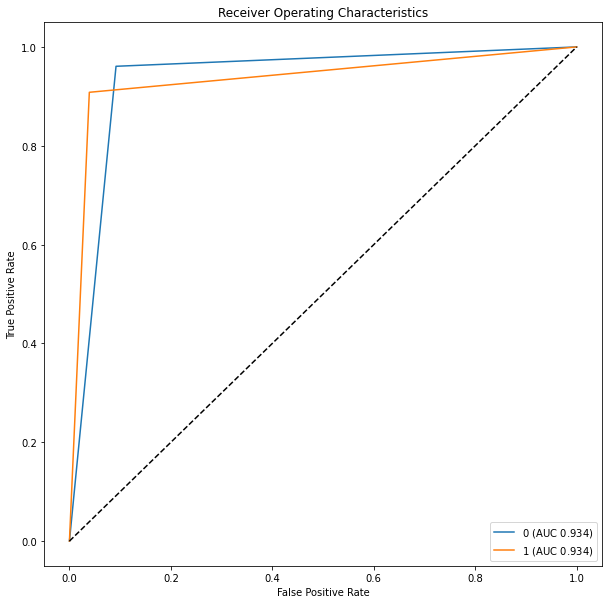

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


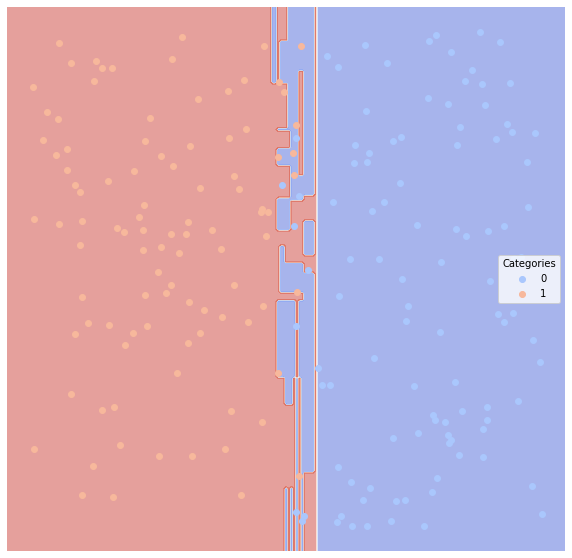

None
Time taken for method  dtree  on dataset  3  is  0.49472665786743164  seconds
.........................................
Dataset:  3
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.964286    0.93578           0.935780  1.000000
1              0.035  0.964286    1.00000           0.963571  0.928571


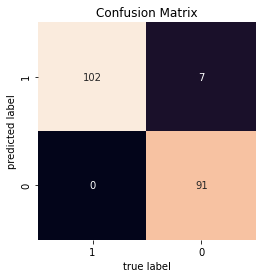

None


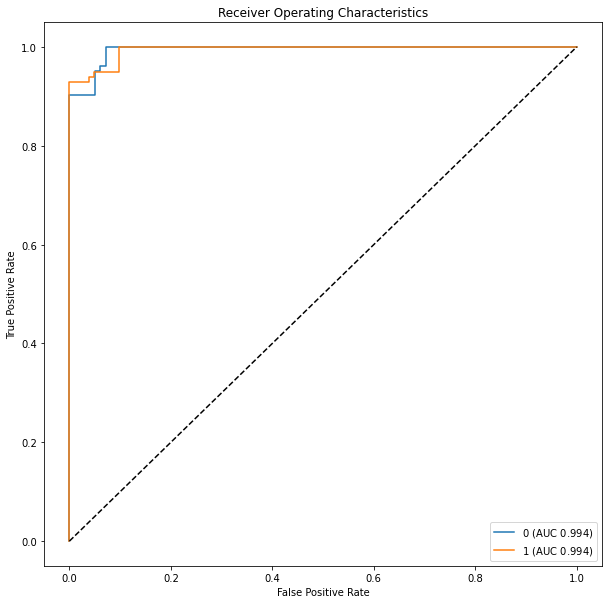

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


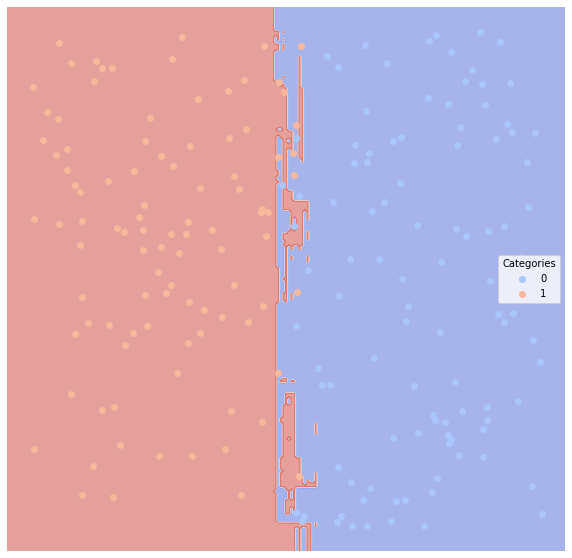

None
Time taken for method  rf  on dataset  3  is  0.8871026039123535  seconds
.........................................
Dataset:  3
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.964486   0.943925           0.939671  0.990196
1              0.035  0.964486   0.989247           0.958681  0.938776


/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


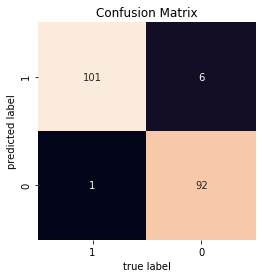

None


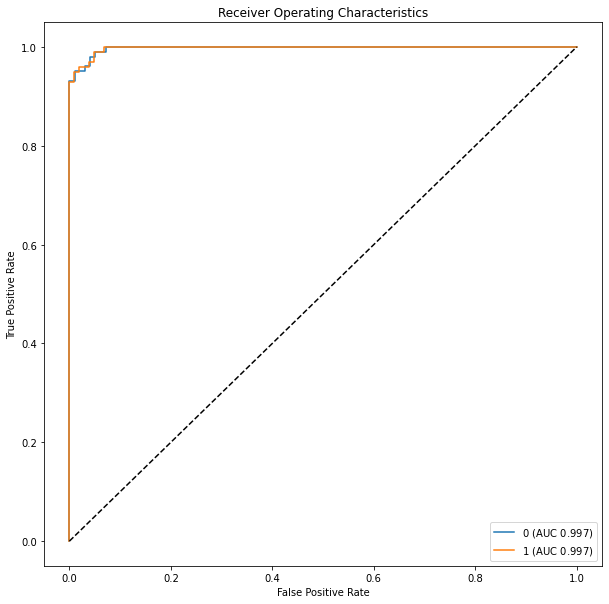

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


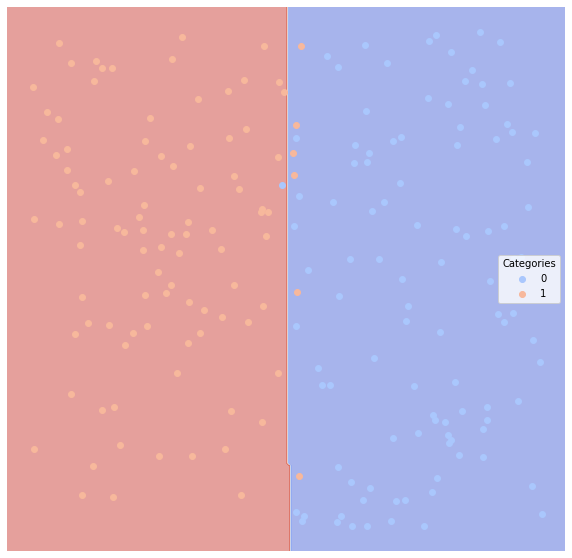

None
Time taken for method  mlp  on dataset  3  is  1.7501323223114014  seconds
.........................................
Dataset:  3
Method:  gbc
          Error_Rate      AUC  Precision  Average_Precision   Recall
Category                                                            
0               0.05  0.94998    0.95098           0.929364  0.95098
1               0.05  0.94998    0.94898           0.925562  0.94898


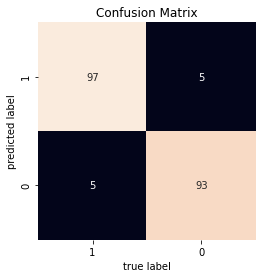

None


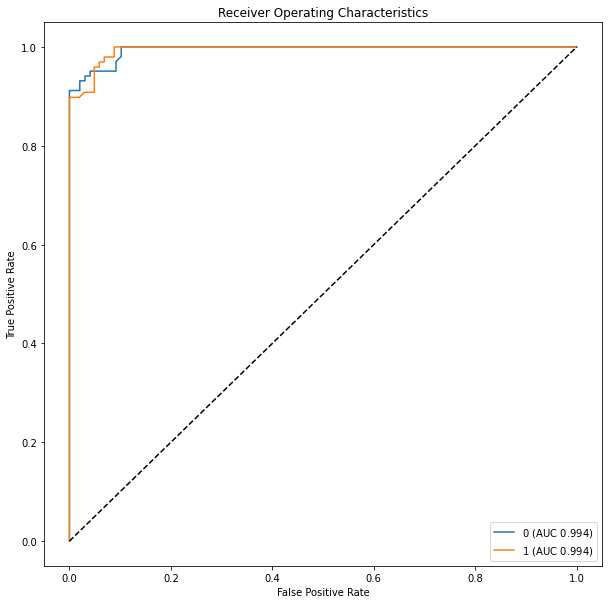

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


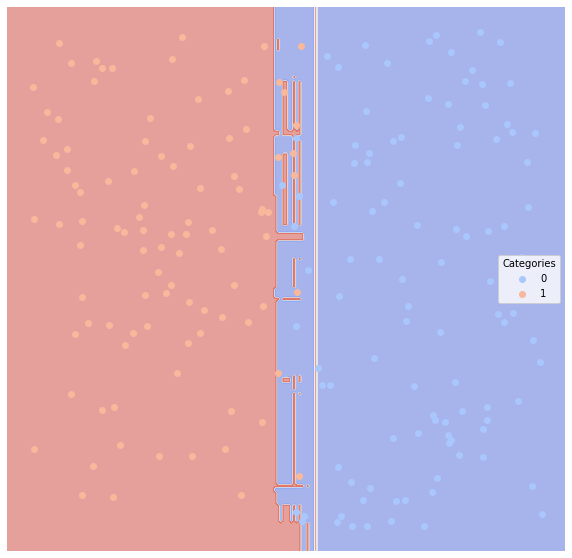

None
Time taken for method  gbc  on dataset  3  is  0.6387255191802979  seconds
.........................................
Dataset:  4
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.455  0.543918   0.539326           0.514160  0.489796
1              0.455  0.543918   0.549550           0.533652  0.598039


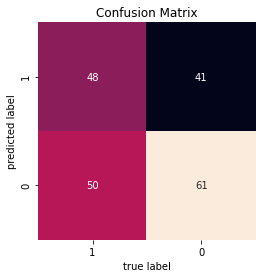

None


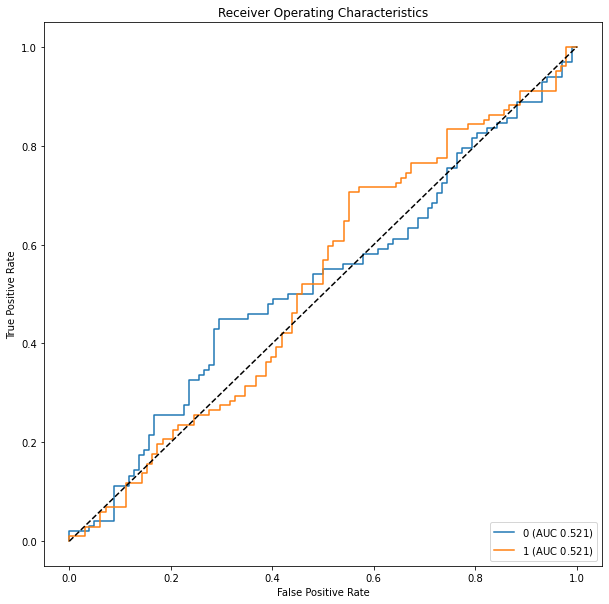

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


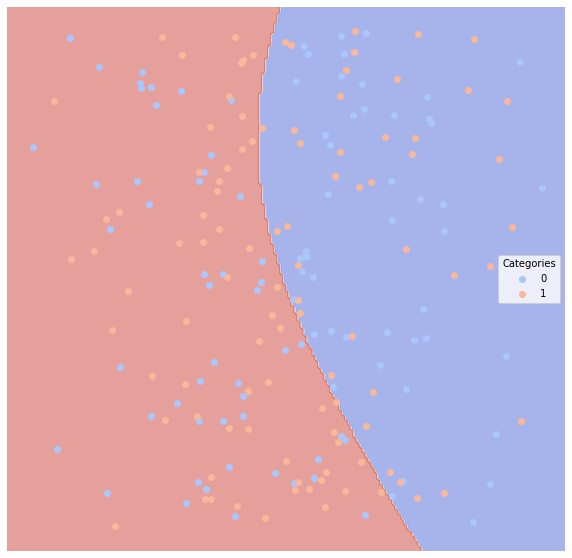

None
Time taken for method  nb  on dataset  4  is  0.5127136707305908  seconds
.........................................
Dataset:  4
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.485  0.515706   0.504673           0.498085  0.551020
1              0.485  0.515706   0.526882           0.518110  0.480392


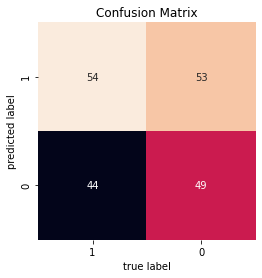

None


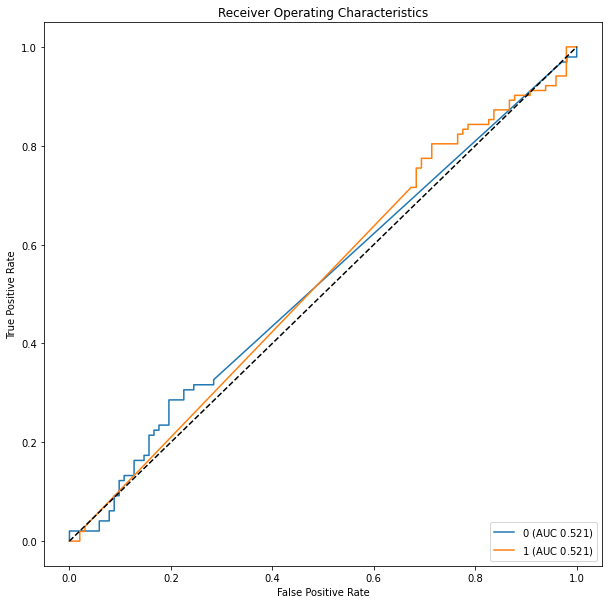

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


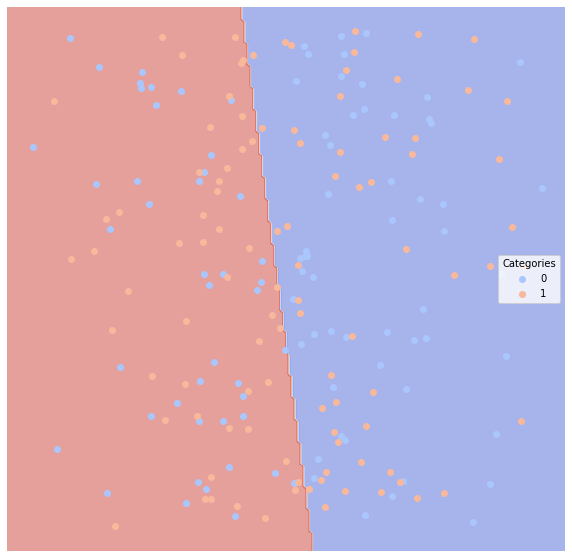

None
Time taken for method  linsvc  on dataset  4  is  0.7802388668060303  seconds
.........................................
Dataset:  4
Method:  polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.495  0.502901   0.493671           0.491461  0.397959
1              0.495  0.502901   0.512397           0.511457  0.607843


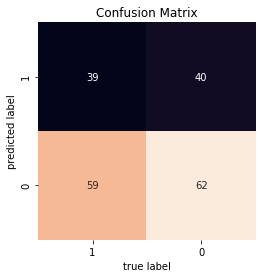

None


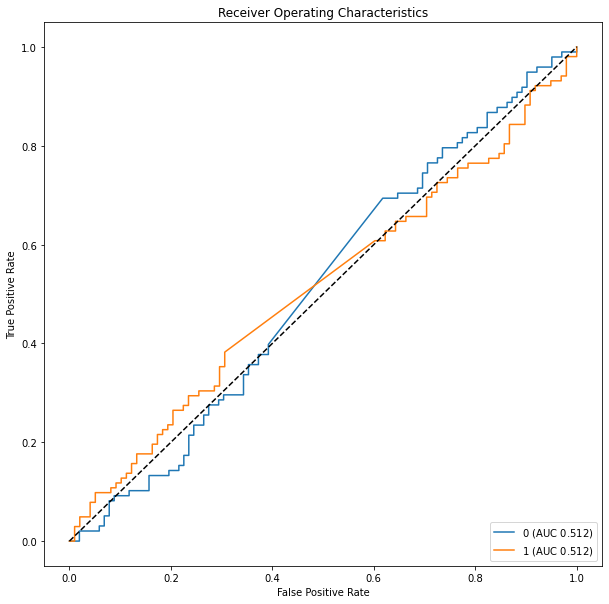

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


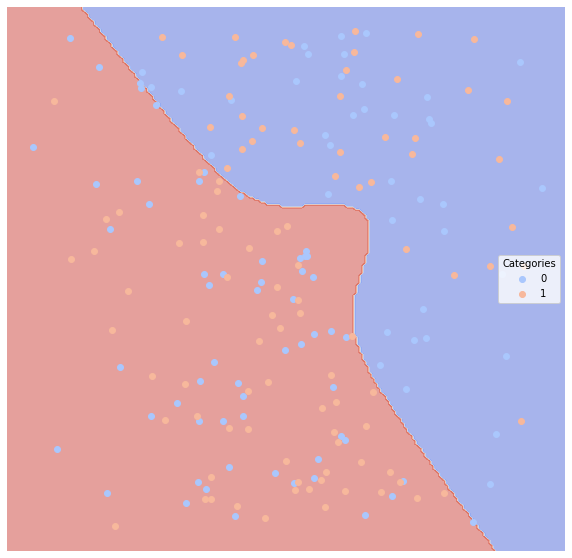

None
Time taken for method  polysvc  on dataset  4  is  0.880850076675415  seconds
.........................................
Dataset:  4
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.54  0.461385   0.456140           0.472034  0.530612
1               0.54  0.461385   0.465116           0.492399  0.392157


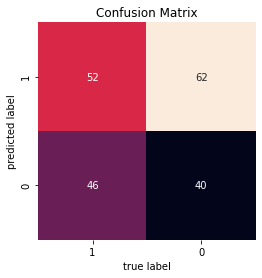

None


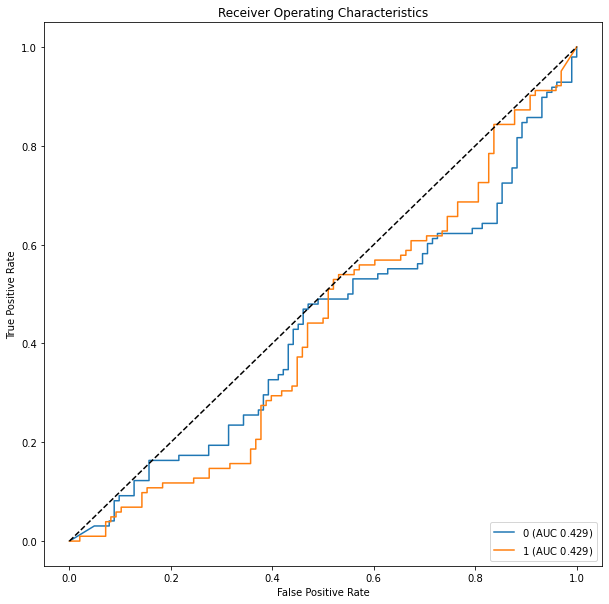

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


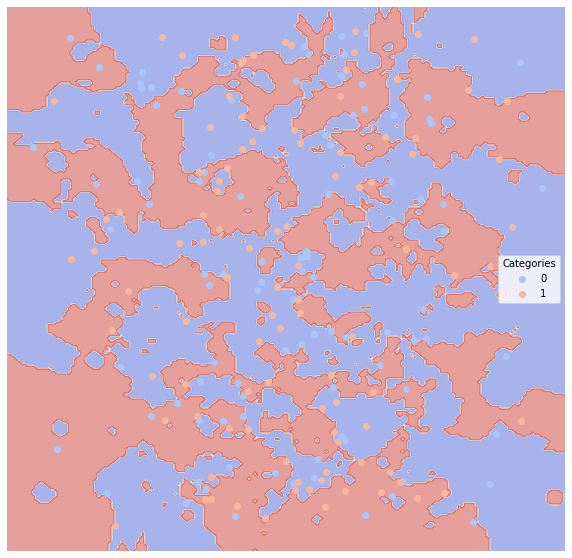

None
Time taken for method  neigh  on dataset  4  is  0.6552562713623047  seconds
.........................................
Dataset:  4
Method:  logreg
          Error_Rate     AUC  Precision  Average_Precision    Recall
Category                                                            
0                0.5  0.5008   0.490741           0.490401  0.540816
1                0.5  0.5008   0.510870           0.510401  0.460784


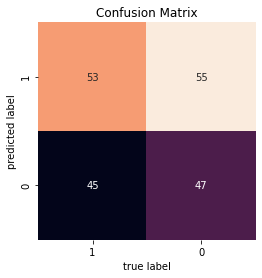

None


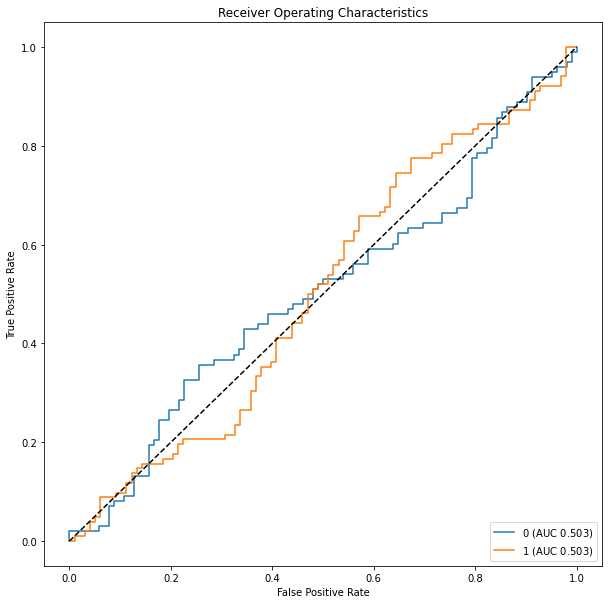

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


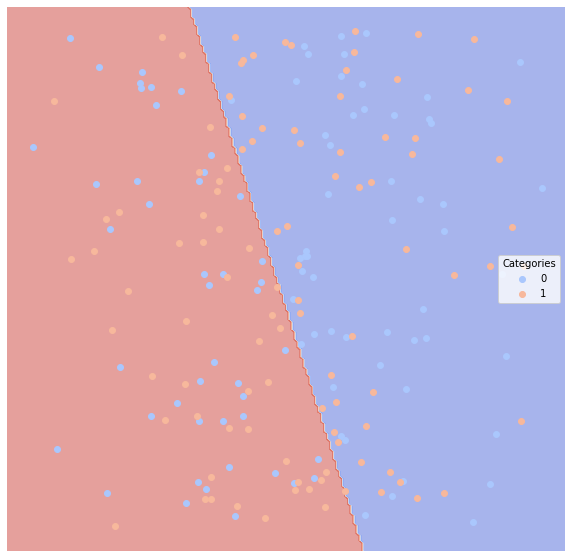

None
Time taken for method  logreg  on dataset  4  is  0.533721923828125  seconds
.........................................
Dataset:  4
Method:  dtree
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.525  0.47509   0.465347           0.478176  0.479592
1              0.525  0.47509   0.484848           0.498164  0.470588


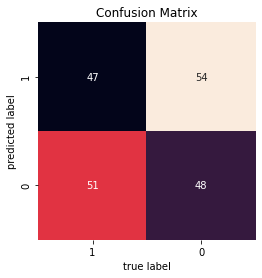

None


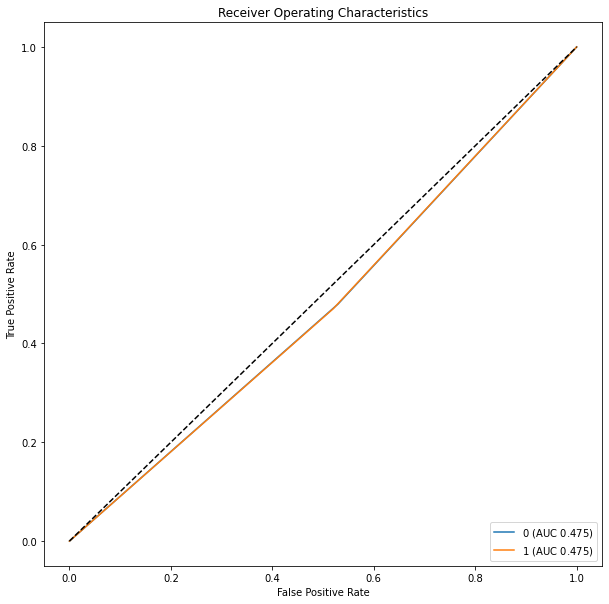

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


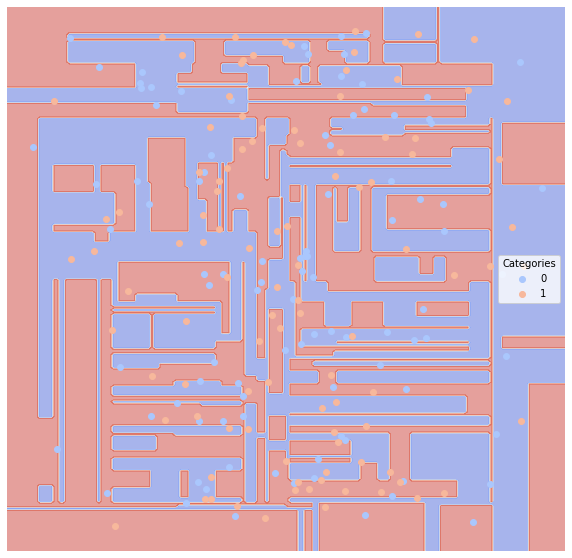

None
Time taken for method  dtree  on dataset  4  is  0.7574996948242188  seconds
.........................................
Dataset:  4
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.565  0.436275   0.433628           0.461814  0.500000
1              0.565  0.436275   0.436782           0.482723  0.372549


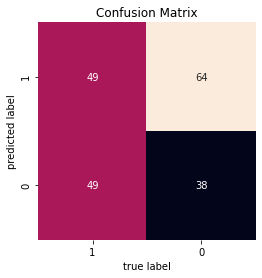

None


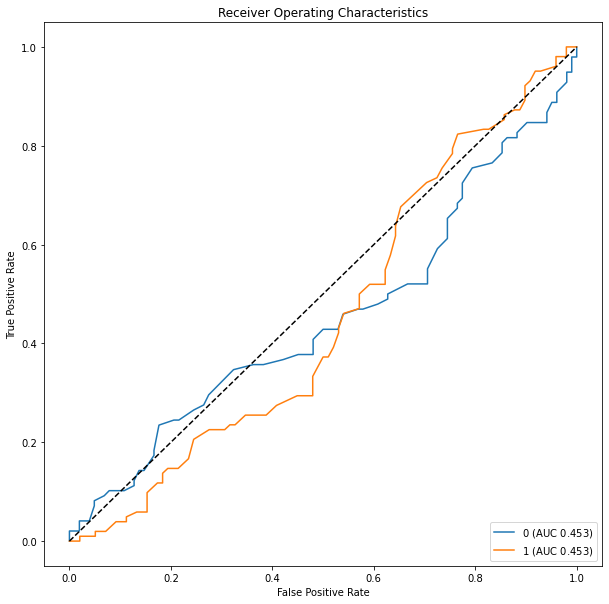

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


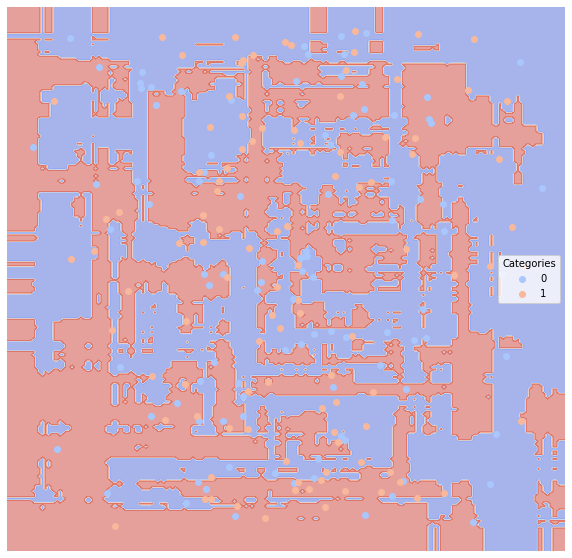

None
Time taken for method  rf  on dataset  4  is  1.1357710361480713  seconds
.........................................
Dataset:  4
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.47  0.532613   0.515873           0.507161  0.663265
1               0.47  0.532613   0.554054           0.527708  0.401961


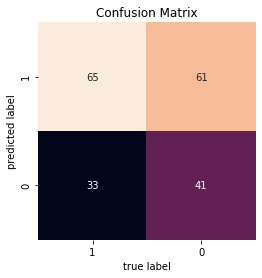

None


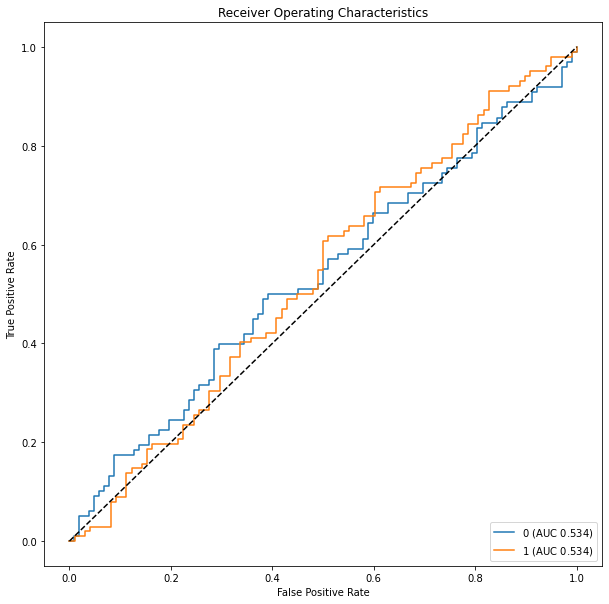

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


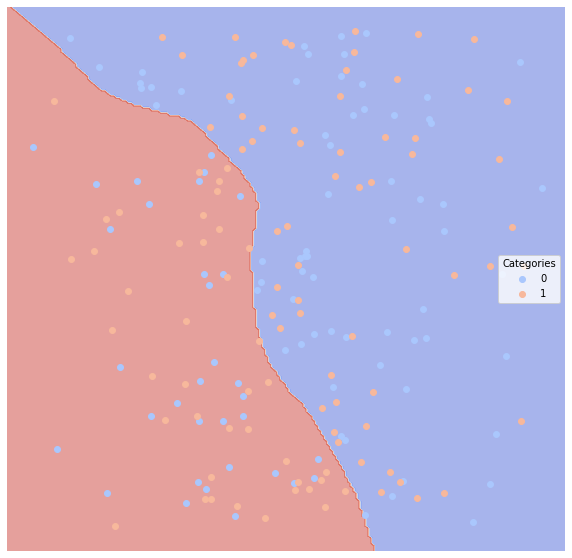

None
Time taken for method  mlp  on dataset  4  is  0.9299566745758057  seconds
.........................................
Dataset:  4
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.485  0.515106   0.504950           0.497780  0.520408
1              0.485  0.515106   0.525253           0.517776  0.509804


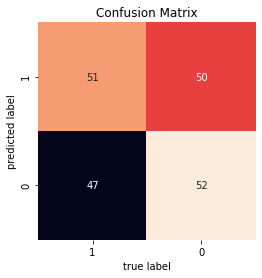

None


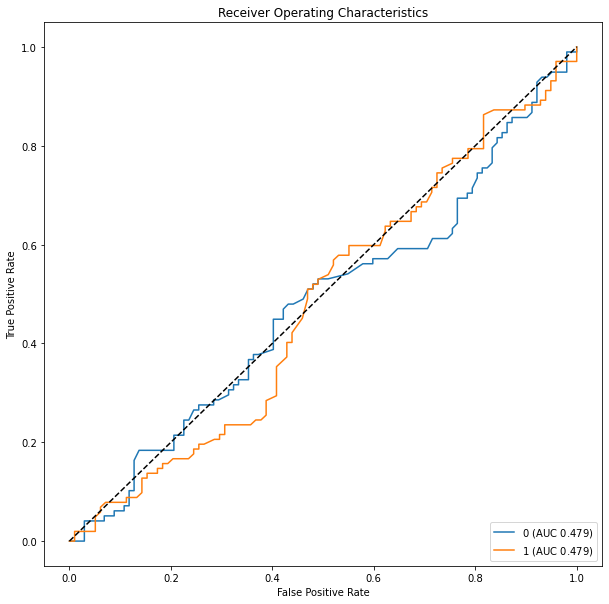

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


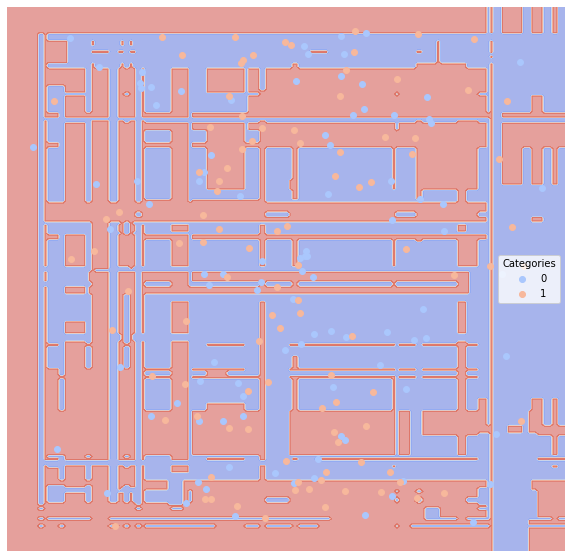

None
Time taken for method  gbc  on dataset  4  is  0.6887054443359375  seconds
.........................................
Dataset:  5
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.55  0.451907   0.459770           0.493552  0.388350
1               0.55  0.451907   0.442478           0.463081  0.515464


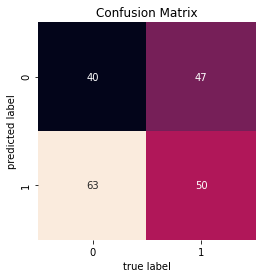

None


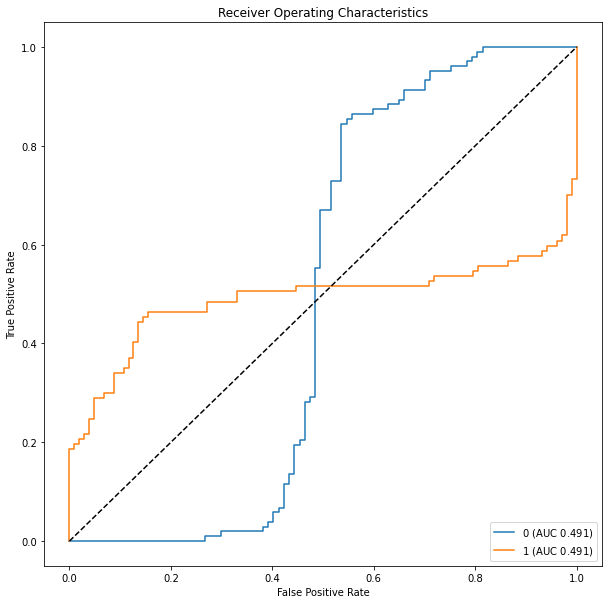

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


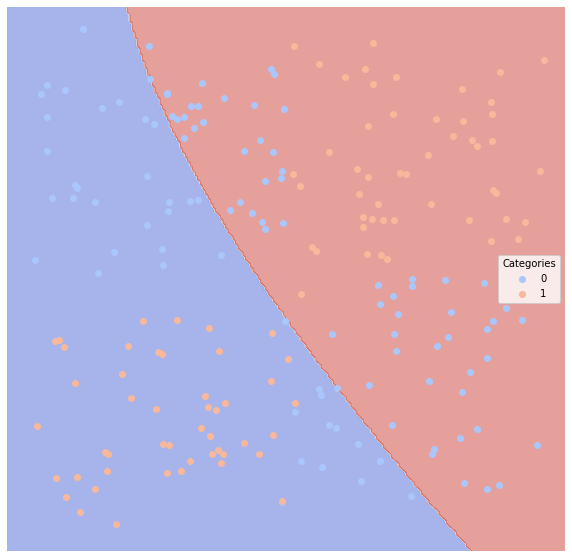

None
Time taken for method  nb  on dataset  5  is  0.515744686126709  seconds
.........................................
Dataset:  5
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.435  0.563257   0.571429           0.550062  0.621359
1              0.435  0.563257   0.556818           0.521279  0.505155


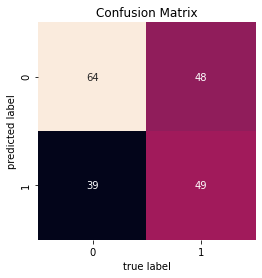

None


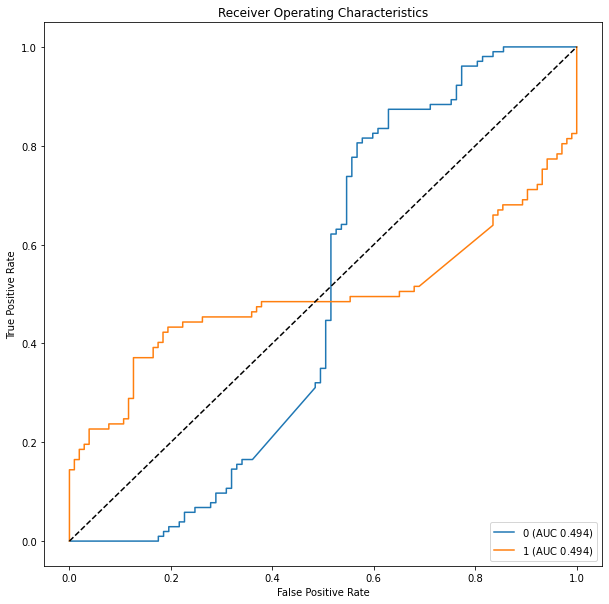

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


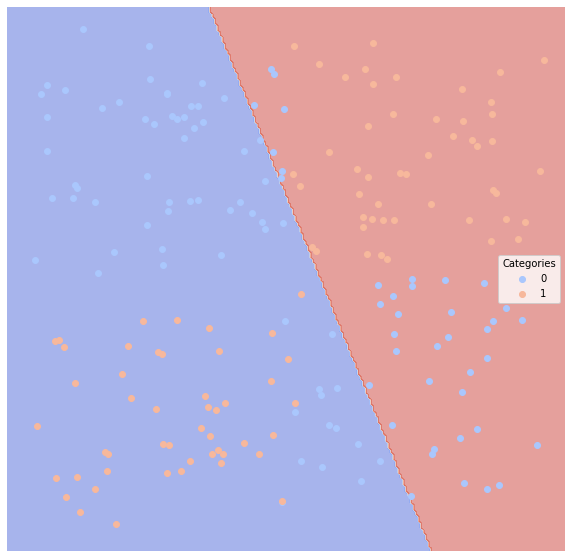

None
Time taken for method  linsvc  on dataset  5  is  0.856909990310669  seconds
.........................................
Dataset:  5
Method:  polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.395  0.612601       0.74           0.595825  0.359223
1              0.395  0.612601       0.56           0.549948  0.865979


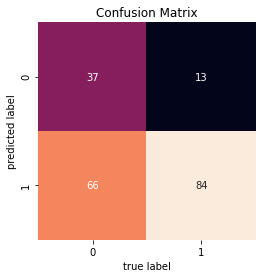

None


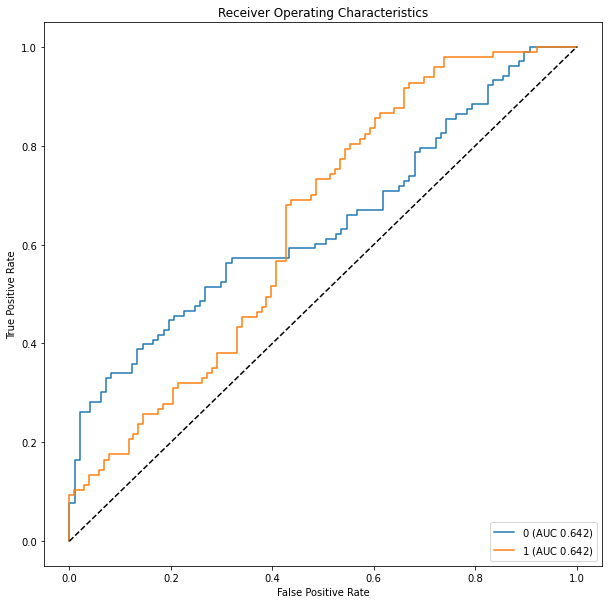

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


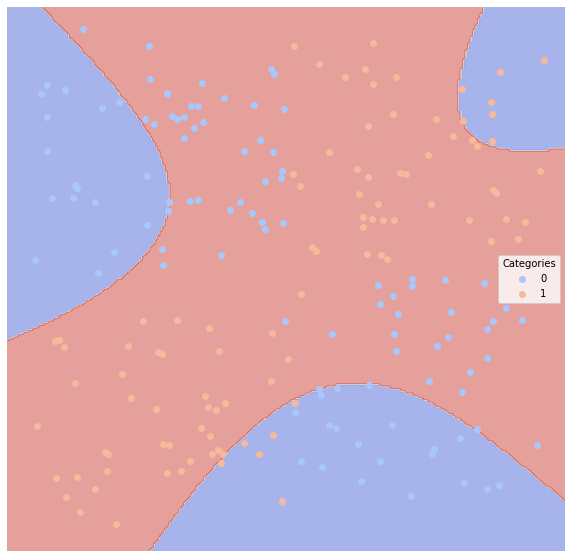

None
Time taken for method  polysvc  on dataset  5  is  1.1076865196228027  seconds
.........................................
Dataset:  5
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.05  0.950555   0.969697           0.938795  0.932039
1               0.05  0.950555   0.930693           0.916909  0.969072


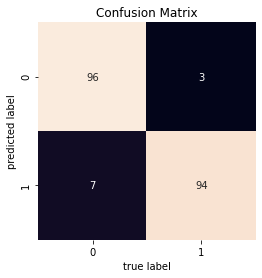

None


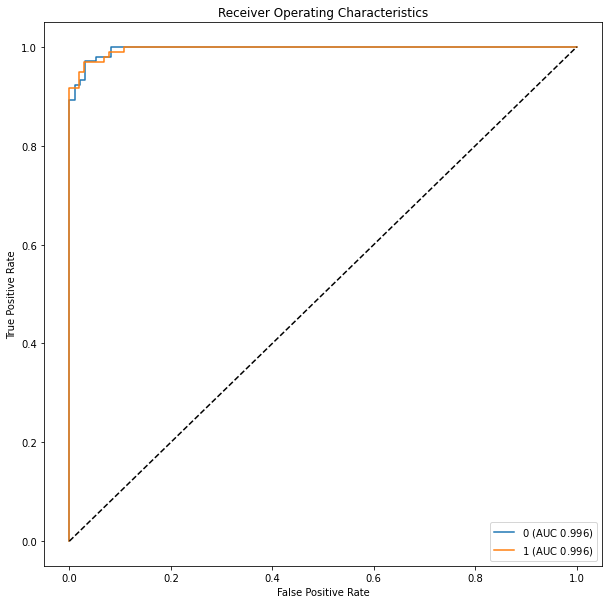

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


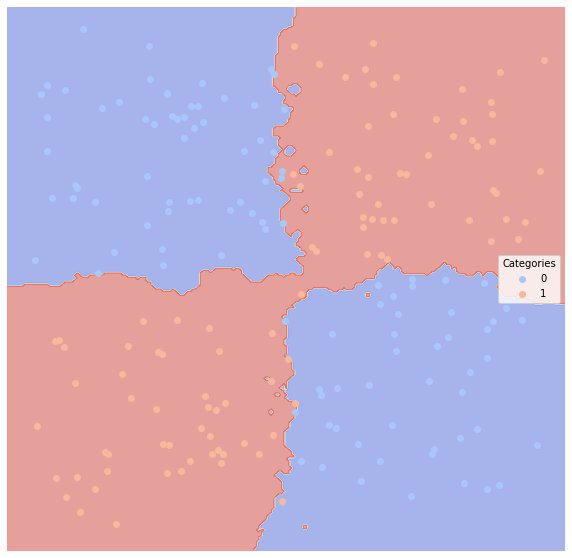

None
Time taken for method  neigh  on dataset  5  is  0.6250789165496826  seconds
.........................................
Dataset:  5
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.56  0.442198   0.447059           0.489934  0.368932
1               0.56  0.442198   0.434783           0.459115  0.515464


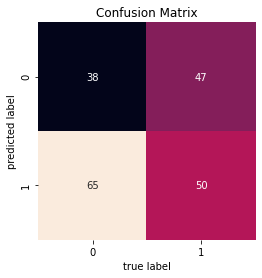

None


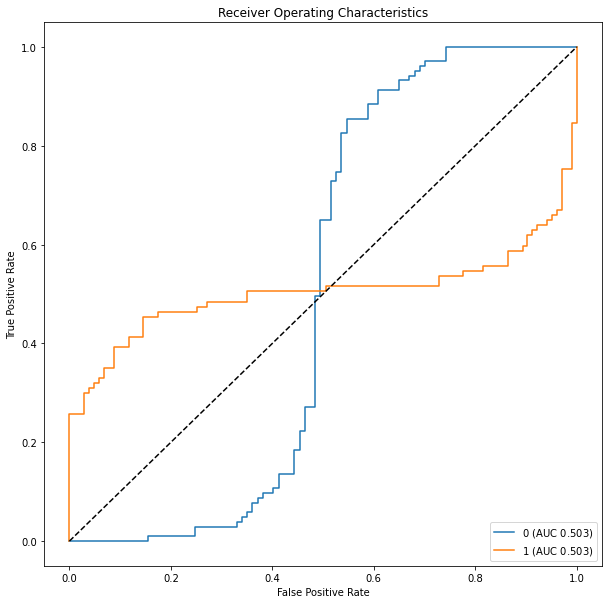

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


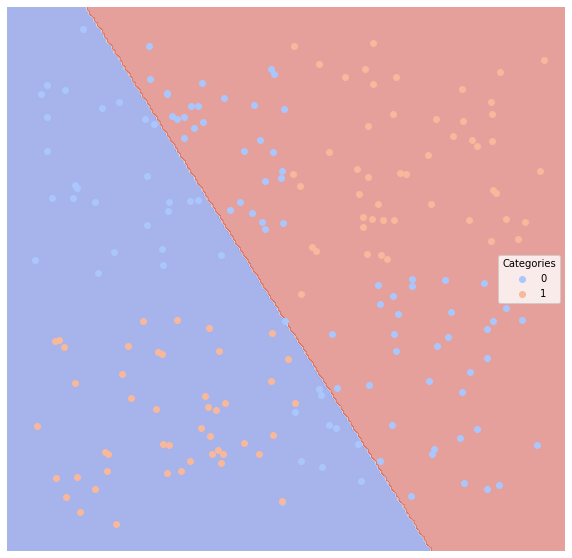

None
Time taken for method  logreg  on dataset  5  is  0.5527737140655518  seconds
.........................................
Dataset:  5
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.075  0.924782   0.923077           0.895344  0.932039
1              0.075  0.924782   0.927083           0.890623  0.917526


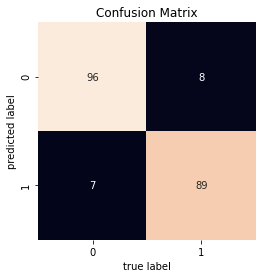

None


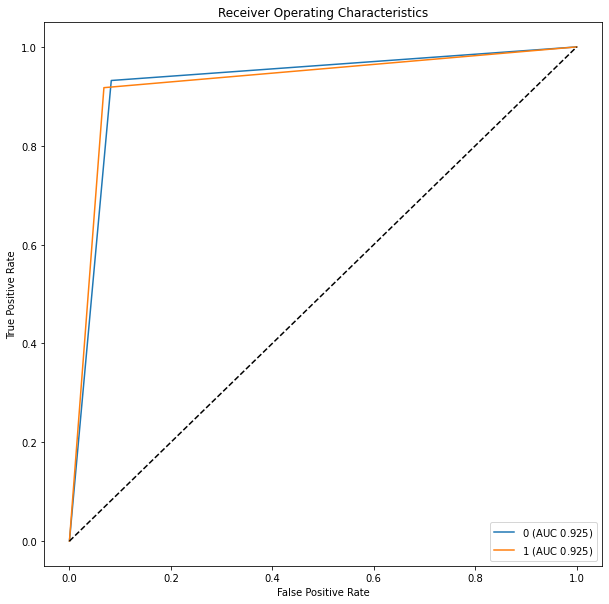

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


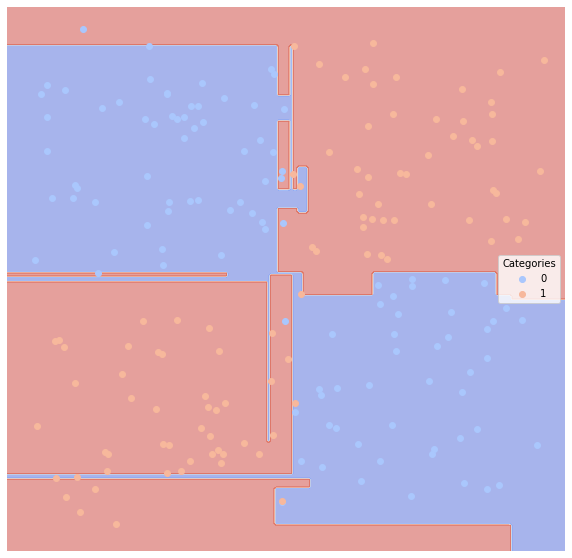

None
Time taken for method  dtree  on dataset  5  is  0.5113224983215332  seconds
.........................................
Dataset:  5
Method:  rf
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.045  0.95541       0.97           0.943495  0.941748
1              0.045  0.95541       0.94           0.925928  0.969072


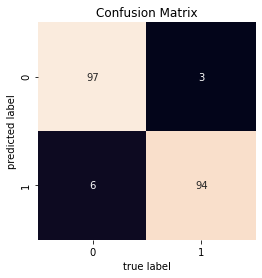

None


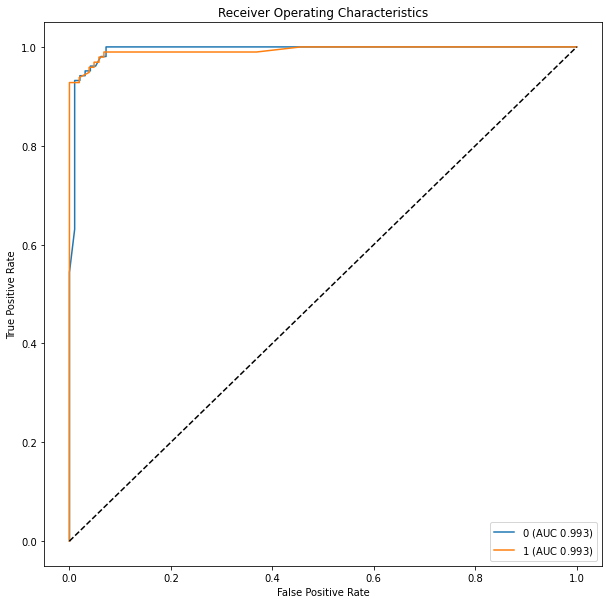

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


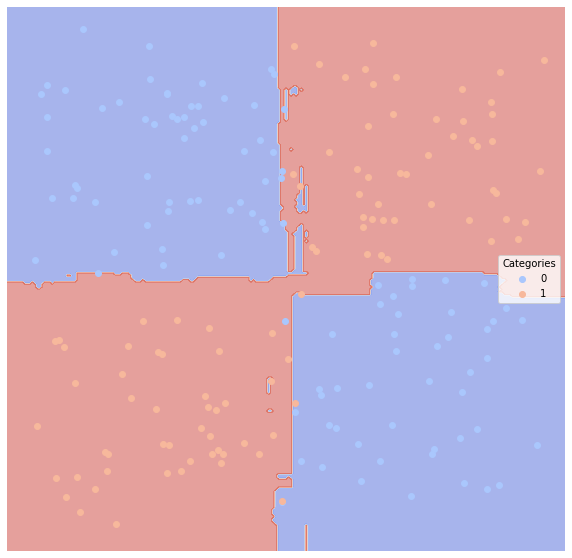

None
Time taken for method  rf  on dataset  5  is  1.038666009902954  seconds
.........................................
Dataset:  5
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.03  0.970273   0.980198           0.962132  0.961165
1               0.03  0.970273   0.959596           0.949810  0.979381


/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


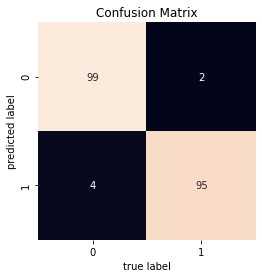

None


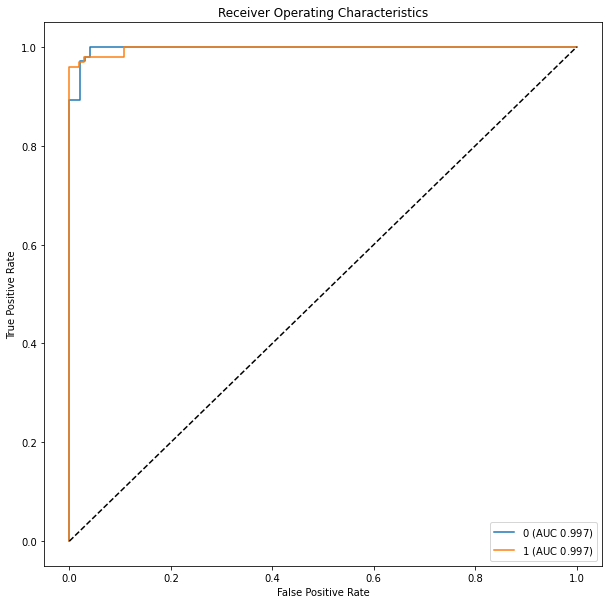

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


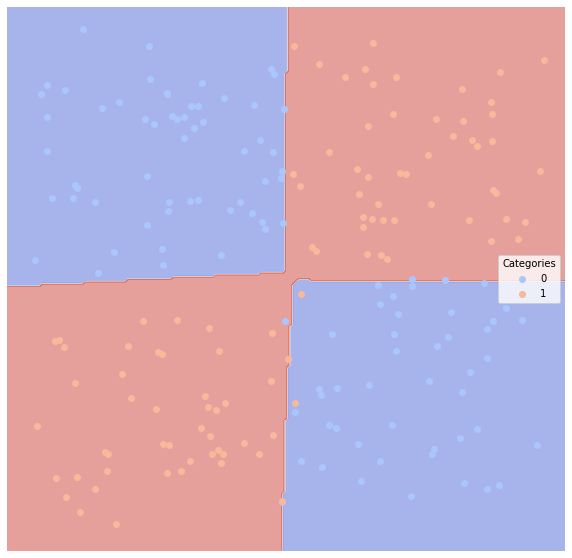

None
Time taken for method  mlp  on dataset  5  is  1.549239158630371  seconds
.........................................
Dataset:  5
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.965119   0.970588           0.952895  0.961165
1              0.035  0.965119   0.959184           0.944518  0.969072


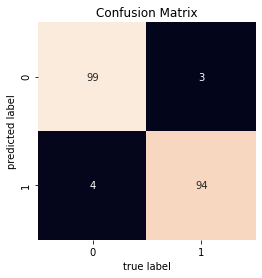

None


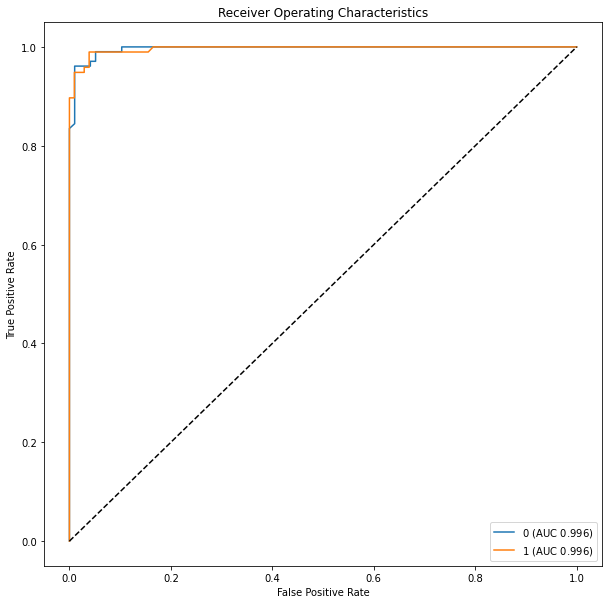

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


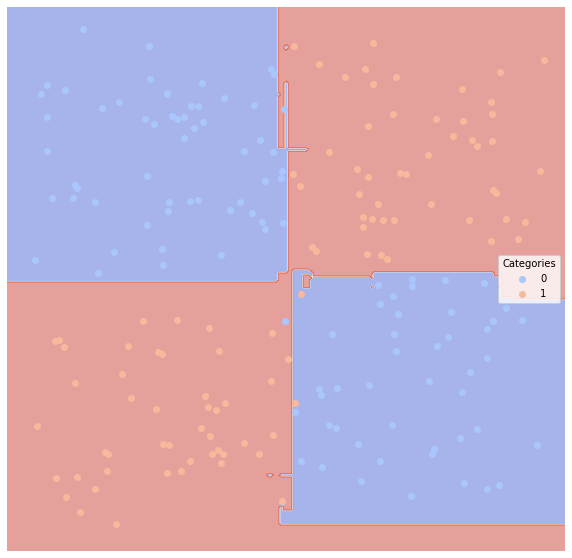

None
Time taken for method  gbc  on dataset  5  is  0.6840949058532715  seconds
.........................................
Dataset:  6
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.55  0.454309   0.450704           0.495025  0.310680
1               0.55  0.454309   0.449612           0.463840  0.597938


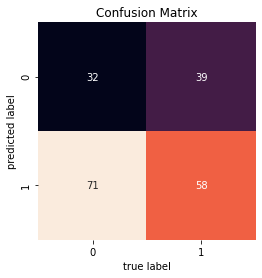

None


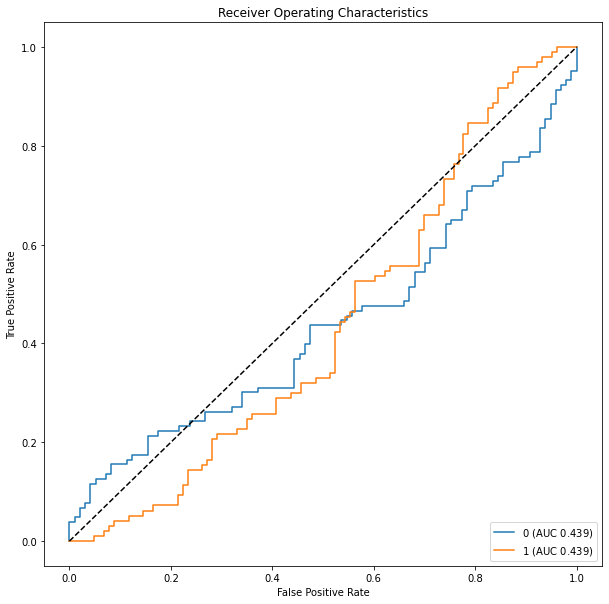

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


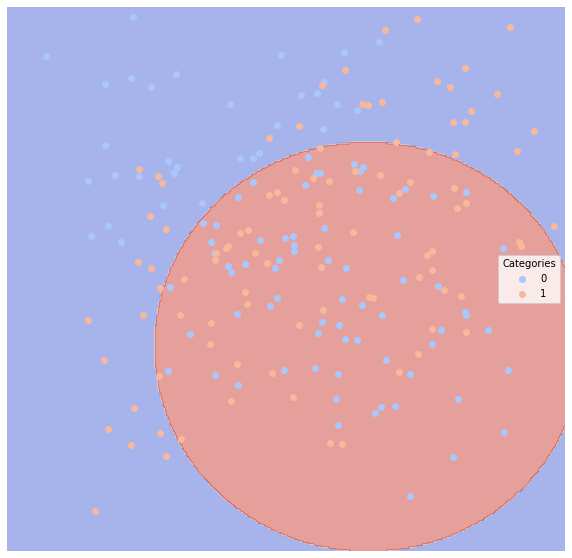

None
Time taken for method  nb  on dataset  6  is  0.7780706882476807  seconds
.........................................
Dataset:  6
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.44  0.565009   0.611940           0.553588  0.398058
1               0.44  0.565009   0.533835           0.520745  0.731959


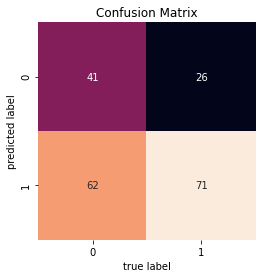

None


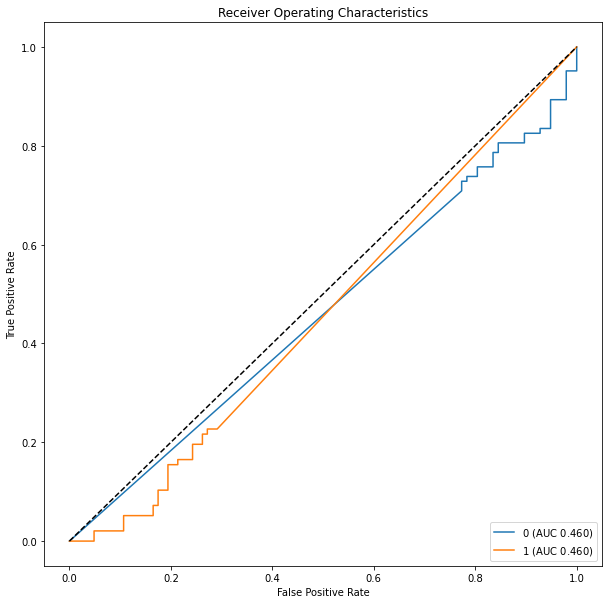

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


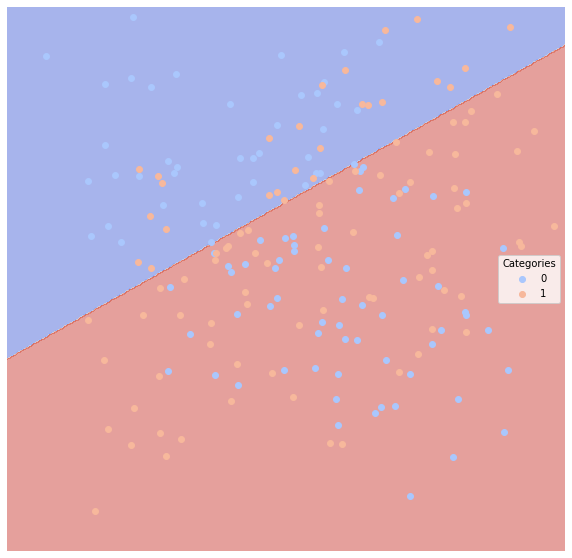

None
Time taken for method  linsvc  on dataset  6  is  1.4461135864257812  seconds
.........................................
Dataset:  6
Method:  polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.405  0.603493   0.750000           0.590291  0.320388
1              0.405  0.603493   0.551282           0.543766  0.886598


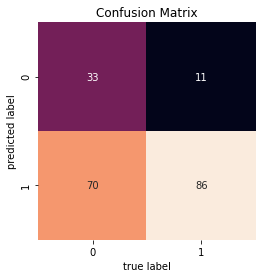

None


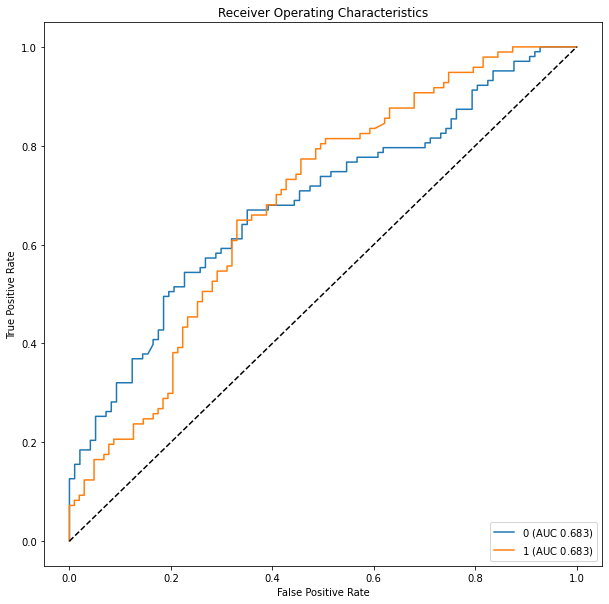

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


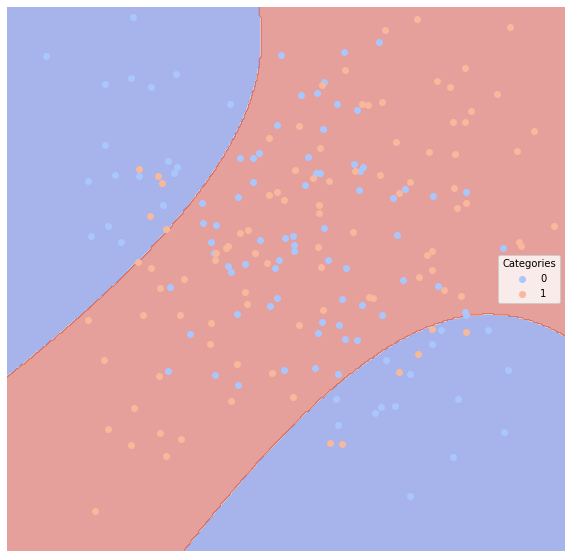

None
Time taken for method  polysvc  on dataset  6  is  1.556241512298584  seconds
.........................................
Dataset:  6
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.42  0.580222   0.595960           0.561375  0.572816
1               0.42  0.580222   0.564356           0.531632  0.587629


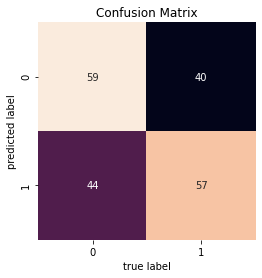

None


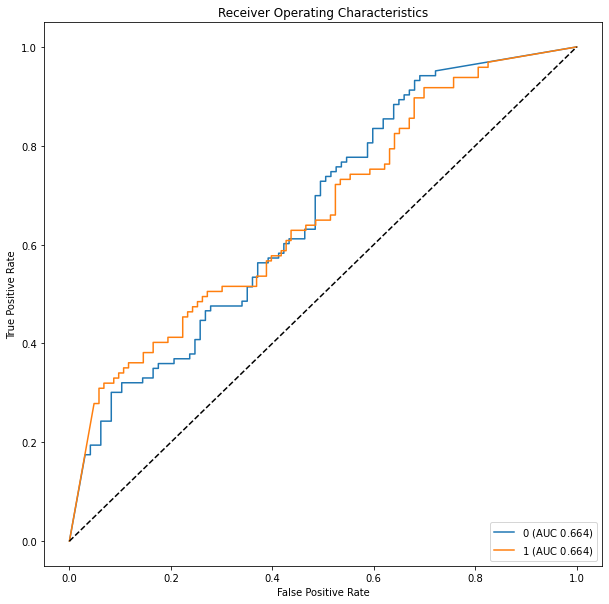

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


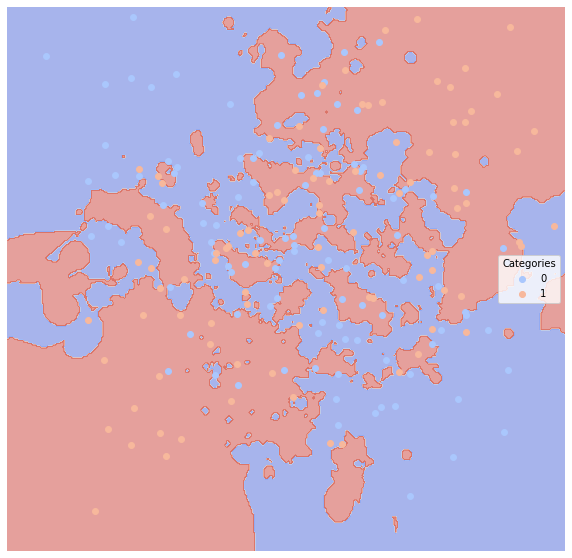

None
Time taken for method  neigh  on dataset  6  is  0.8460488319396973  seconds
.........................................
Dataset:  6
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0                0.5  0.500751   0.515789           0.515376  0.475728
1                0.5  0.500751   0.485714           0.485376  0.525773


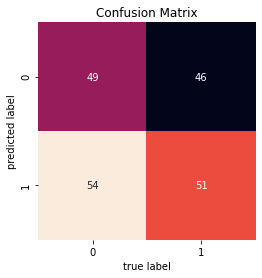

None


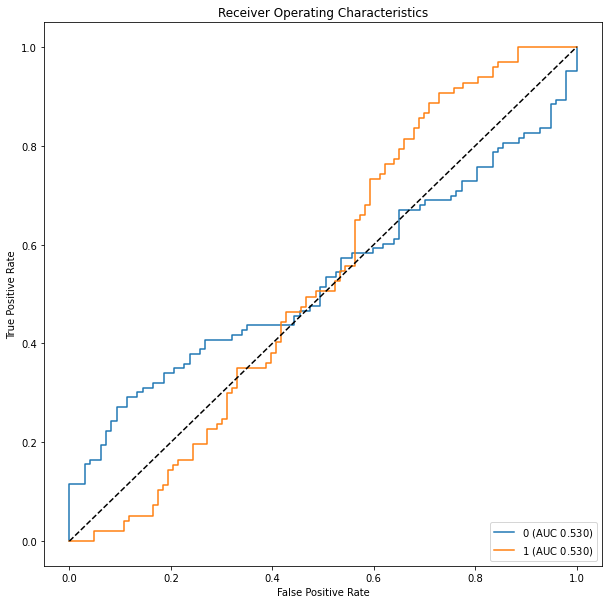

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


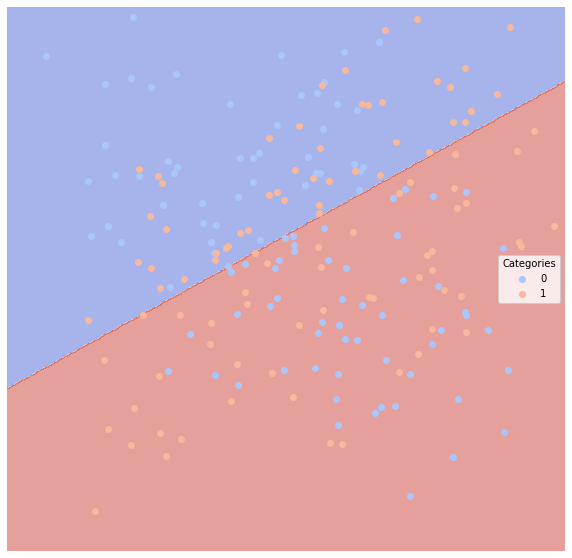

None
Time taken for method  logreg  on dataset  6  is  0.6150088310241699  seconds
.........................................
Dataset:  6
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.43  0.570814   0.589474           0.555491  0.543689
1               0.43  0.570814   0.552381           0.525290  0.597938


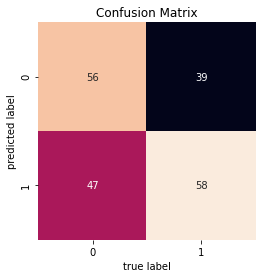

None


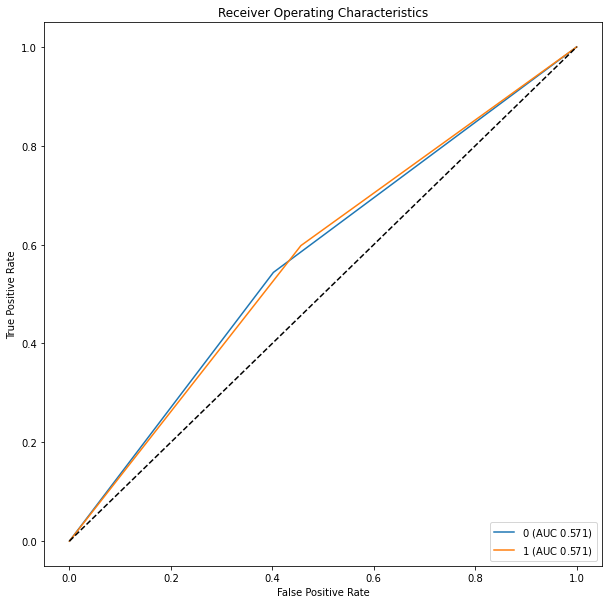

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


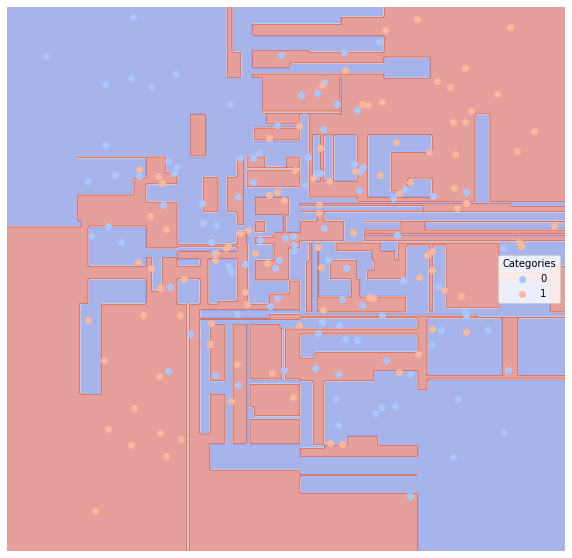

None
Time taken for method  dtree  on dataset  6  is  0.5856711864471436  seconds
.........................................
Dataset:  6
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.42  0.582324   0.611765           0.563852  0.504854
1               0.42  0.582324   0.556522           0.532190  0.659794


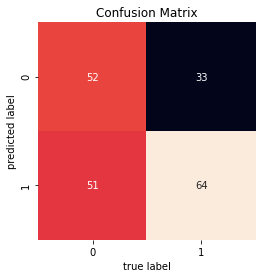

None


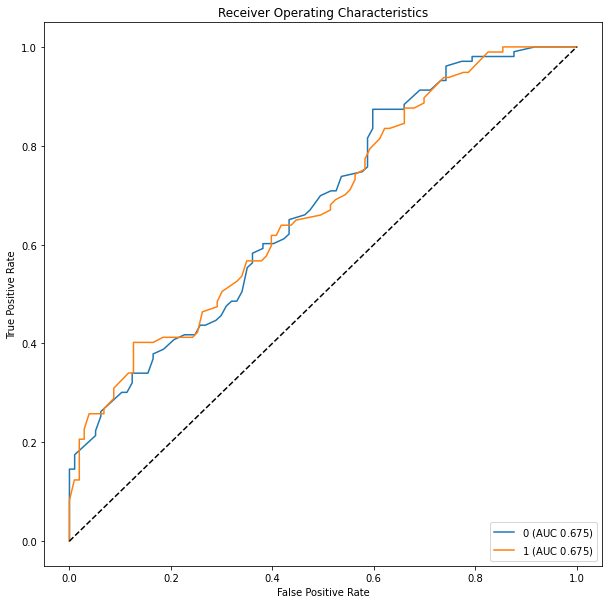

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


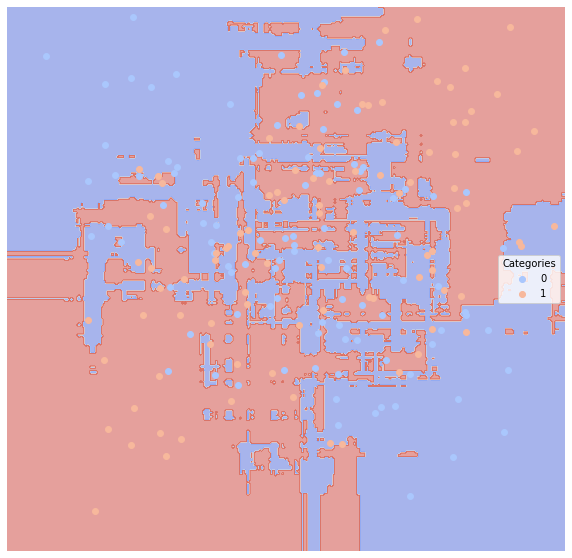

None
Time taken for method  rf  on dataset  6  is  1.7356748580932617  seconds
.........................................
Dataset:  6
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.34  0.661796   0.696629           0.624330  0.601942
1               0.34  0.661796   0.630631           0.590094  0.721649


/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


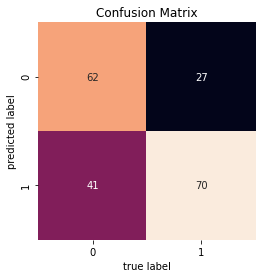

None


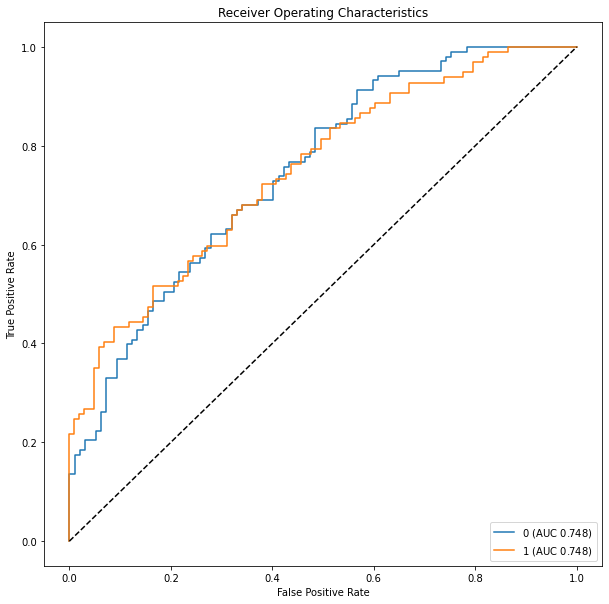

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


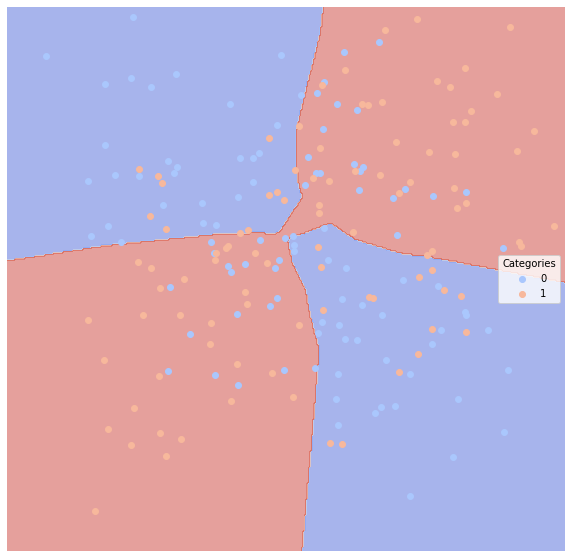

None
Time taken for method  mlp  on dataset  6  is  1.9257121086120605  seconds
.........................................
Dataset:  6
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.37  0.632069   0.666667           0.600405  0.563107
1               0.37  0.632069   0.601770           0.566859  0.701031


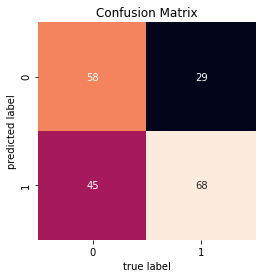

None


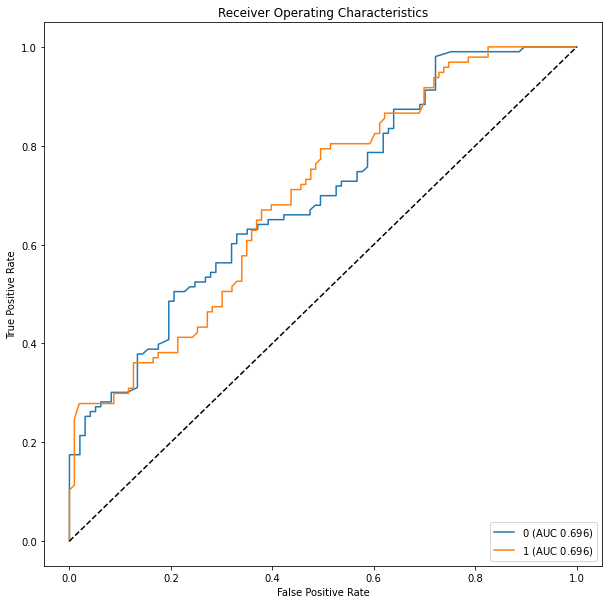

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


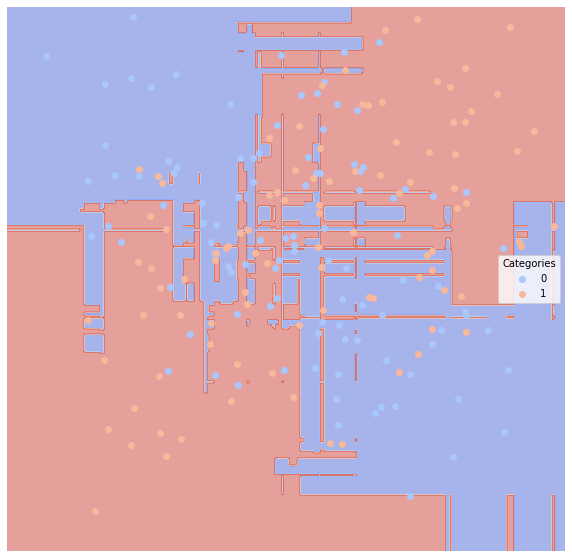

None
Time taken for method  gbc  on dataset  6  is  0.791128396987915  seconds
.........................................
Dataset:  7
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.035  0.965144   0.958763           0.943802  0.968750
1              0.035  0.965144   0.970874           0.953532  0.961538


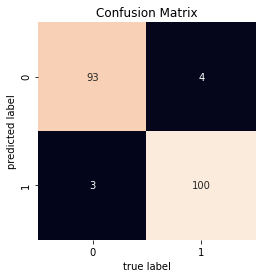

None


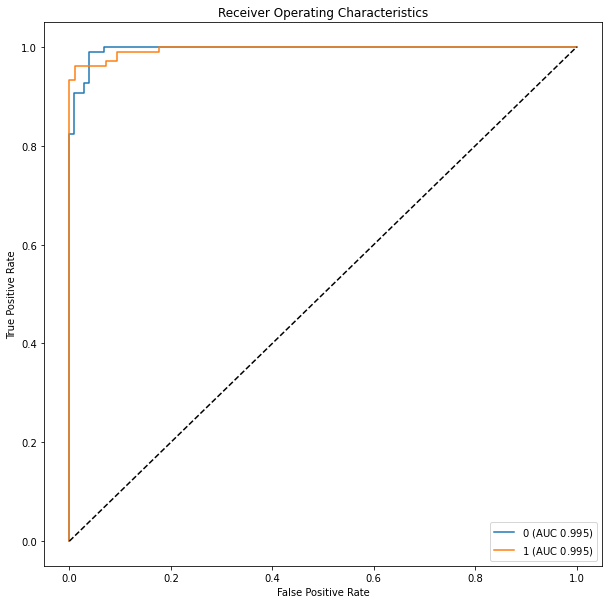

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


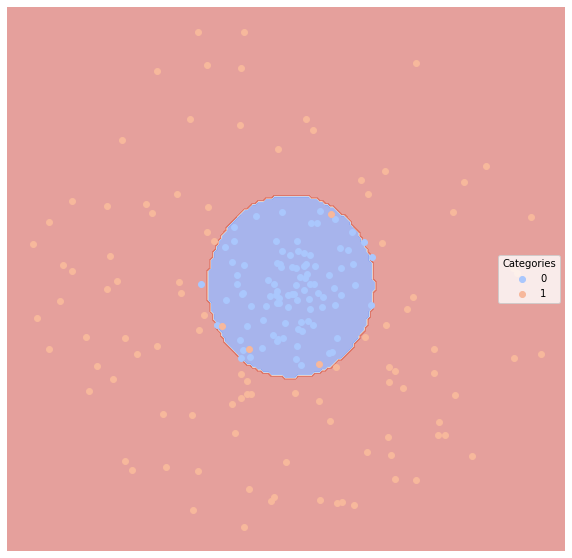

None
Time taken for method  nb  on dataset  7  is  0.5001099109649658  seconds
.........................................
Dataset:  7
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.365  0.649038   0.568047           0.568047  1.000000
1              0.365  0.649038   1.000000           0.663077  0.298077


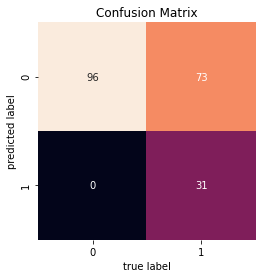

None


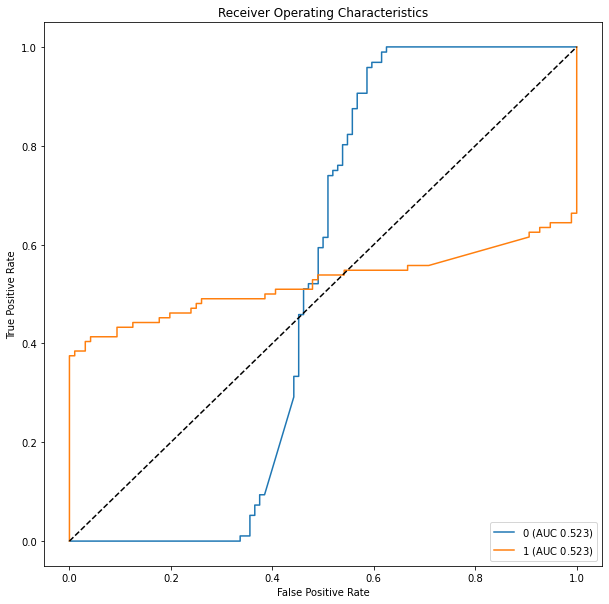

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


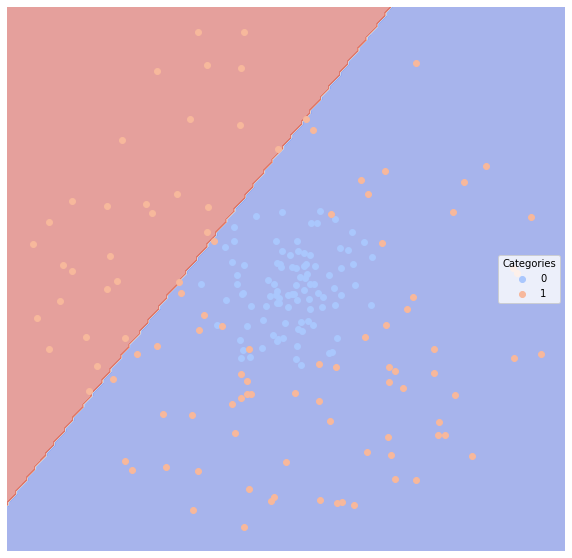

None
Time taken for method  linsvc  on dataset  7  is  0.7838461399078369  seconds
.........................................
Dataset:  7
Method:  polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.425  0.591346   0.530387           0.530387  1.000000
1              0.425  0.591346   1.000000           0.607692  0.182692


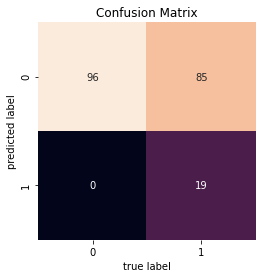

None


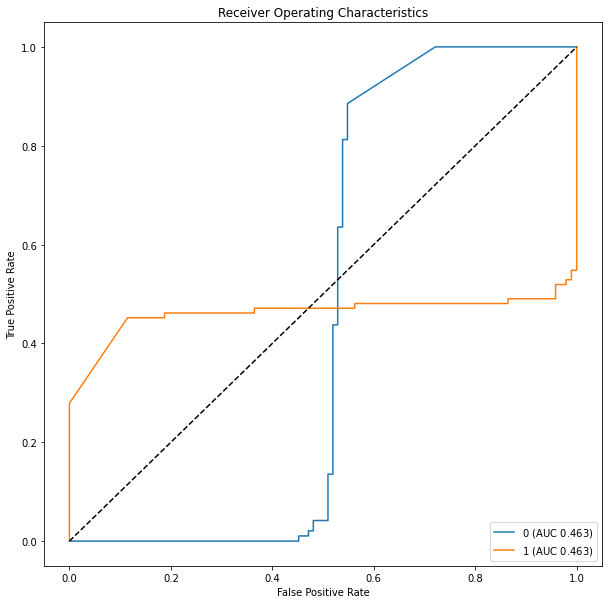

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


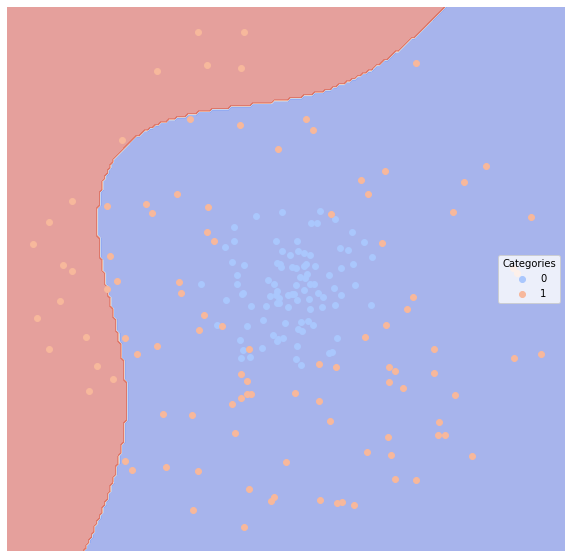

None
Time taken for method  polysvc  on dataset  7  is  0.925666332244873  seconds
.........................................
Dataset:  7
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.05  0.951122   0.921569           0.912369  0.979167
1               0.05  0.951122   0.979592           0.944239  0.923077


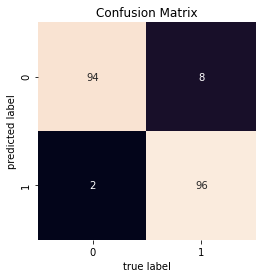

None


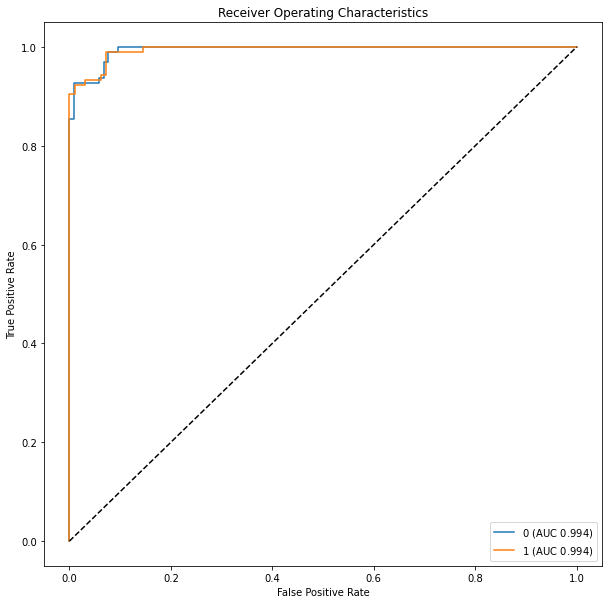

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


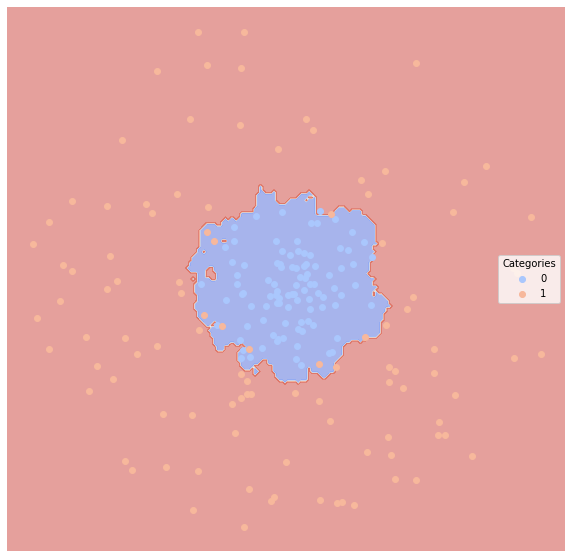

None
Time taken for method  neigh  on dataset  7  is  0.587989091873169  seconds
.........................................
Dataset:  7
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.385  0.622997   0.568345           0.552701  0.822917
1              0.385  0.622997   0.721311           0.605170  0.423077


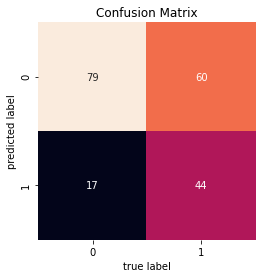

None


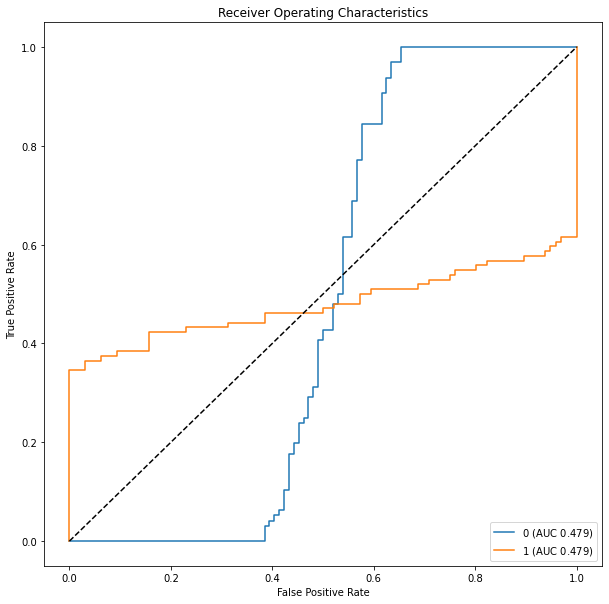

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


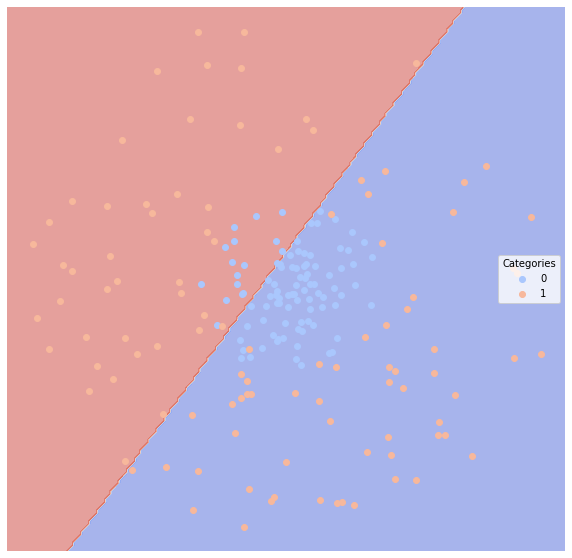

None
Time taken for method  logreg  on dataset  7  is  0.5270729064941406  seconds
.........................................
Dataset:  7
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.055  0.945513   0.929293           0.910572  0.958333
1              0.055  0.945513   0.960396           0.930754  0.932692


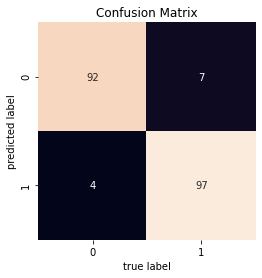

None


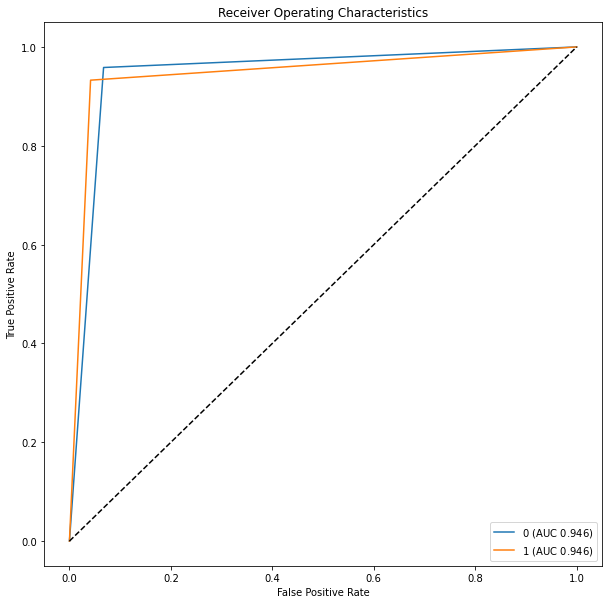

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


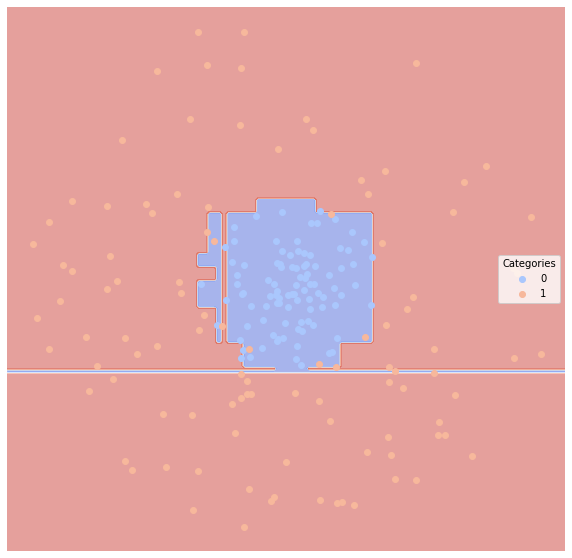

None
Time taken for method  dtree  on dataset  7  is  0.710094690322876  seconds
.........................................
Dataset:  7
Method:  rf
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.045  0.95633   0.922330           0.917722  0.989583
1              0.045  0.95633   0.989691           0.953561  0.923077


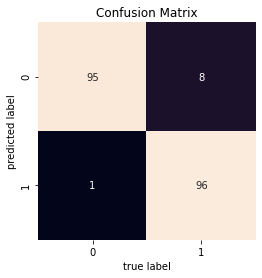

None


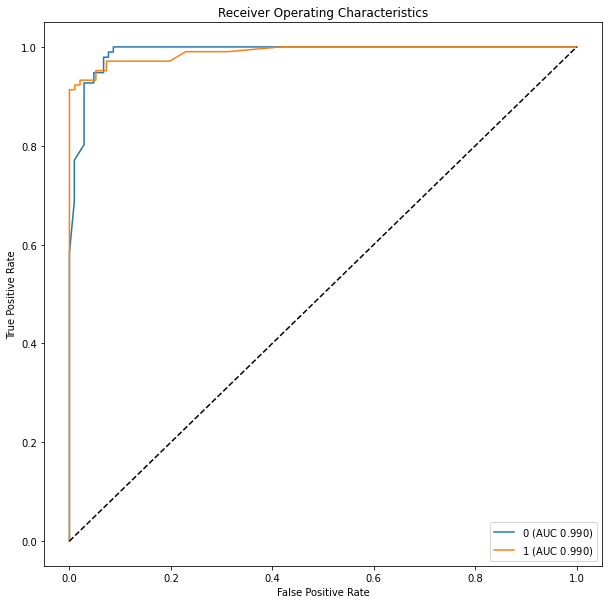

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


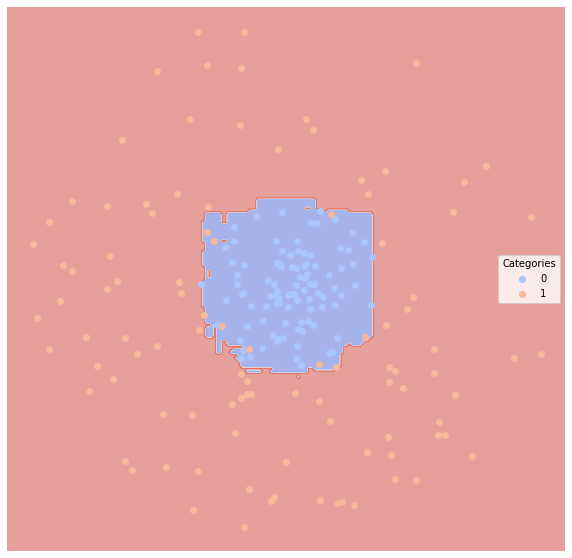

None
Time taken for method  rf  on dataset  7  is  0.9068646430969238  seconds
.........................................
Dataset:  7
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.045  0.956731   0.914286           0.914286  1.000000
1              0.045  0.956731   1.000000           0.958462  0.913462


/usr/local/lib/python3.6/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


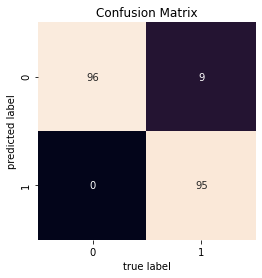

None


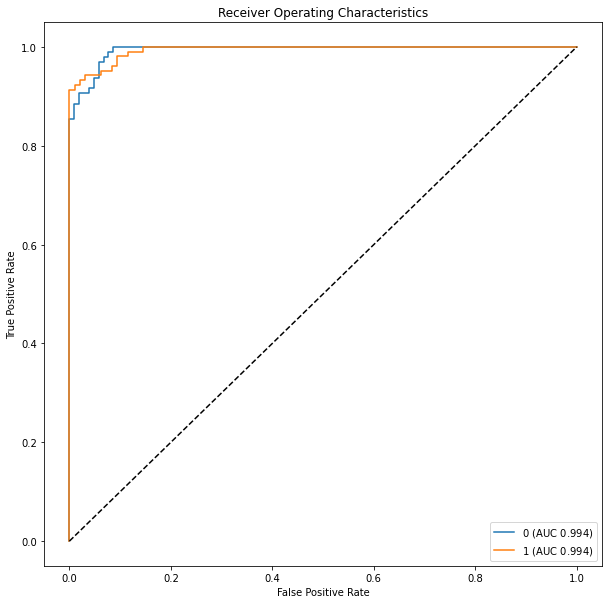

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


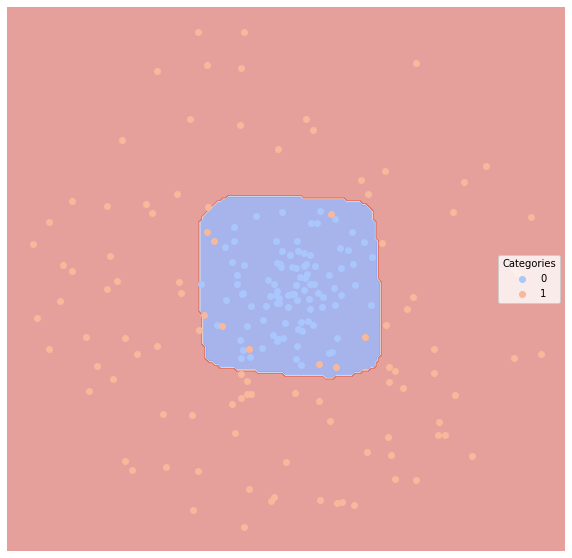

None
Time taken for method  mlp  on dataset  7  is  1.49641752243042  seconds
.........................................
Dataset:  7
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.05  0.951122   0.921569           0.912369  0.979167
1               0.05  0.951122   0.979592           0.944239  0.923077


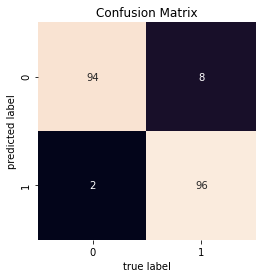

None


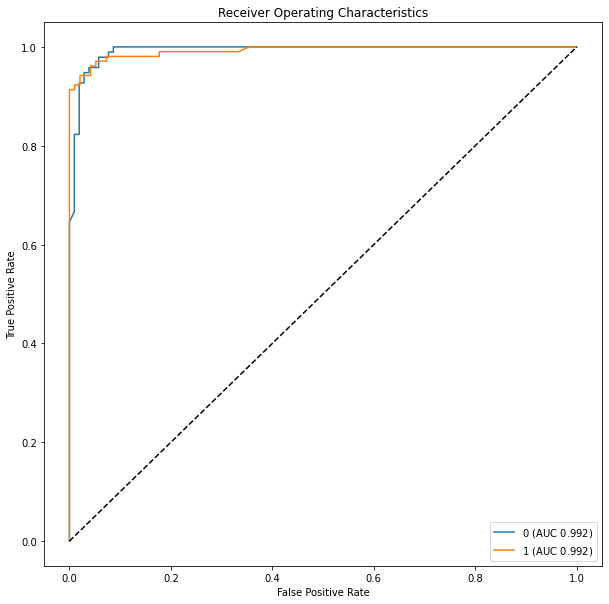

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


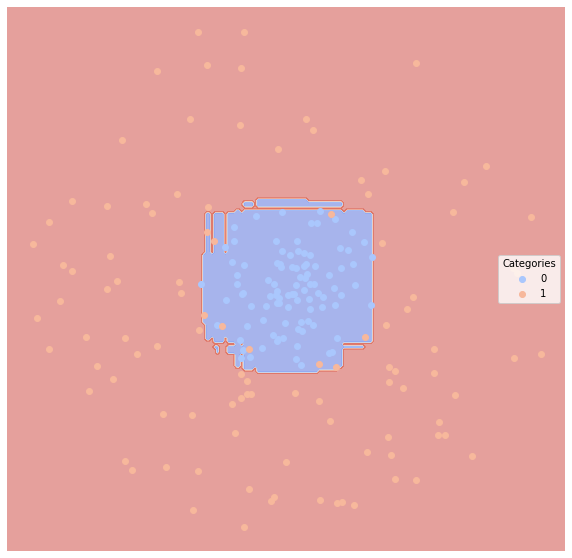

None
Time taken for method  gbc  on dataset  7  is  0.6253714561462402  seconds
.........................................
Dataset:  8
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.42  0.583333   0.551724           0.527816  0.666667
1               0.42  0.583333   0.619048           0.569524  0.500000


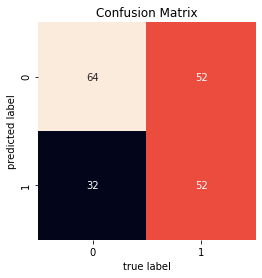

None


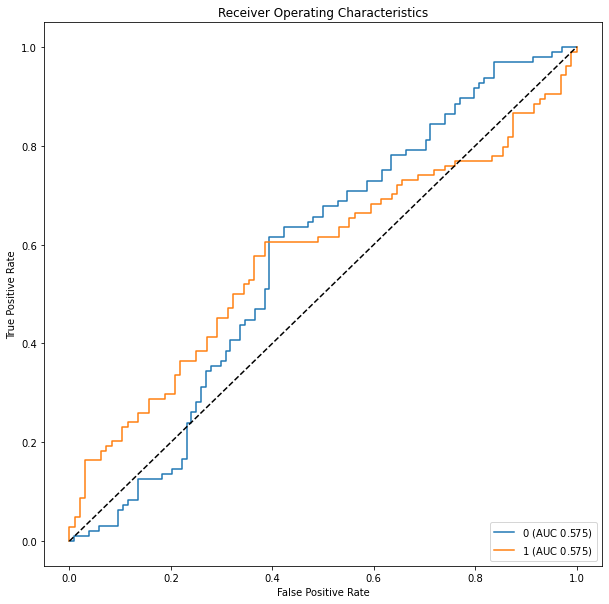

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


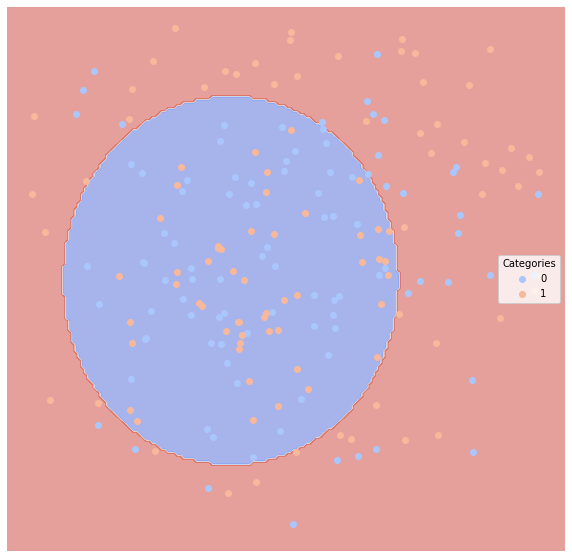

None
Time taken for method  nb  on dataset  8  is  0.490123987197876  seconds
.........................................
Dataset:  8
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.46  0.542869   0.517544           0.503074  0.614583
1               0.46  0.542869   0.569767           0.543448  0.471154


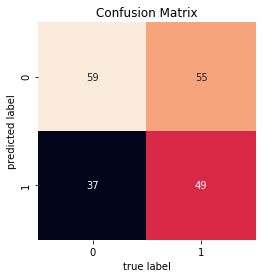

None


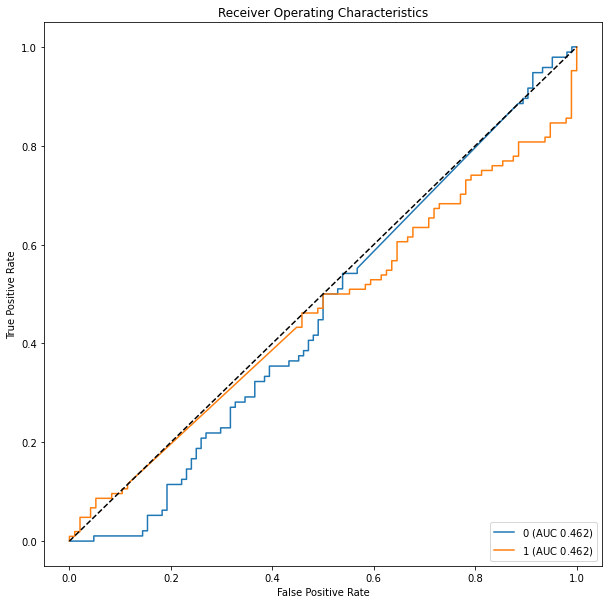

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


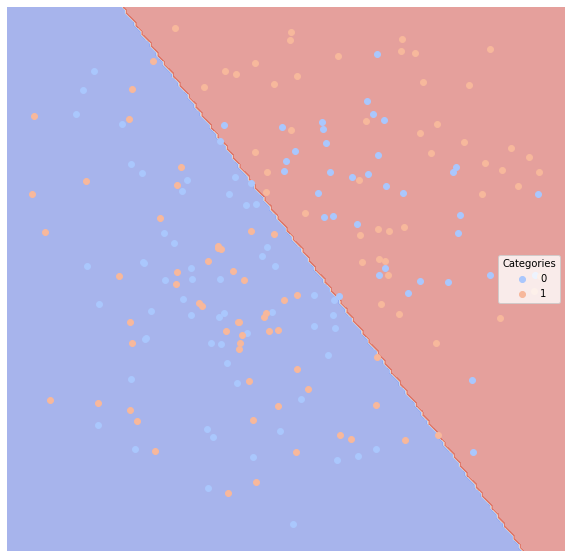

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


None
Time taken for method  linsvc  on dataset  8  is  0.7235844135284424  seconds
.........................................
Dataset:  8
Method:  polysvc
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0               0.52  0.5       0.48               0.48     1.0
1               0.52  0.5       0.00               0.52     0.0


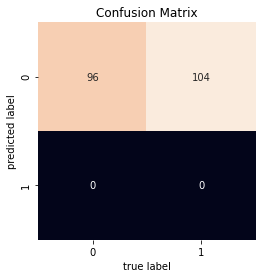

None


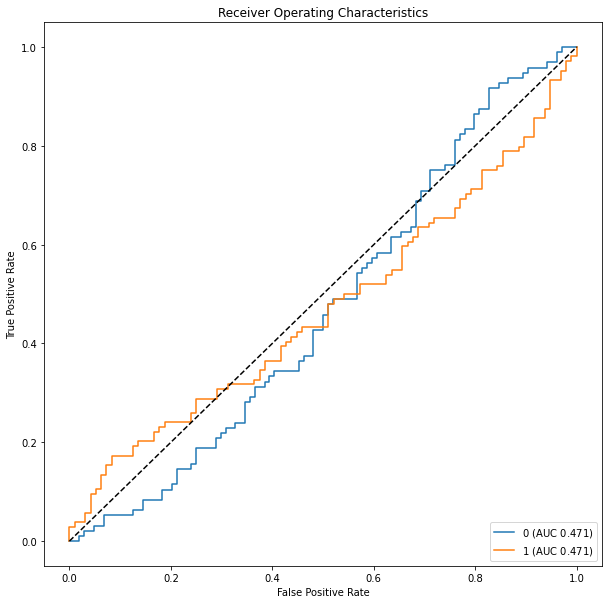

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


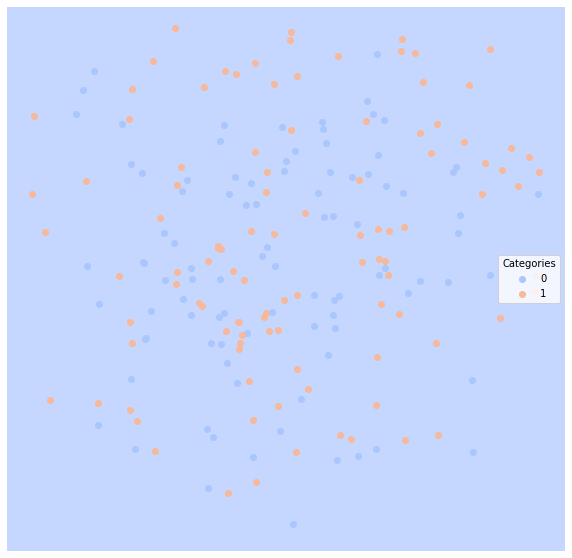

None
Time taken for method  polysvc  on dataset  8  is  0.9894099235534668  seconds
.........................................
Dataset:  8
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.54  0.459135   0.437500           0.461406  0.437500
1               0.54  0.459135   0.480769           0.501139  0.480769


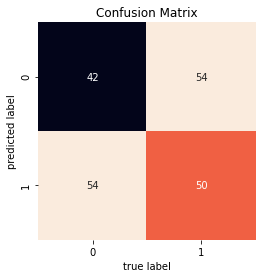

None


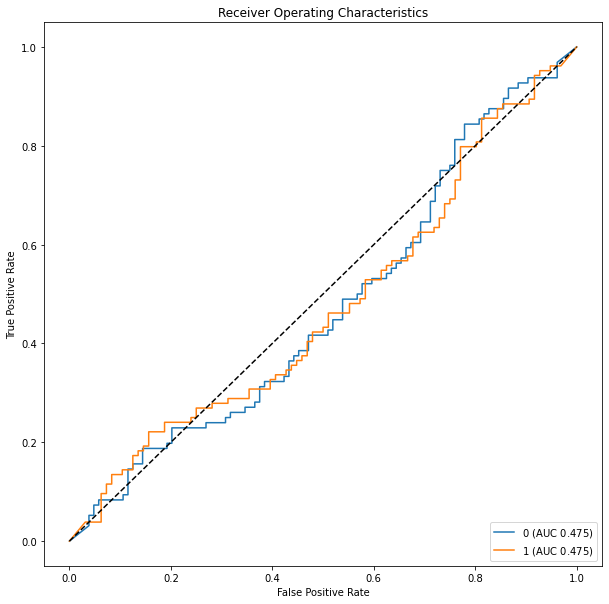

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


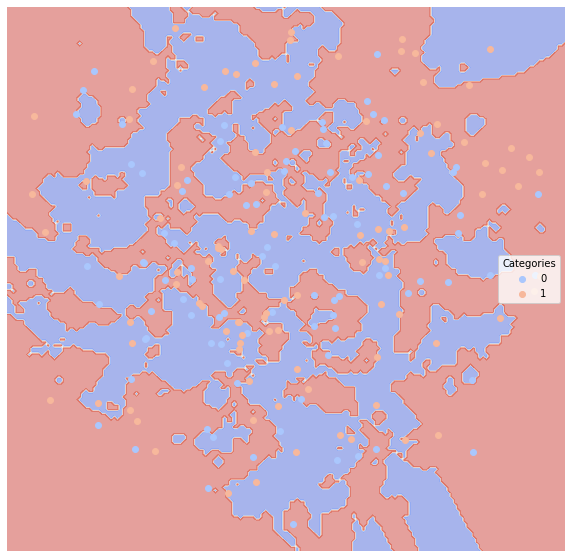

None
Time taken for method  neigh  on dataset  8  is  0.5927374362945557  seconds
.........................................
Dataset:  8
Method:  logreg
          Error_Rate      AUC  Precision  Average_Precision    Recall
Category                                                             
0              0.465  0.53726   0.513514           0.499899  0.593750
1              0.465  0.53726   0.561798           0.540095  0.480769


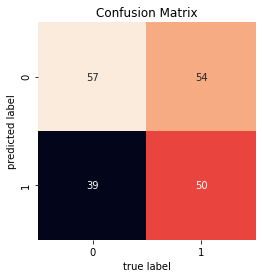

None


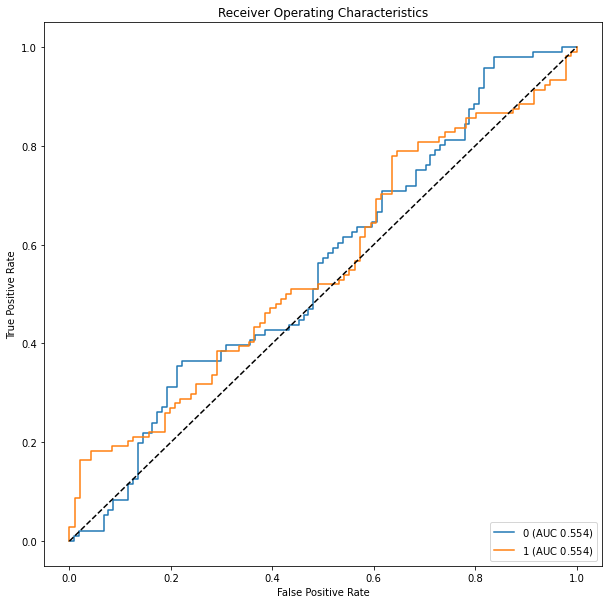

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


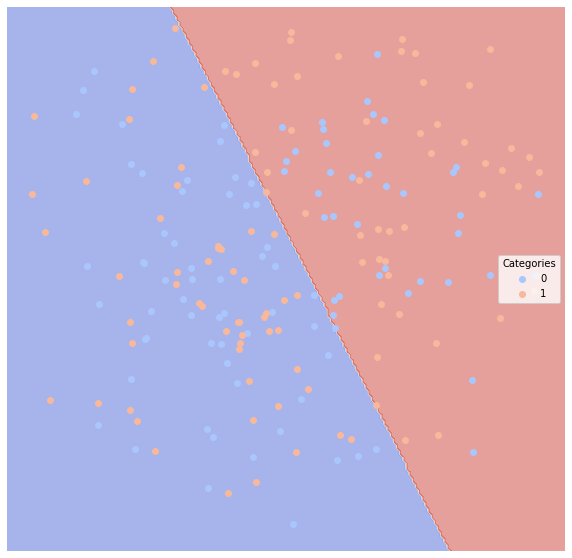

None
Time taken for method  logreg  on dataset  8  is  0.5350351333618164  seconds
.........................................
Dataset:  8
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.485  0.512821   0.494382           0.486592  0.458333
1              0.485  0.512821   0.531532           0.526542  0.567308


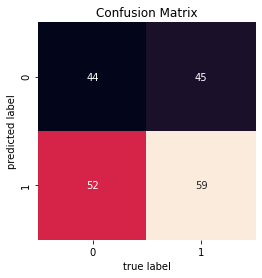

None


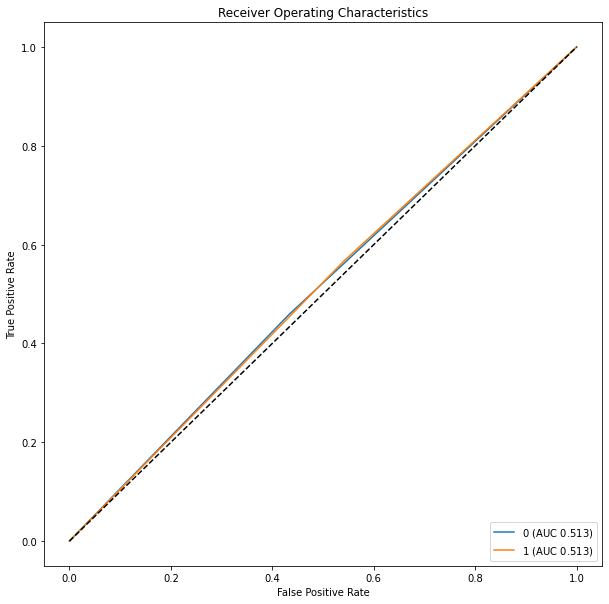

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


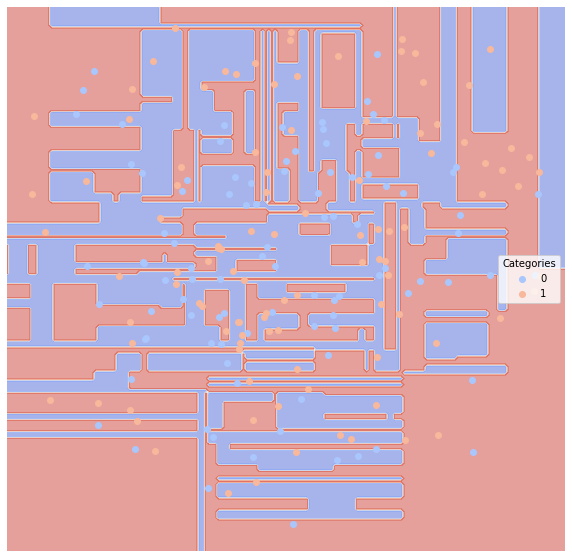

None
Time taken for method  dtree  on dataset  8  is  0.5348432064056396  seconds
.........................................
Dataset:  8
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.51  0.490385   0.470588           0.475294  0.500000
1               0.51  0.490385   0.510204           0.515290  0.480769


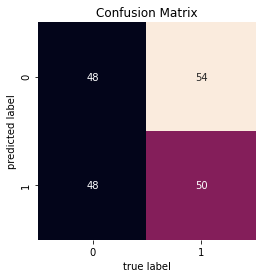

None


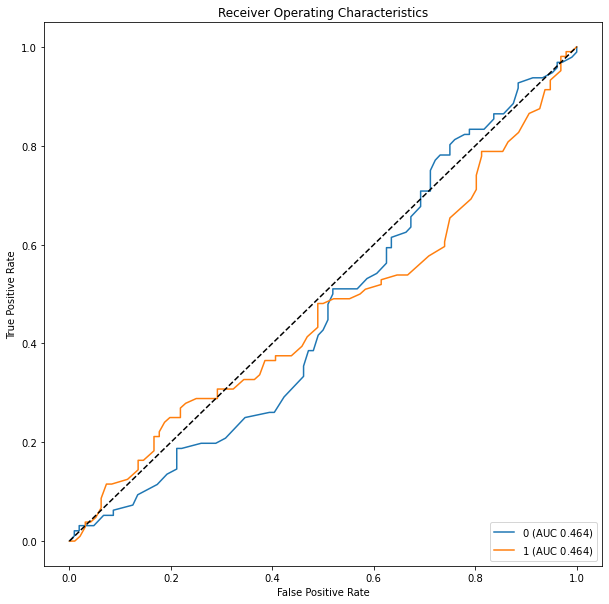

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


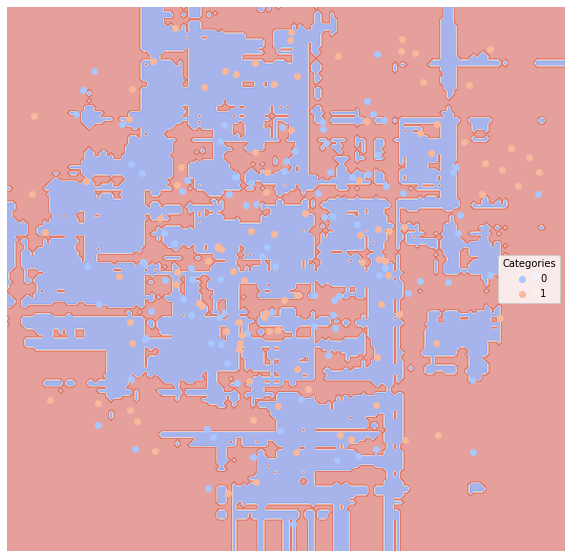

None
Time taken for method  rf  on dataset  8  is  1.008072853088379  seconds
.........................................
Dataset:  8
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.45  0.554087     0.5250           0.509531  0.656250
1               0.45  0.554087     0.5875           0.550505  0.451923


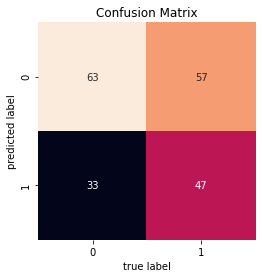

None


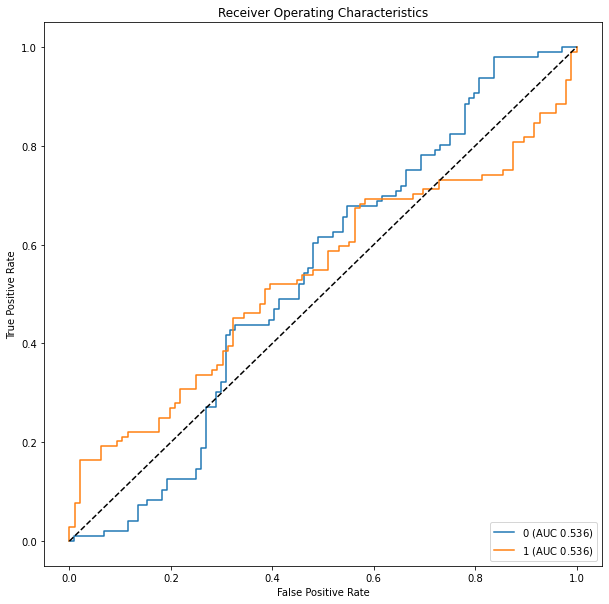

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


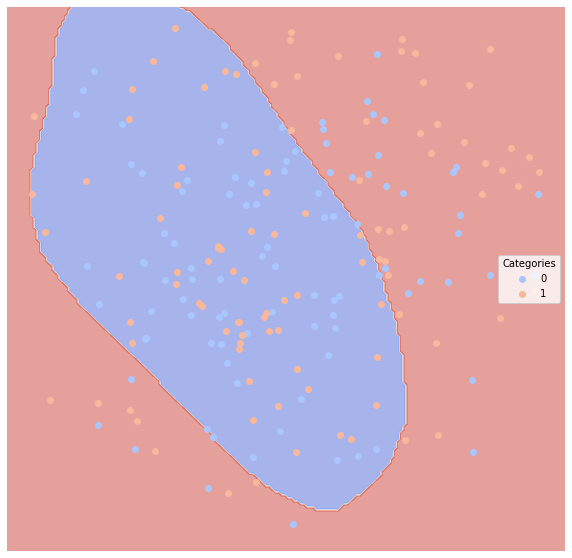

None
Time taken for method  mlp  on dataset  8  is  0.9962987899780273  seconds
.........................................
Dataset:  8
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0               0.46  0.544071   0.516667           0.503681  0.645833
1               0.46  0.544071   0.575000           0.544327  0.442308


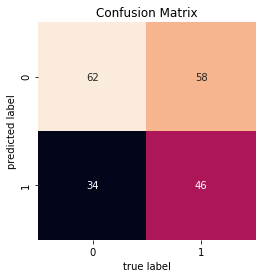

None


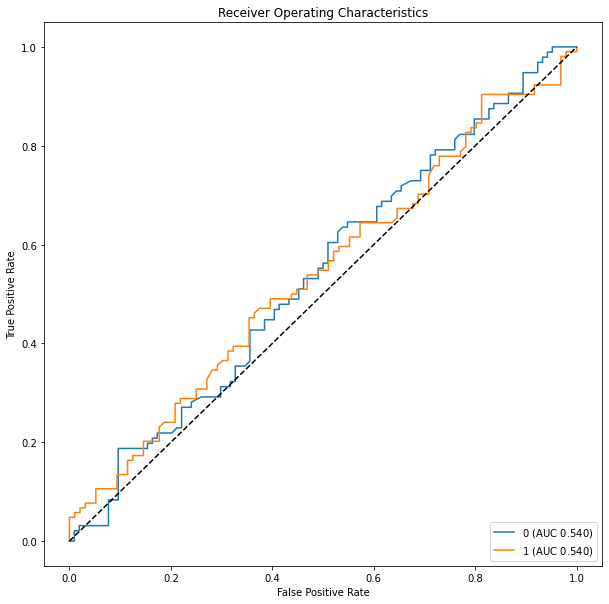

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


None


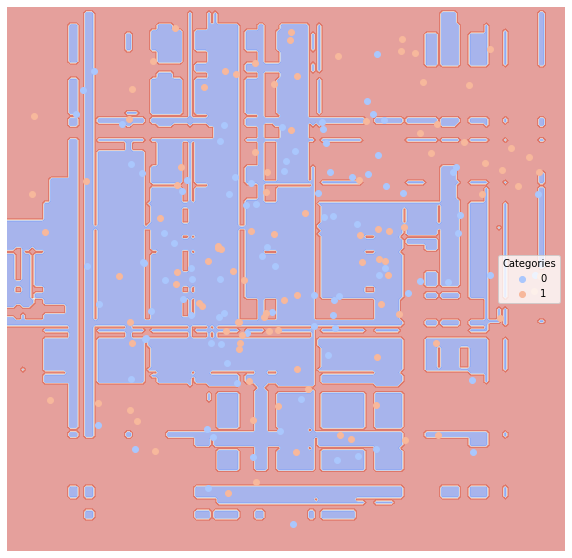

None
Time taken for method  gbc  on dataset  8  is  0.6725080013275146  seconds
.........................................
Dataset:  9
Method:  nb
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


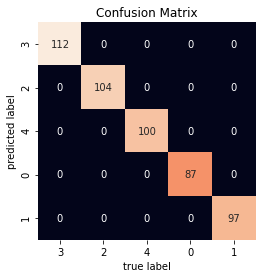

None


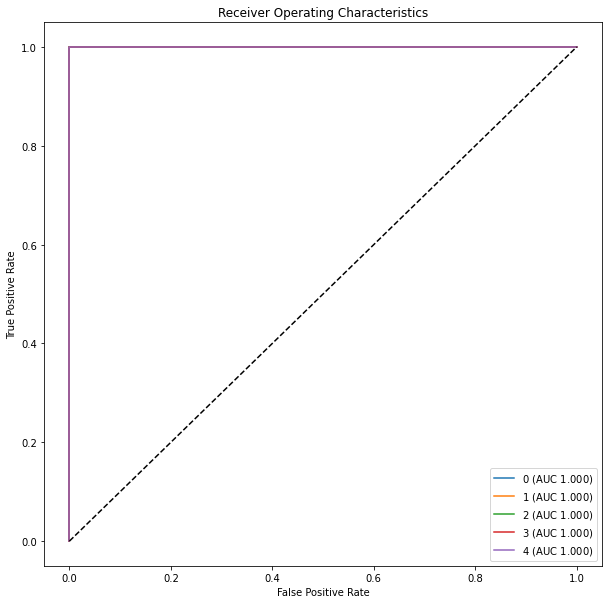

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

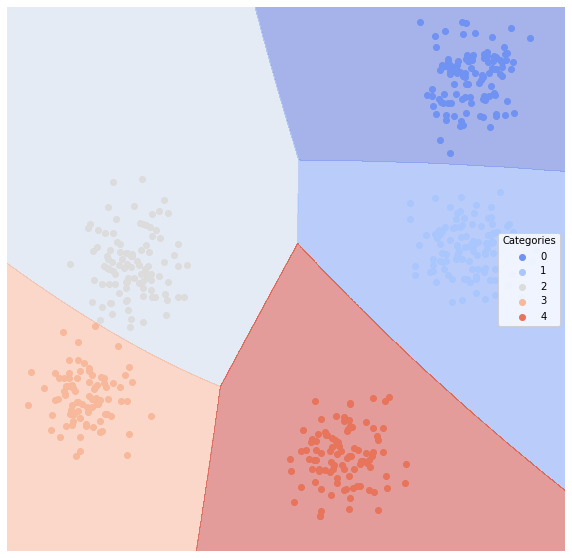

None
Time taken for method  nb  on dataset  9  is  3.573173999786377  seconds
.........................................
Dataset:  9
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.000  1.000000   1.000000           1.000000  1.000000
2              0.002  0.998750   0.990099           0.990099  1.000000
3              0.002  0.994253   1.000000           0.990506  0.988506
4              0.000  1.000000   1.000000           1.000000  1.000000


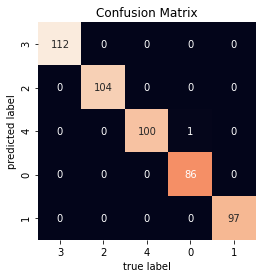

None


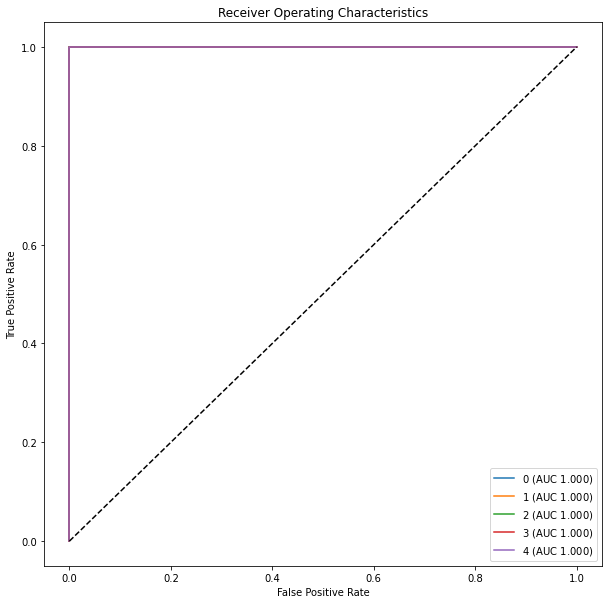

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

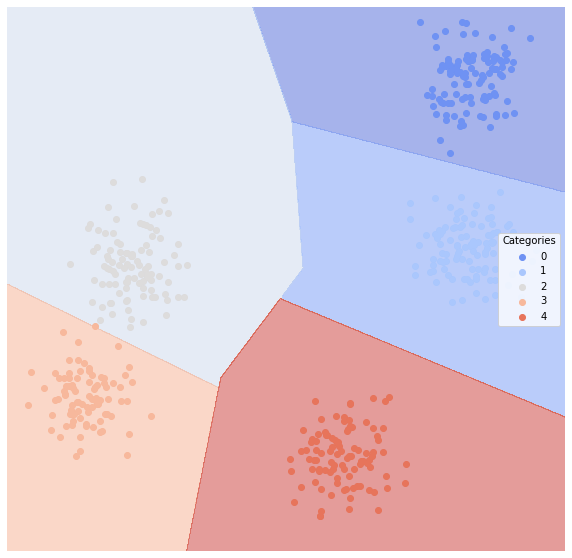

None
Time taken for method  linsvc  on dataset  9  is  4.2591798305511475  seconds
.........................................
Dataset:  9
Method:  polysvc
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


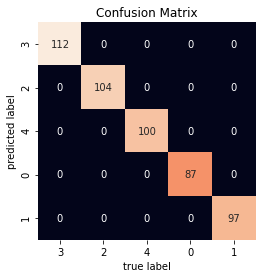

None


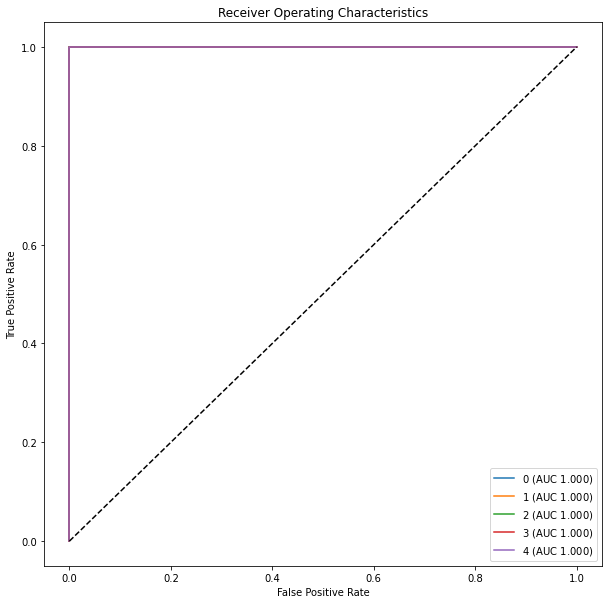

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

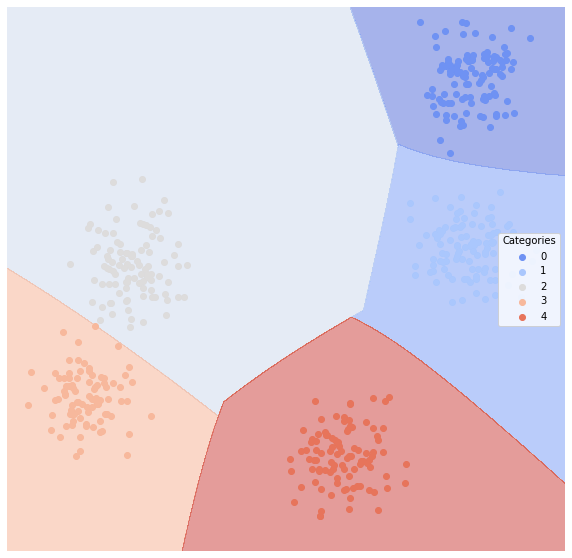

None
Time taken for method  polysvc  on dataset  9  is  8.23718786239624  seconds
.........................................
Dataset:  9
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.000  1.000000   1.000000           1.000000  1.000000
2              0.004  0.997500   0.980392           0.980392  1.000000
3              0.004  0.988506   1.000000           0.981011  0.977011
4              0.000  1.000000   1.000000           1.000000  1.000000


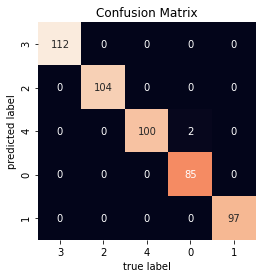

None


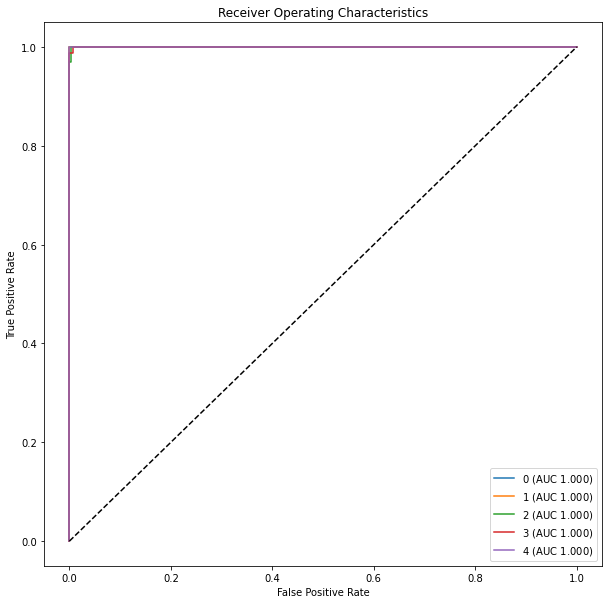

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

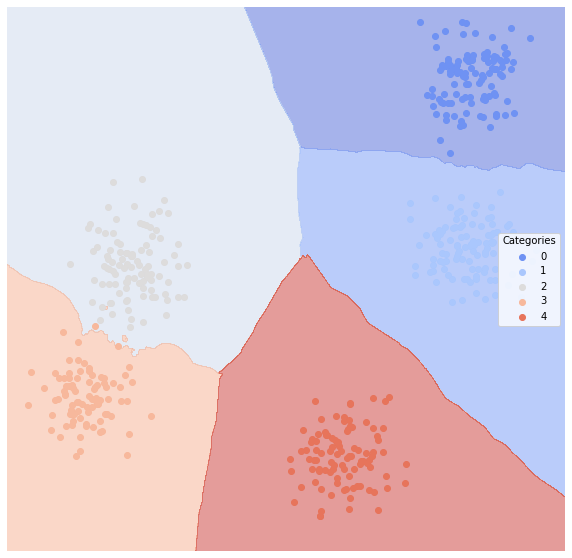

None
Time taken for method  neigh  on dataset  9  is  10.000735759735107  seconds
.........................................
Dataset:  9
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.000  1.000000   1.000000           1.000000  1.000000
2              0.002  0.998750   0.990099           0.990099  1.000000
3              0.002  0.994253   1.000000           0.990506  0.988506
4              0.000  1.000000   1.000000           1.000000  1.000000


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


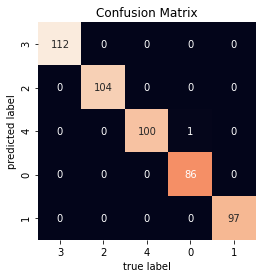

None


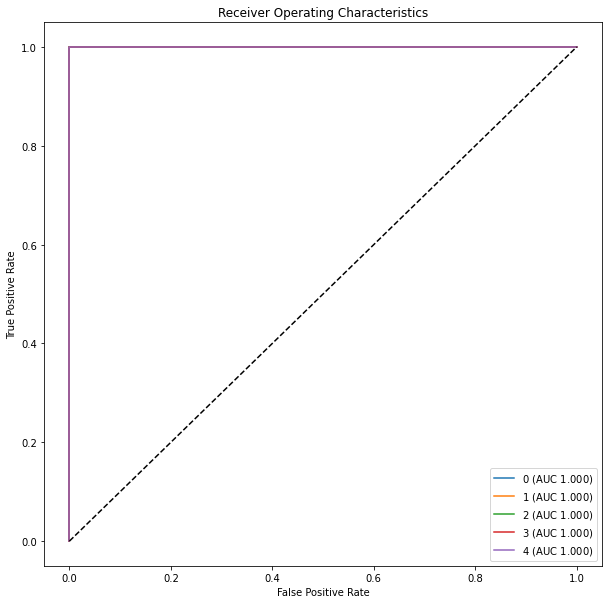

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

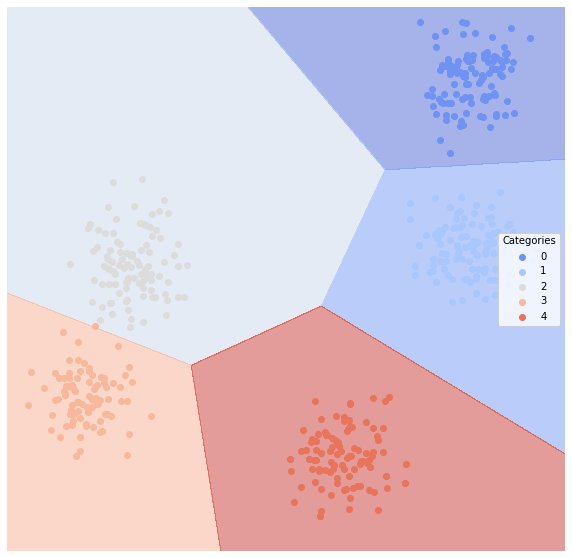

None
Time taken for method  logreg  on dataset  9  is  2.965001344680786  seconds
.........................................
Dataset:  9
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.004  0.997475   0.981132           0.981132  1.000000
2              0.002  0.998750   0.990099           0.990099  1.000000
3              0.002  0.994253   1.000000           0.990506  0.988506
4              0.004  0.989691   1.000000           0.983381  0.979381


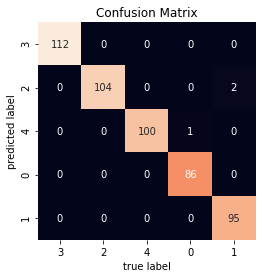

None


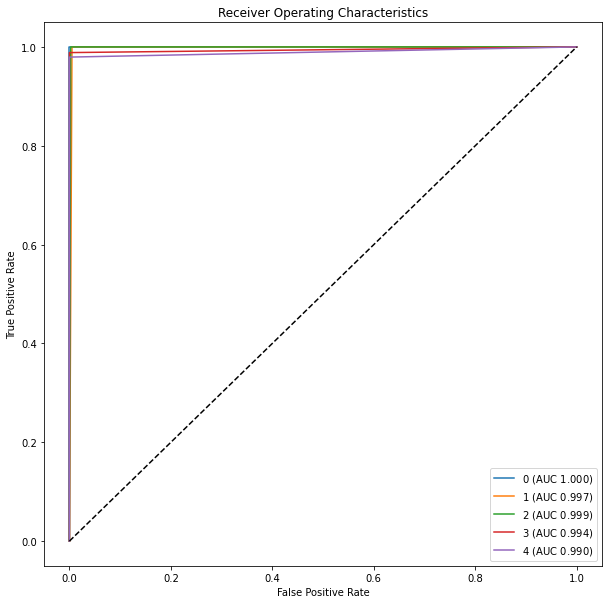

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

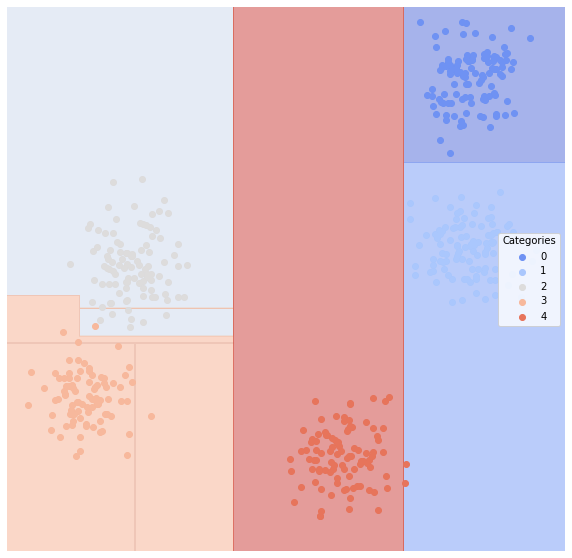

None
Time taken for method  dtree  on dataset  9  is  2.5466902256011963  seconds
.........................................
Dataset:  9
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.000  1.000000   1.000000           1.000000  1.000000
2              0.002  0.998750   0.990099           0.990099  1.000000
3              0.002  0.994253   1.000000           0.990506  0.988506
4              0.000  1.000000   1.000000           1.000000  1.000000


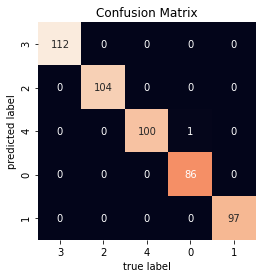

None


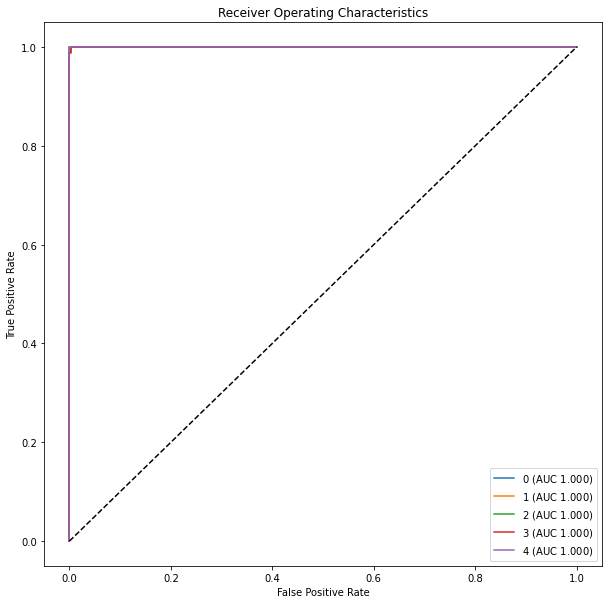

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

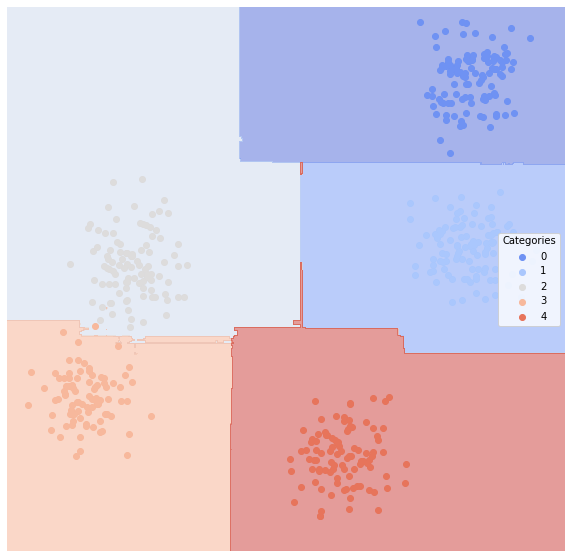

None
Time taken for method  rf  on dataset  9  is  25.700570821762085  seconds
.........................................
Dataset:  9
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.000  1.000000   1.000000           1.000000  1.000000
1              0.000  1.000000   1.000000           1.000000  1.000000
2              0.002  0.998750   0.990099           0.990099  1.000000
3              0.002  0.994253   1.000000           0.990506  0.988506
4              0.000  1.000000   1.000000           1.000000  1.000000


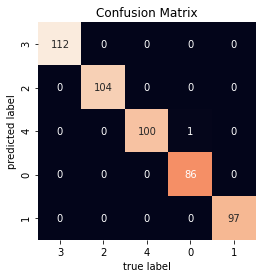

None


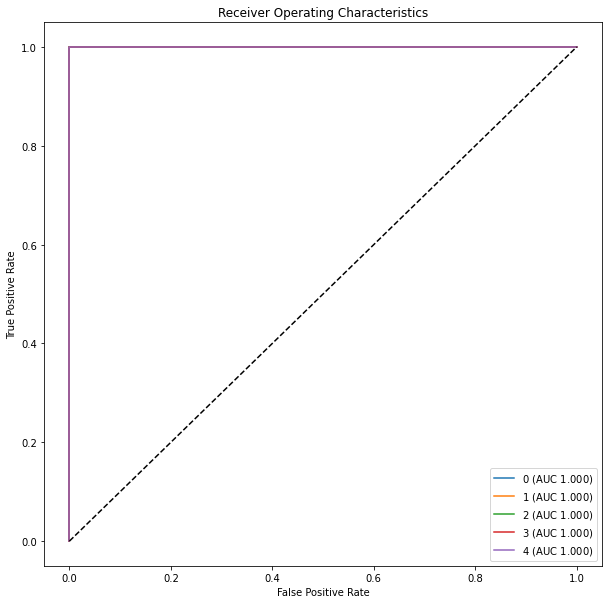

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

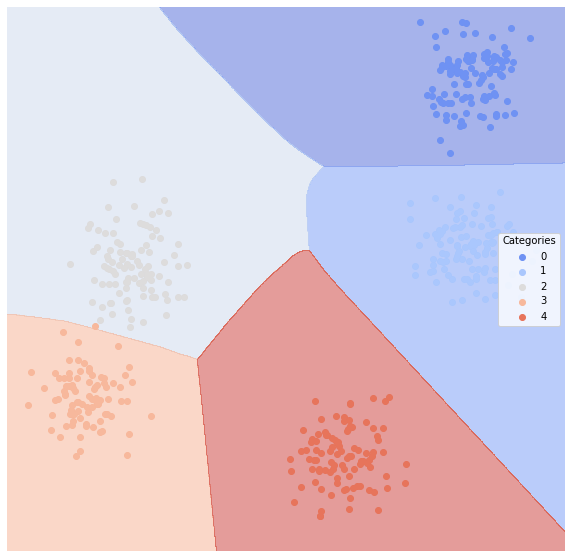

None
Time taken for method  mlp  on dataset  9  is  8.803734302520752  seconds
.........................................
Dataset:  9
Method:  gbc
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
0                0.0  1.0        1.0                1.0     1.0
1                0.0  1.0        1.0                1.0     1.0
2                0.0  1.0        1.0                1.0     1.0
3                0.0  1.0        1.0                1.0     1.0
4                0.0  1.0        1.0                1.0     1.0


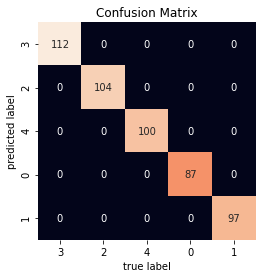

None


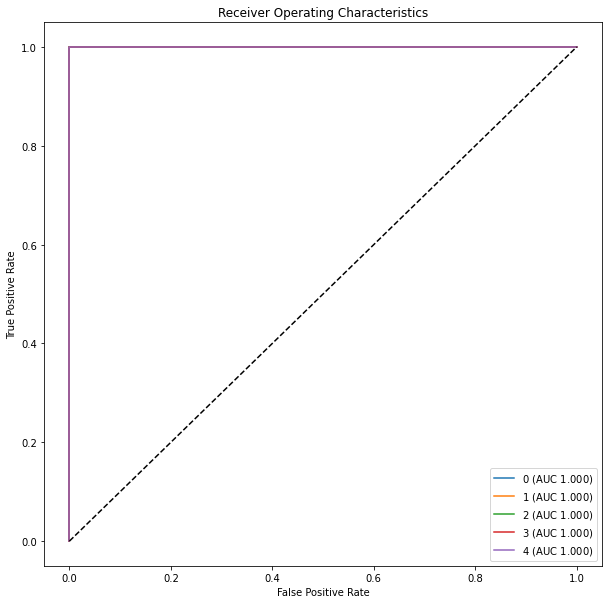

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

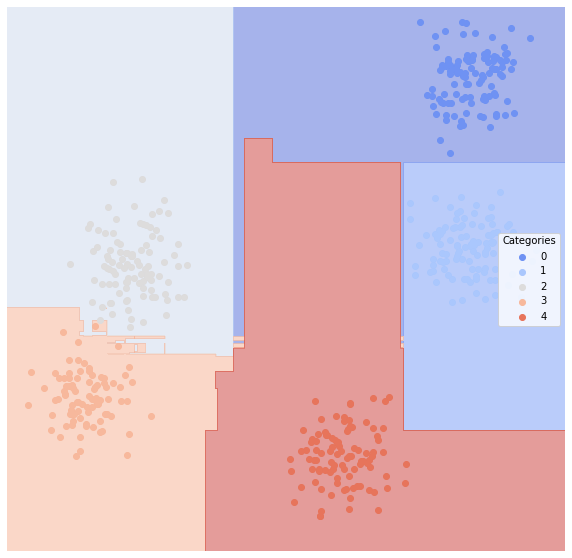

None
Time taken for method  gbc  on dataset  9  is  19.232873916625977  seconds
.........................................
Dataset:  10
Method:  nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.188  0.697834   0.580645           0.397659  0.495413
1              0.090  0.862628   0.788462           0.661751  0.780952
2              0.154  0.791100   0.630252           0.503675  0.694444
3              0.004  0.989899   1.000000           0.983798  0.979798
4              0.176  0.689828   0.448276           0.301301  0.493671


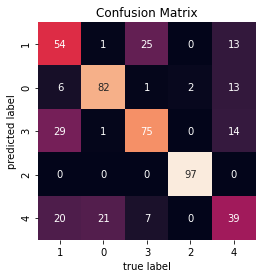

None


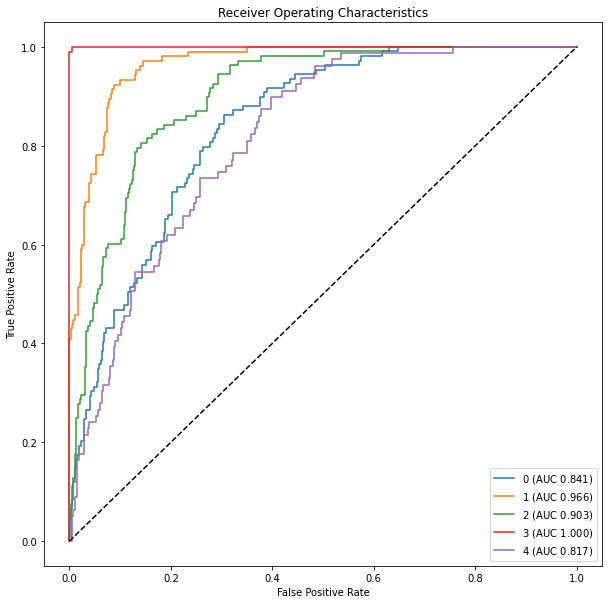

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

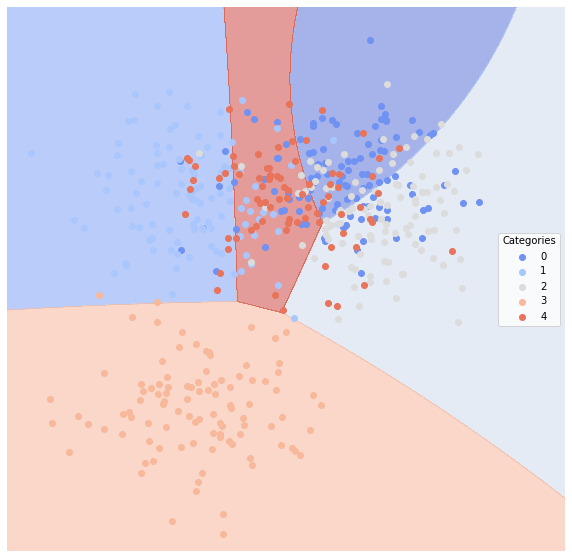

None
Time taken for method  nb  on dataset  10  is  5.131804704666138  seconds
.........................................
Dataset:  10
Method:  linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.188  0.691218   0.584270           0.392734  0.477064
1              0.088  0.867390   0.790476           0.668853  0.790476
2              0.150  0.797005   0.638655           0.513424  0.703704
3              0.000  1.000000   1.000000           1.000000  1.000000
4              0.178  0.688641   0.443182           0.298786  0.493671


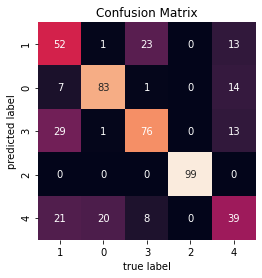

None


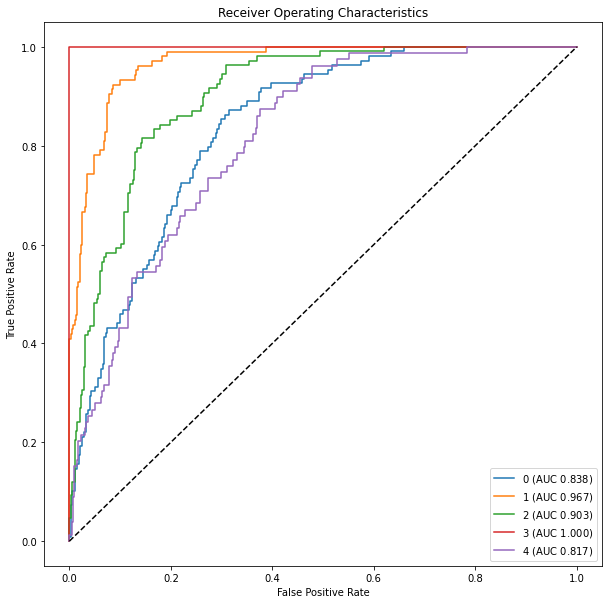

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

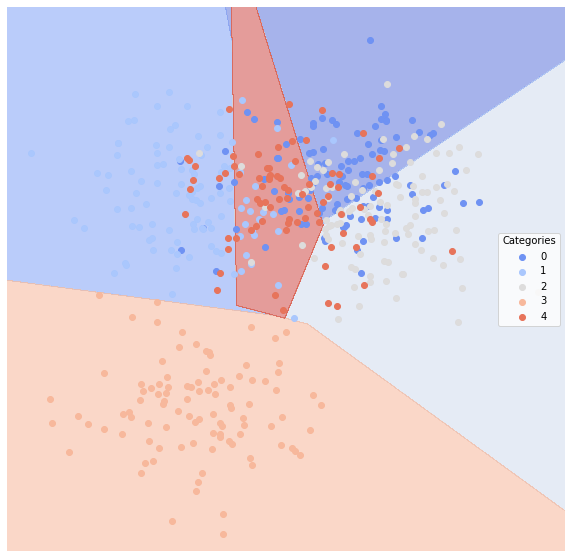

None
Time taken for method  linsvc  on dataset  10  is  95.21689414978027  seconds
.........................................
Dataset:  10
Method:  polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.198  0.625273   0.586207           0.332854  0.311927
1              0.096  0.827366   0.820225           0.634251  0.695238
2              0.162  0.739040   0.642105           0.456671  0.564815
3              0.020  0.983728   0.915888           0.908636  0.989899
4              0.260  0.696503   0.331126           0.267573  0.632911


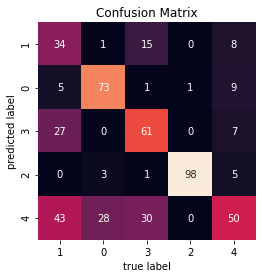

None


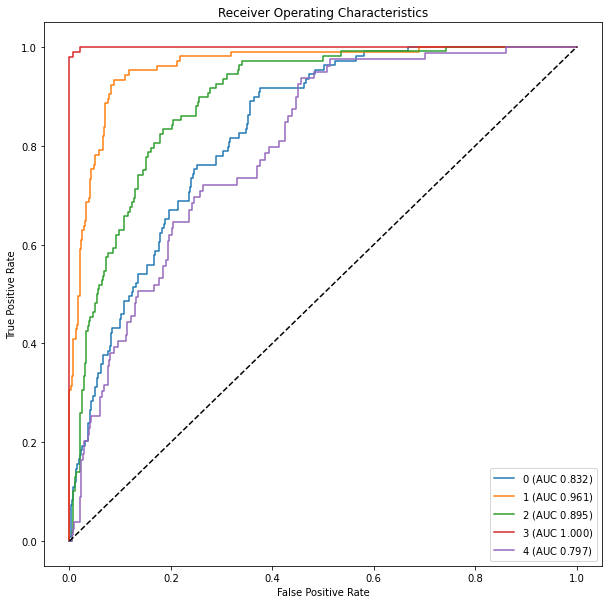

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

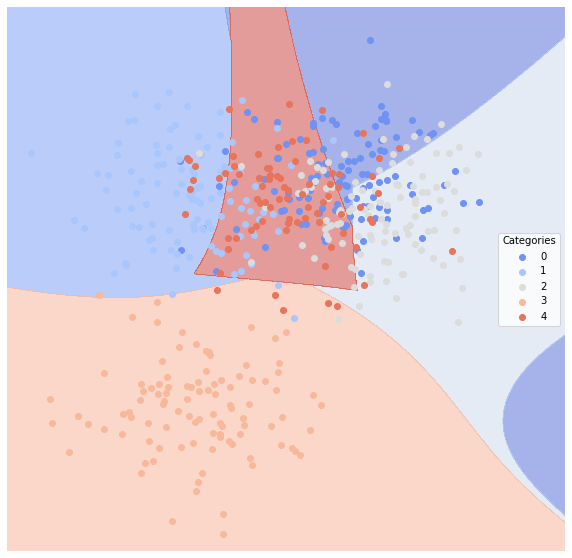

None
Time taken for method  polysvc  on dataset  10  is  115.77176284790039  seconds
.........................................
Dataset:  10
Method:  neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.210  0.677151   0.520000           0.362073  0.477064
1              0.100  0.859795   0.747748           0.635077  0.790476
2              0.162  0.769227   0.619469           0.477508  0.648148
3              0.006  0.988652   0.989796           0.973800  0.979798
4              0.206  0.610316   0.346154           0.222306  0.341772


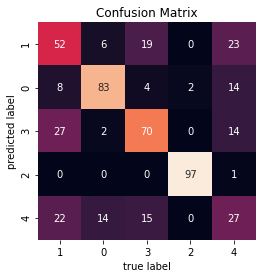

None


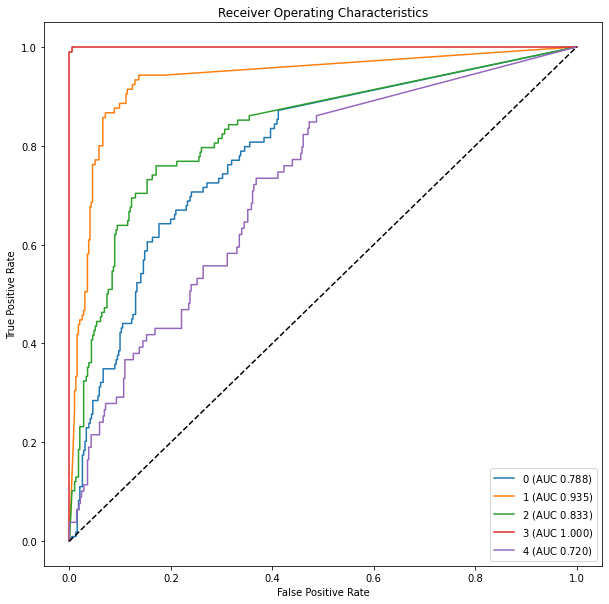

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

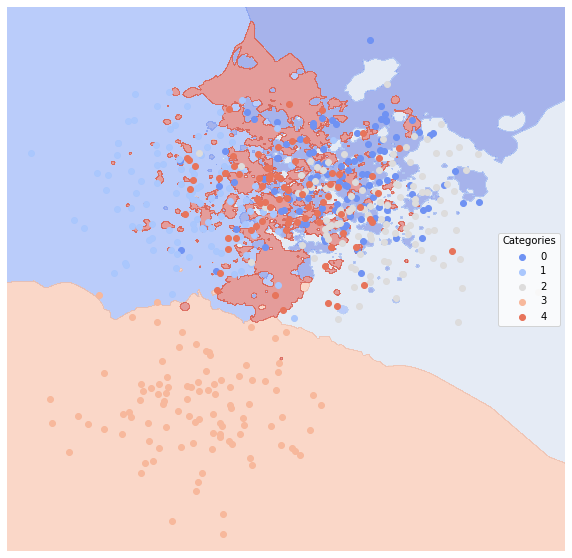

None
Time taken for method  neigh  on dataset  10  is  14.693710803985596  seconds
.........................................
Dataset:  10
Method:  logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.188  0.684601   0.588235           0.387833  0.458716
1              0.092  0.861362   0.780952           0.655887  0.780952
2              0.150  0.803713   0.634146           0.517995  0.722222
3              0.002  0.994949   1.000000           0.991899  0.989899
4              0.180  0.687453   0.438202           0.296328  0.493671


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


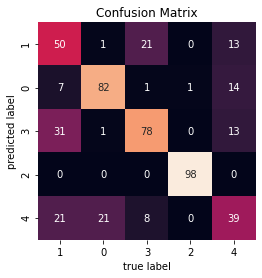

None


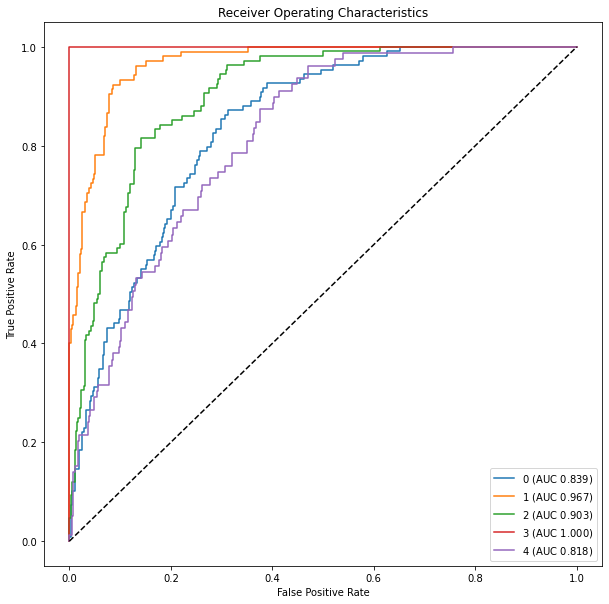

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

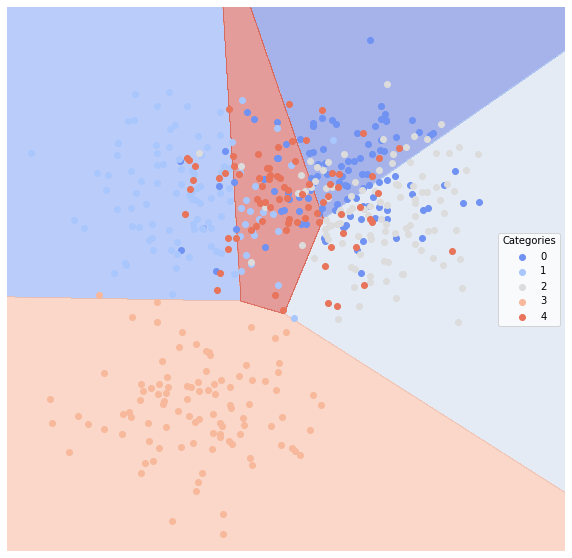

None
Time taken for method  logreg  on dataset  10  is  4.223589181900024  seconds
.........................................
Dataset:  10
Method:  dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.246  0.611124   0.423913           0.291675  0.357798
1              0.138  0.779807   0.683673           0.512249  0.638095
2              0.198  0.699310   0.543689           0.385913  0.518519
3              0.008  0.987405   0.979798           0.964004  0.979798
4              0.262  0.582203   0.259259           0.193889  0.354430


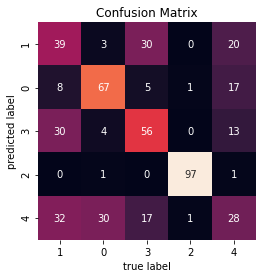

None


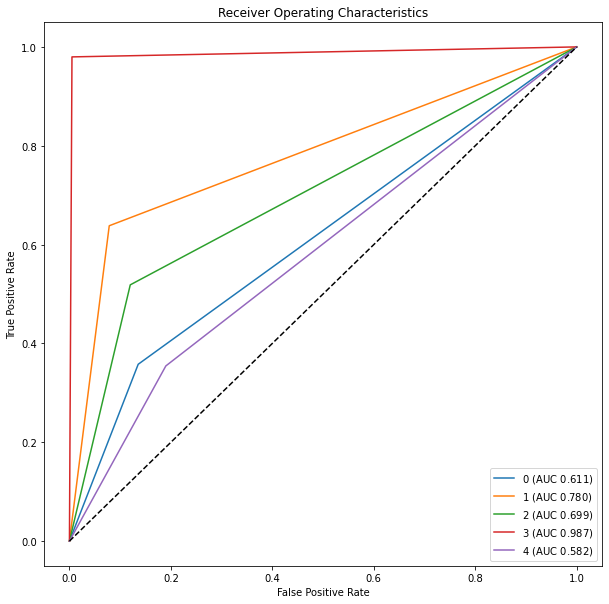

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

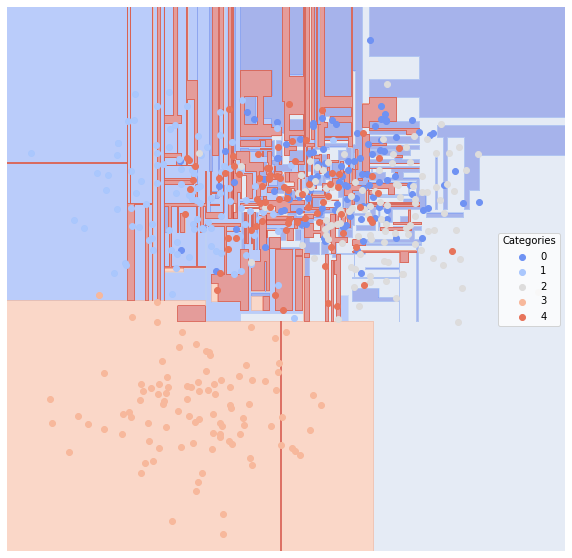

None
Time taken for method  dtree  on dataset  10  is  4.118782043457031  seconds
.........................................
Dataset:  10
Method:  rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.212  0.672564   0.515152           0.357034  0.467890
1              0.100  0.856299   0.752294           0.633505  0.780952
2              0.168  0.755338   0.609091           0.459862  0.620370
3              0.002  0.994949   1.000000           0.991899  0.989899
4              0.190  0.655807   0.404762           0.264201  0.430380


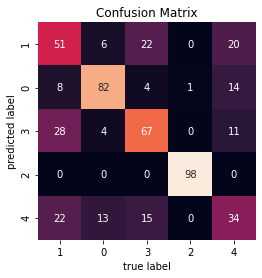

None


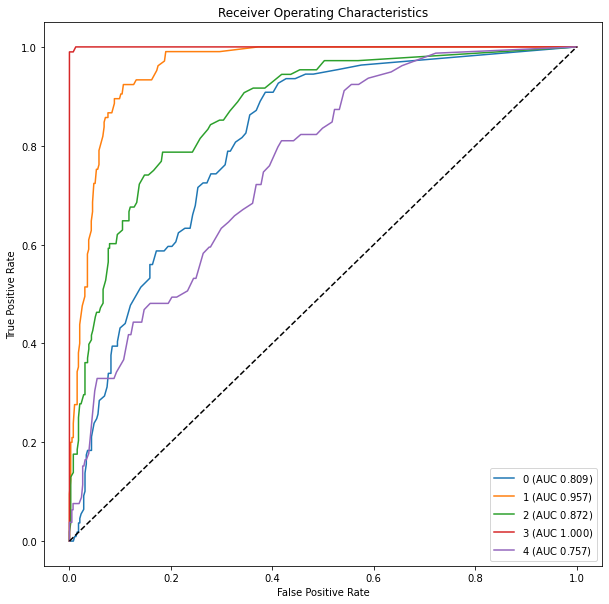

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

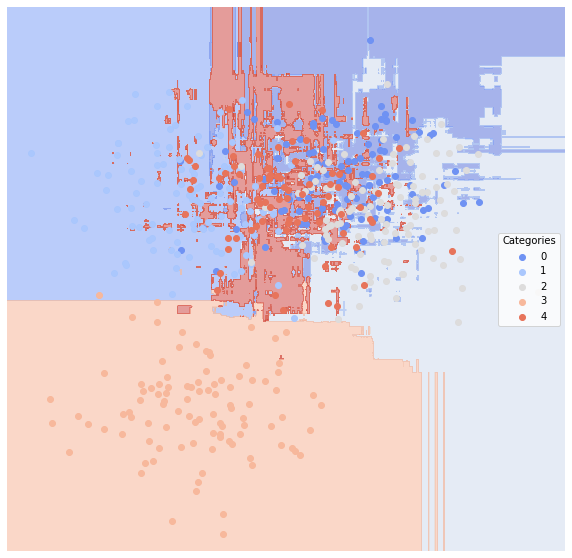

None
Time taken for method  rf  on dataset  10  is  47.589038133621216  seconds
.........................................
Dataset:  10
Method:  mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.196  0.676177   0.563218           0.373190  0.449541
1              0.092  0.868354   0.770642           0.658514  0.800000
2              0.162  0.769227   0.619469           0.477508  0.648148
3              0.000  1.000000   1.000000           1.000000  1.000000
4              0.190  0.676373   0.413043           0.280679  0.481013


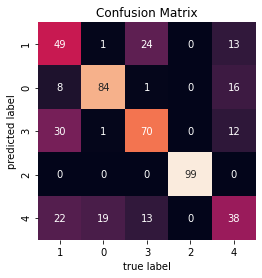

None


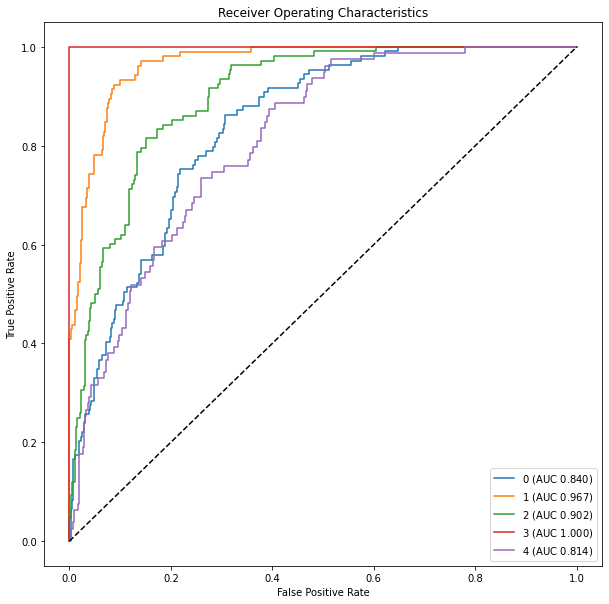

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

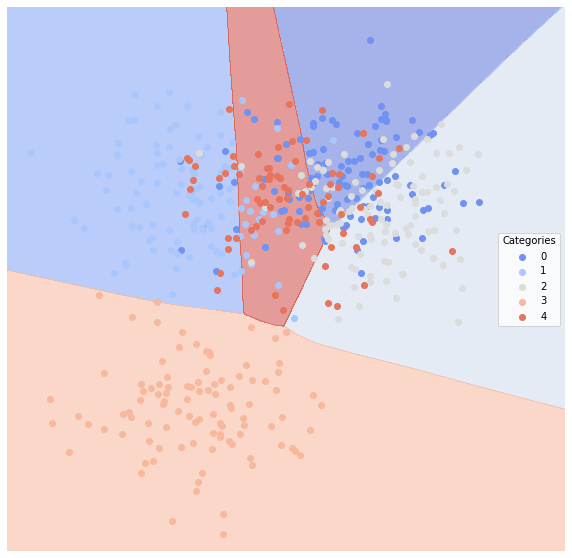

None
Time taken for method  mlp  on dataset  10  is  13.756897687911987  seconds
.........................................
Dataset:  10
Method:  gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.224  0.661583   0.485437           0.340677  0.458716
1              0.104  0.850271   0.743119           0.621263  0.771429
2              0.162  0.745748   0.636364           0.461212  0.583333
3              0.004  0.989899   1.000000           0.983798  0.979798
4              0.202  0.653823   0.380435           0.256547  0.443038


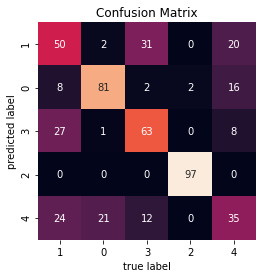

None


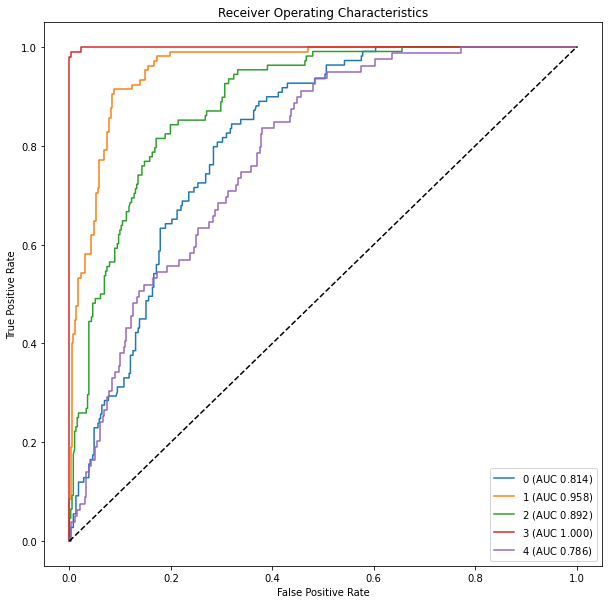

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

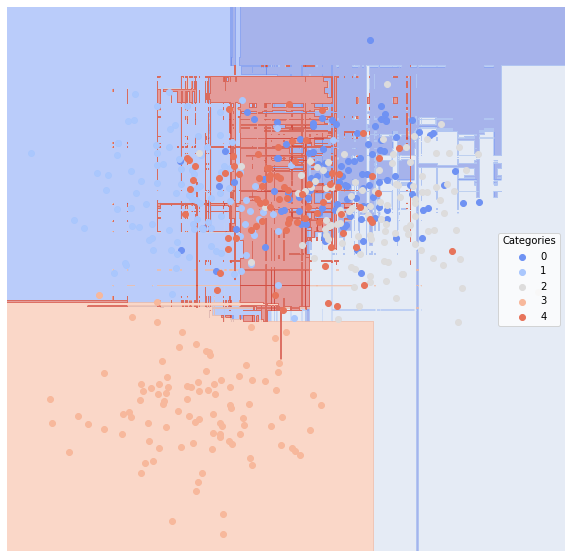

None
Time taken for method  gbc  on dataset  10  is  33.876195192337036  seconds
.........................................


In [0]:
noise_low = 0.1
noise_high = 0.9
import time

dfTrain1, dfTest1 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.random(100))
dfTrain2, dfTest2 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.random(1000))

dfTrain3, dfTest3 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.andSplit(noise_low))
dfTrain4, dfTest4 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.andSplit(noise_high))

dfTrain5, dfTest5 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.xorSplit(noise_low)) 
dfTrain6, dfTest6 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.xorSplit(noise_high))


dfTrain7, dfTest7 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.targetSplit(noise_low))
dfTrain8, dfTest8 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.targetSplit(noise_high))


dfTrain9, dfTest9 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.multiBlobs(noise_low))
dfTrain10, dfTest10 = lucem_illud_2020.trainTestSplit(lucem_illud_2020.multiBlobs(noise_high))

methodsString = ['nb', 'linsvc', 'polysvc', 'neigh', 'logreg', 'dtree',\
           'rf', 'mlp', 'gbc']
#dfTrain, dfTest = lucem_illud_2020.trainTestSplit(lucem_illud_2020.loadSenateLarge())


trainl = [dfTrain1, dfTrain2, dfTrain3, dfTrain4, dfTrain5, dfTrain6, \
          dfTrain7, dfTrain8, dfTrain9, dfTrain10]
testl = [dfTest1, dfTest2, dfTest3, dfTest4, dfTest5, dfTest6, dfTest7, \
         dfTest8, dfTest9, dfTest10]
methods = [clf_nb, clf_linsvc, clf_polysvc, clf_neigh, clf_logreg, clf_dtree,\
           clf_rf, clf_mlp, clf_gbc]
for i in range(len(trainl)):
    for j in range(len(methods)):
        clf = methods[j]
        print ("Dataset: ", i+1)
        print ("Method: ", methodsString[j])
        dfTrain = trainl[i]
        dfTest = testl[i]
        t0=time.time()
        clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
        print (lucem_illud_2020.evaluateClassifier(clf, dfTest))
        print (lucem_illud_2020.plotConfusionMatrix(clf, dfTest))
        print (lucem_illud_2020.plotMultiROC(clf, dfTest))
        print (lucem_illud_2020.plotregions(clf, dfTest))
        t1=time.time()
        print ('Time taken for method ',methodsString[j] , ' on dataset ',i+1,' is ',t1-t0, ' seconds')
        print (".........................................")




          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
0              0.246  0.477215   0.000000           0.210000  0.000000
1              0.362  0.397696   0.021053           0.176468  0.022222
2              0.320  0.803922   0.365079           0.365079  1.000000
3              0.450  0.361842   0.000000           0.240000  0.000000
4              0.246  0.463145   0.000000           0.186000  0.000000


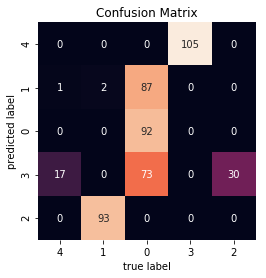

None


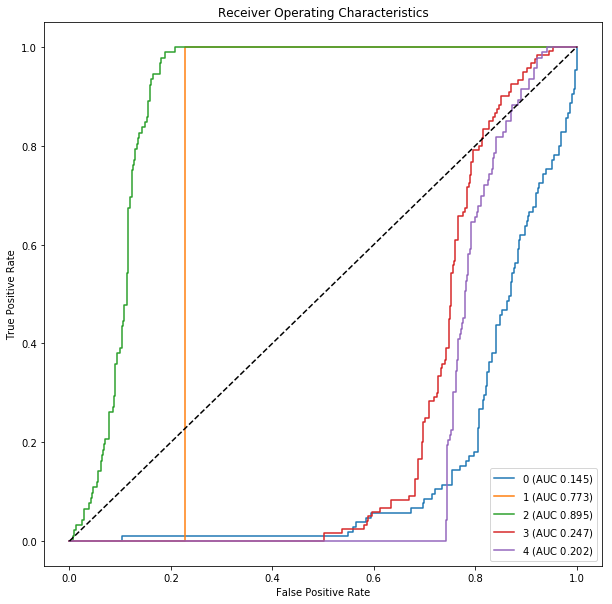

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

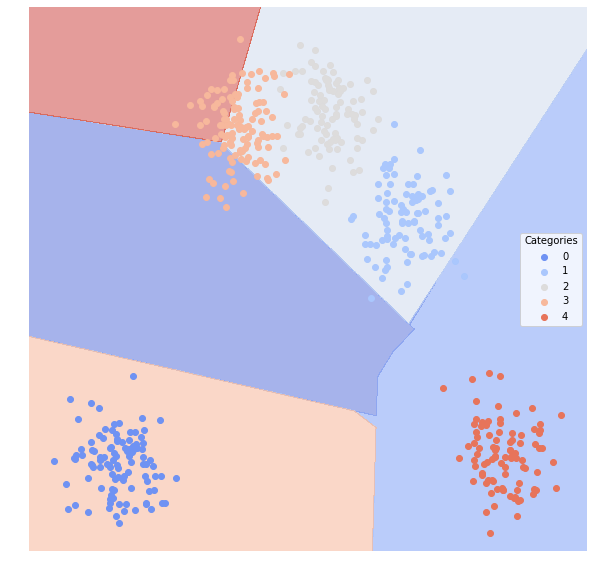

None


In [0]:
dfTrain = dfTrain9
dfTest = dfTest9
clf_sgd.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
print (lucem_illud_2020.evaluateClassifier(clf, dfTest))
print (lucem_illud_2020.plotConfusionMatrix(clf, dfTest))
print (lucem_illud_2020.plotMultiROC(clf, dfTest))
print (lucem_illud_2020.plotregions(clf, dfTest))

I tried above an additional classifying method called Stochastic Gradient Descent above but didn't perform too well. Perhaps more data is needed for the classifier to converge on a good classification plane.

Dataset Reddit
Method nb
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.235110  0.823359  ...           0.478536  0.932432
Tales From Tech Support    0.075235  0.869330  ...           0.760632  0.759494
Relationships              0.191223  0.667927  ...           0.445716  0.378049
Bad Roommates              0.150470  0.786955  ...           0.577556  0.654762

[4 rows x 5 columns]


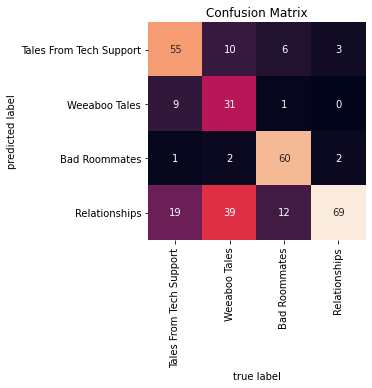

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

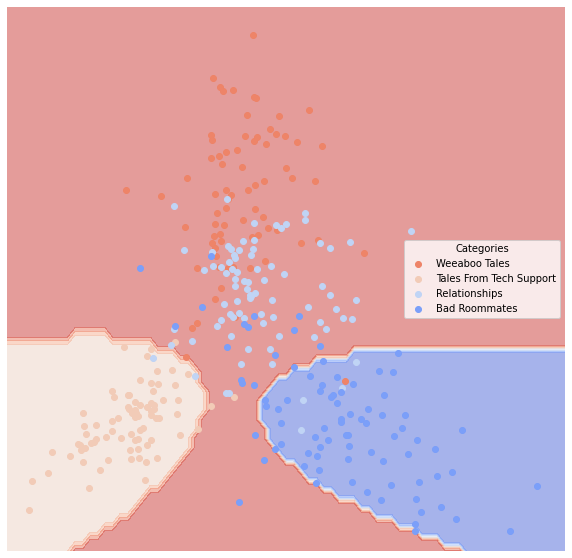

None
Time taken for method  nb  on dataset  Reddit  is  2.006355047225952  seconds
.........................................
Dataset Reddit
Method linsvc
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.012539  0.972973  ...           0.958485  0.945946
Tales From Tech Support    0.012539  0.991667  ...           0.951807  1.000000
Relationships              0.025078  0.967171  ...           0.917358  0.951220
Bad Roommates              0.018809  0.975760  ...           0.939251  0.964286

[4 rows x 5 columns]


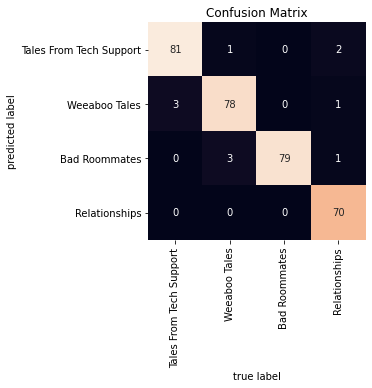

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

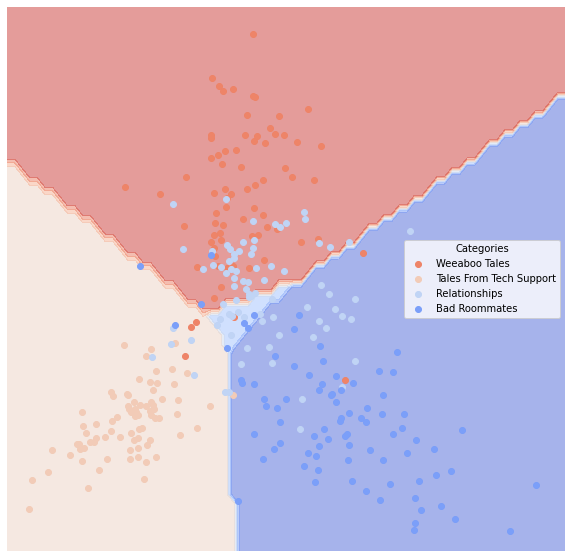

None
Time taken for method  linsvc  on dataset  Reddit  is  146.90111470222473  seconds
.........................................
Dataset Reddit
Method polysvc
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.037618  0.928351  ...           0.870005  0.864865
Tales From Tech Support    0.075235  0.945754  ...           0.765636  0.987342
Relationships              0.050157  0.930354  ...           0.840561  0.890244
Bad Roommates              0.068966  0.888171  ...           0.795520  0.797619

[4 rows x 5 columns]


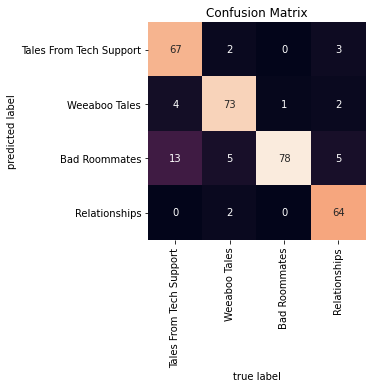

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

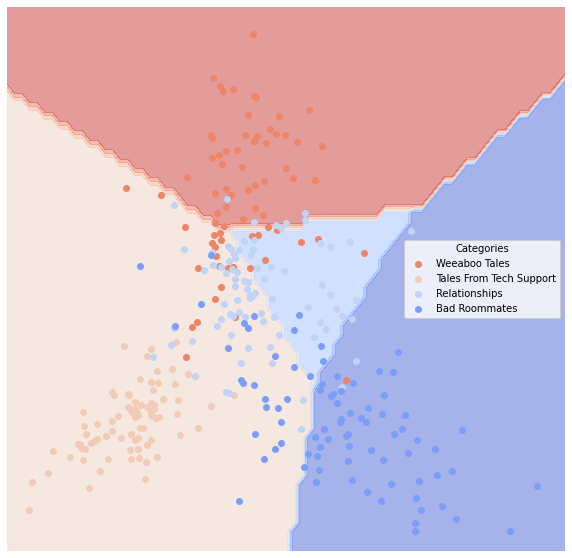

None
Time taken for method  polysvc  on dataset  Reddit  is  237.25086975097656  seconds
.........................................
Dataset Reddit
Method neigh
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.059561  0.904633  ...           0.790457  0.837838
Tales From Tech Support    0.034483  0.955854  ...           0.882130  0.936709
Relationships              0.094044  0.852964  ...           0.714089  0.743902
Bad Roommates              0.100313  0.901317  ...           0.712697  0.904762

[4 rows x 5 columns]


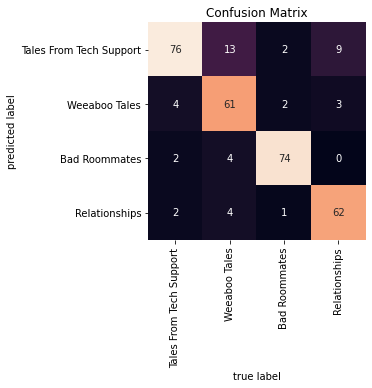

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

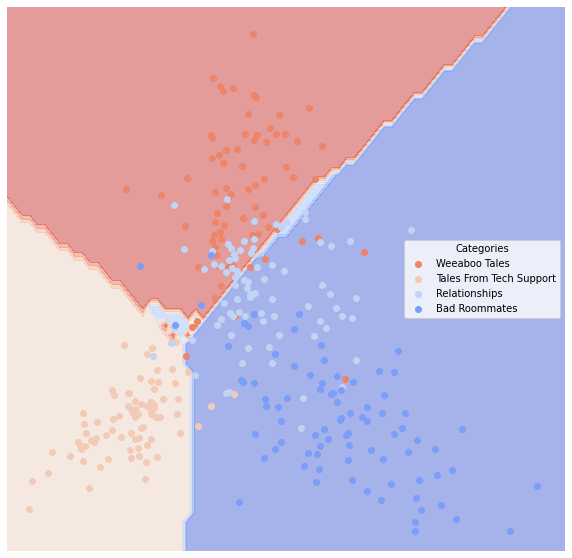

None
Time taken for method  neigh  on dataset  Reddit  is  129.28021812438965  seconds
.........................................
Dataset Reddit
Method logreg
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.012539  0.972973  ...           0.958485  0.945946
Tales From Tech Support    0.015674  0.985338  ...           0.942314  0.987342
Relationships              0.043887  0.942549  ...           0.858499  0.914634
Bad Roommates              0.028213  0.965552  ...           0.908898  0.952381

[4 rows x 5 columns]


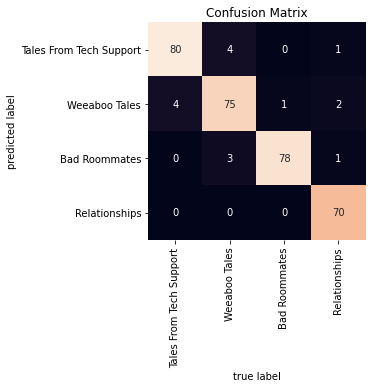

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

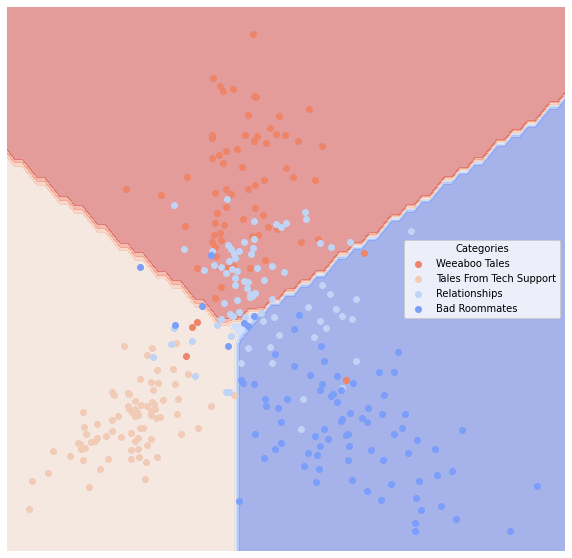

None
Time taken for method  logreg  on dataset  Reddit  is  3.1450674533843994  seconds
.........................................
Dataset Reddit
Method dtree
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.059561  0.909349  ...           0.789907  0.851351
Tales From Tech Support    0.090909  0.888634  ...           0.714079  0.848101
Relationships              0.081505  0.885330  ...           0.748867  0.817073
Bad Roommates              0.081505  0.898784  ...           0.755226  0.857143

[4 rows x 5 columns]


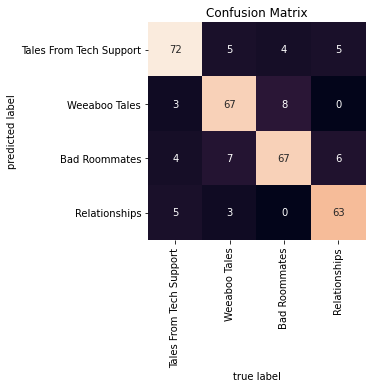

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

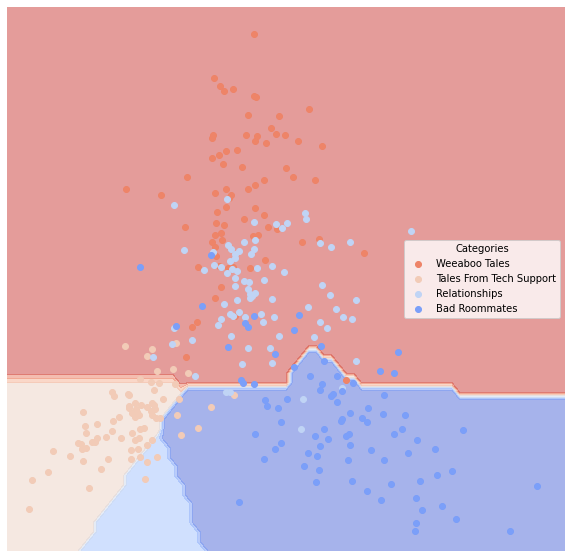

None
Time taken for method  dtree  on dataset  Reddit  is  1.85943603515625  seconds
.........................................
Dataset Reddit
Method rf
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.015674  0.966216  ...           0.948106  0.932432
Tales From Tech Support    0.009404  0.993750  ...           0.963415  1.000000
Relationships              0.037618  0.942781  ...           0.881238  0.902439
Bad Roommates              0.025078  0.979154  ...           0.914378  0.988095

[4 rows x 5 columns]


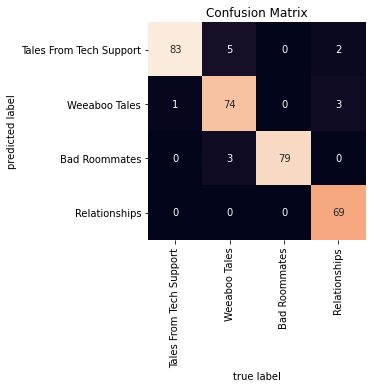

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

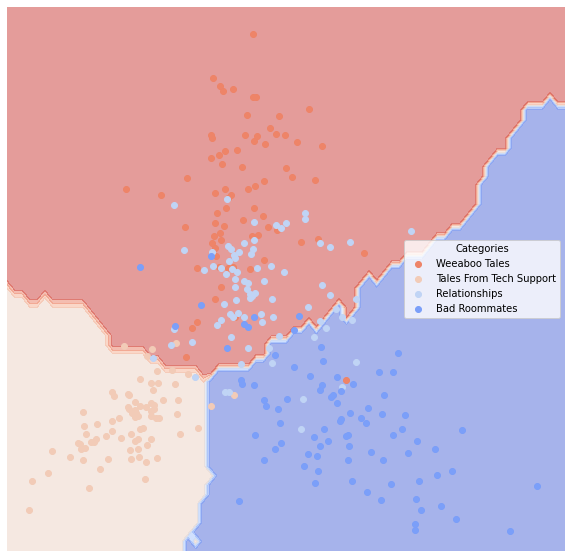

None
Time taken for method  rf  on dataset  Reddit  is  3.042468786239624  seconds
.........................................
Dataset Reddit
Method mlp
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.012539  0.972973  ...           0.958485  0.945946
Tales From Tech Support    0.012539  0.991667  ...           0.951807  1.000000
Relationships              0.025078  0.967171  ...           0.917358  0.951220
Bad Roommates              0.012539  0.983840  ...           0.959217  0.976190

[4 rows x 5 columns]


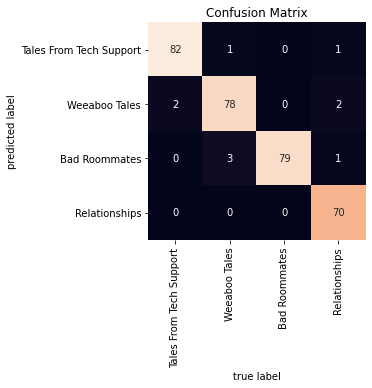

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

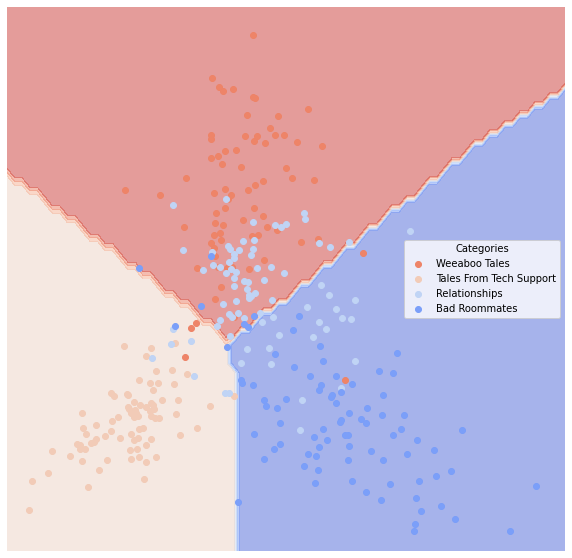

None
Time taken for method  mlp  on dataset  Reddit  is  28.727909803390503  seconds
.........................................
Dataset Reddit
Method gbc
                         Error_Rate       AUC  ...  Average_Precision    Recall
Category                                       ...                             
Weeaboo Tales              0.021944  0.952703  ...           0.927349  0.905405
Tales From Tech Support    0.047022  0.964504  ...           0.840229  0.987342
Relationships              0.015674  0.973500  ...           0.951718  0.951220
Bad Roommates              0.028213  0.957903  ...           0.912989  0.928571

[4 rows x 5 columns]


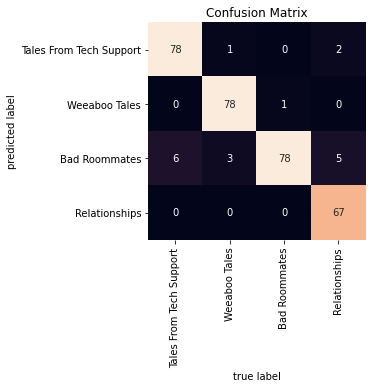

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

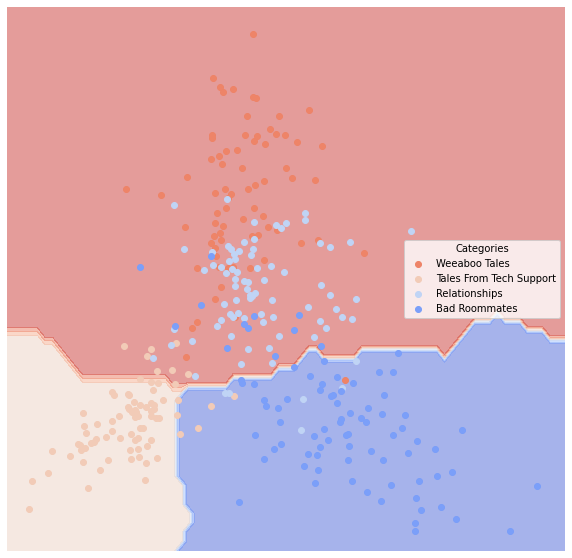

None
Time taken for method  gbc  on dataset  Reddit  is  200.20033192634583  seconds
.........................................
Dataset News
Method nb
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.100000  0.868116  ...           0.708929  0.800000
misc.forsale             0.125532  0.817568  ...           0.604526  0.707965
comp.windows.x           0.082979  0.896541  ...           0.759963  0.851562
comp.sys.mac.hardware    0.138298  0.814838  ...           0.551065  0.730769

[4 rows x 5 columns]


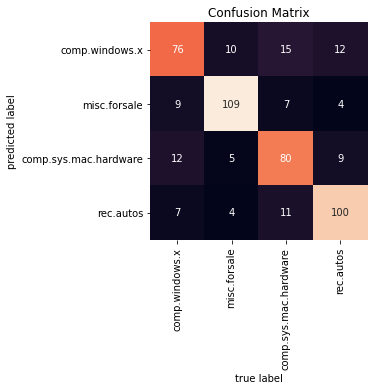

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

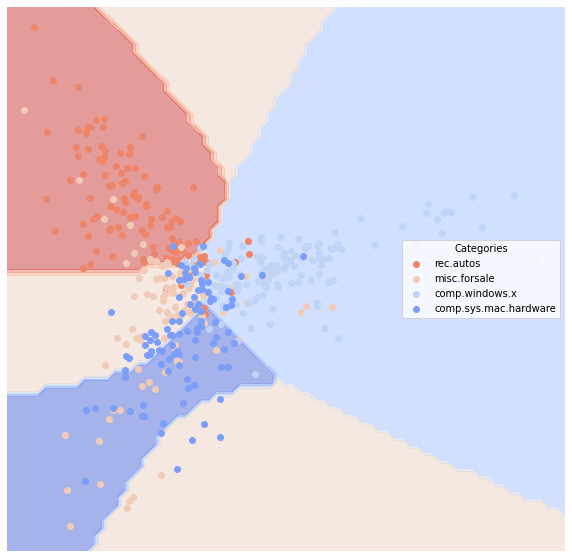

None
Time taken for method  nb  on dataset  News  is  1.6988401412963867  seconds
.........................................
Dataset News
Method linsvc
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.057447  0.943014  ...           0.822082  0.944000
misc.forsale             0.055319  0.921246  ...           0.811179  0.876106
comp.windows.x           0.044681  0.932634  ...           0.870216  0.882812
comp.sys.mac.hardware    0.063830  0.903951  ...           0.764058  0.846154

[4 rows x 5 columns]


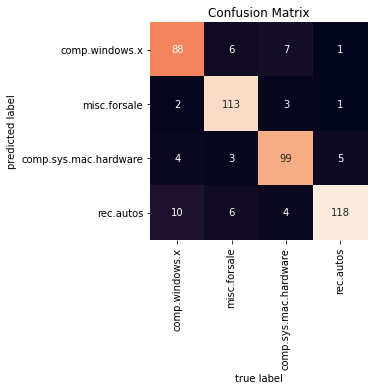

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

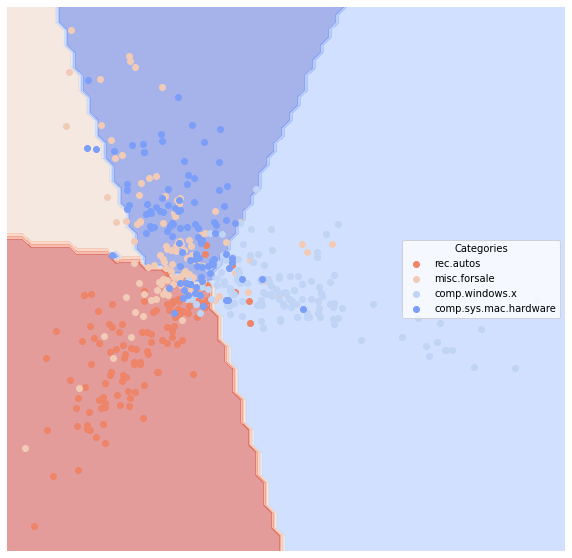

None
Time taken for method  linsvc  on dataset  News  is  240.33887338638306  seconds
.........................................
Dataset News
Method polysvc
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.153191  0.885449  ...           0.628236  0.968000
misc.forsale             0.080851  0.859076  ...           0.733127  0.743363
comp.windows.x           0.087234  0.844732  ...           0.763010  0.695312
comp.sys.mac.hardware    0.078723  0.873739  ...           0.713343  0.788462

[4 rows x 5 columns]


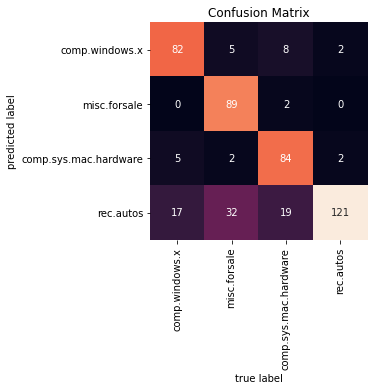

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

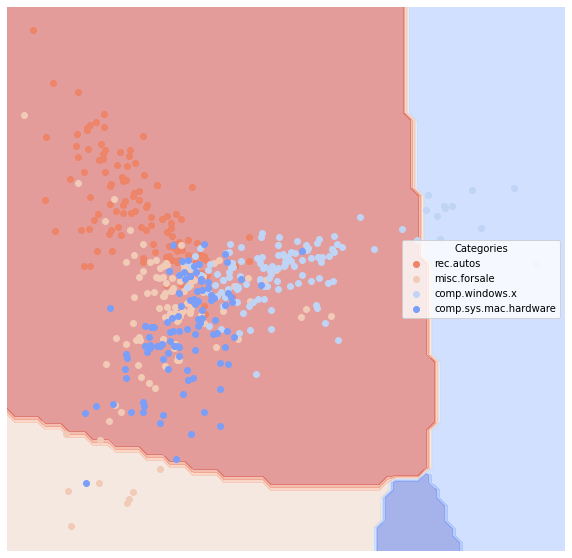

None
Time taken for method  polysvc  on dataset  News  is  348.27262234687805  seconds
.........................................
Dataset News
Method neigh
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.446809  0.563014  ...           0.295192  0.584000
misc.forsale             0.221277  0.542847  ...           0.299599  0.088496
comp.windows.x           0.240426  0.558594  ...           0.357613  0.117188
comp.sys.mac.hardware    0.436170  0.554750  ...           0.243695  0.538462

[4 rows x 5 columns]


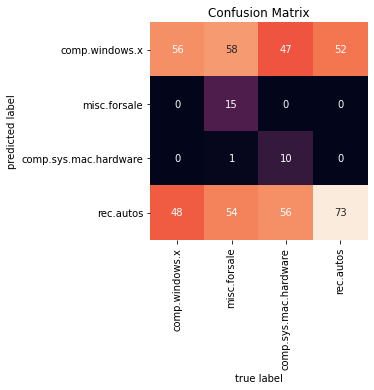

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

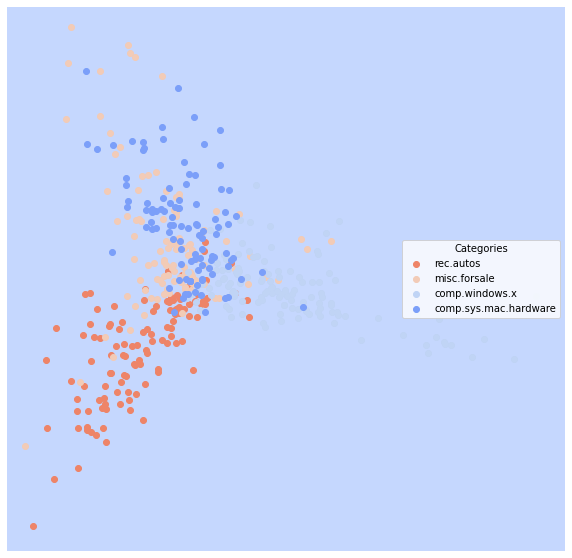

None
Time taken for method  neigh  on dataset  News  is  146.83785104751587  seconds
.........................................
Dataset News
Method logreg
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.059574  0.941565  ...           0.816275  0.944000
misc.forsale             0.061702  0.917045  ...           0.790616  0.876106
comp.windows.x           0.046809  0.933617  ...           0.862011  0.890625
comp.sys.mac.hardware    0.074468  0.876471  ...           0.727375  0.788462

[4 rows x 5 columns]


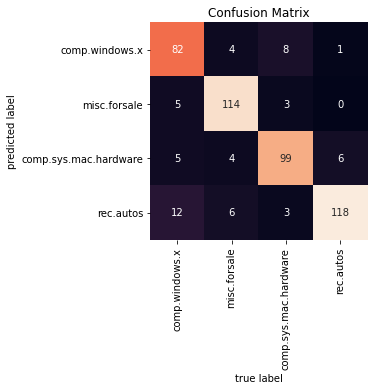

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

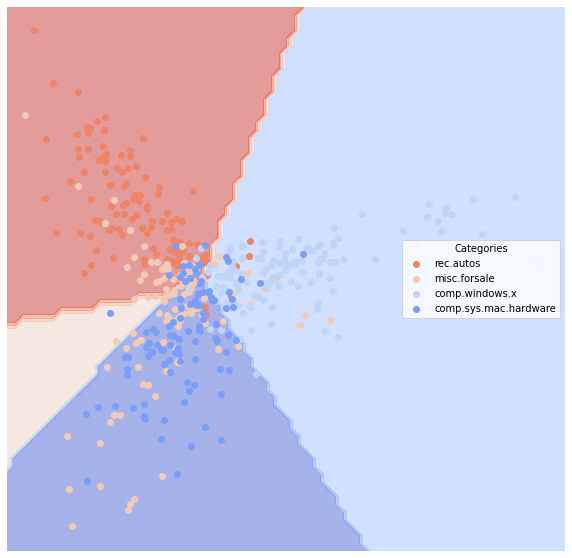

None
Time taken for method  logreg  on dataset  News  is  3.6251566410064697  seconds
.........................................
Dataset News
Method dtree
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.176596  0.810841  ...           0.556356  0.784000
misc.forsale             0.163830  0.771188  ...           0.513827  0.646018
comp.windows.x           0.108511  0.842334  ...           0.694244  0.734375
comp.sys.mac.hardware    0.134043  0.790038  ...           0.544612  0.653846

[4 rows x 5 columns]


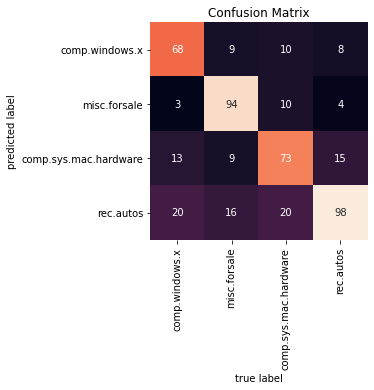

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

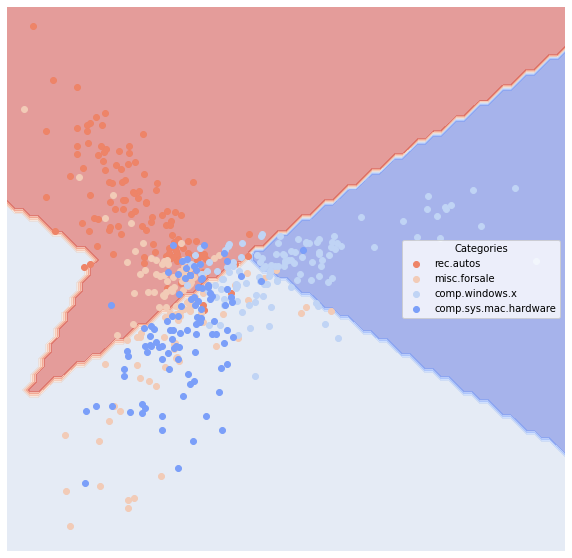

None
Time taken for method  dtree  on dataset  News  is  2.63942289352417  seconds
.........................................
Dataset News
Method rf
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.093617  0.908174  ...           0.730670  0.912000
misc.forsale             0.082979  0.872797  ...           0.725077  0.787611
comp.windows.x           0.072340  0.908740  ...           0.788184  0.867188
comp.sys.mac.hardware    0.078723  0.863414  ...           0.712638  0.759615

[4 rows x 5 columns]


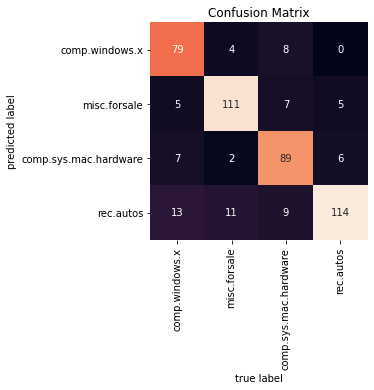

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

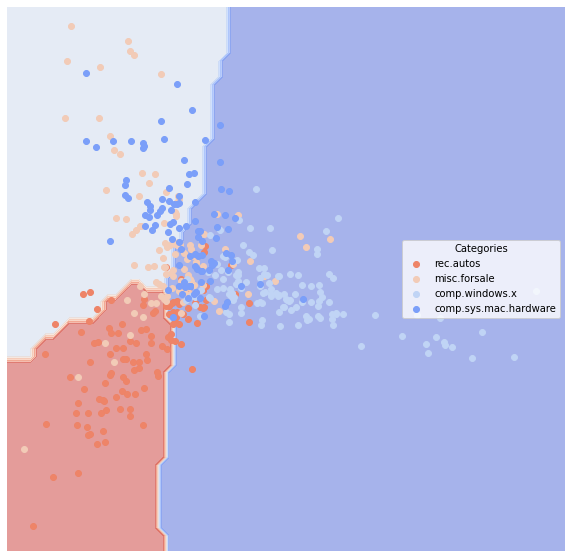

None
Time taken for method  rf  on dataset  News  is  4.9352617263793945  seconds
.........................................
Dataset News
Method mlp
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.057447  0.937913  ...           0.822492  0.928000
misc.forsale             0.059574  0.918445  ...           0.797349  0.876106
comp.windows.x           0.027660  0.958996  ...           0.918603  0.929688
comp.sys.mac.hardware    0.063830  0.900510  ...           0.763959  0.836538

[4 rows x 5 columns]


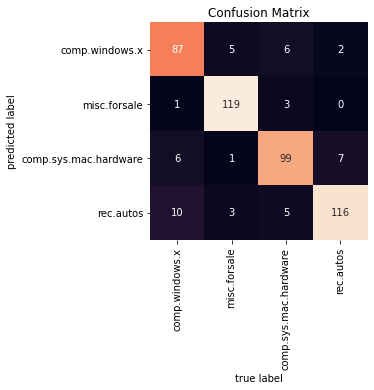

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

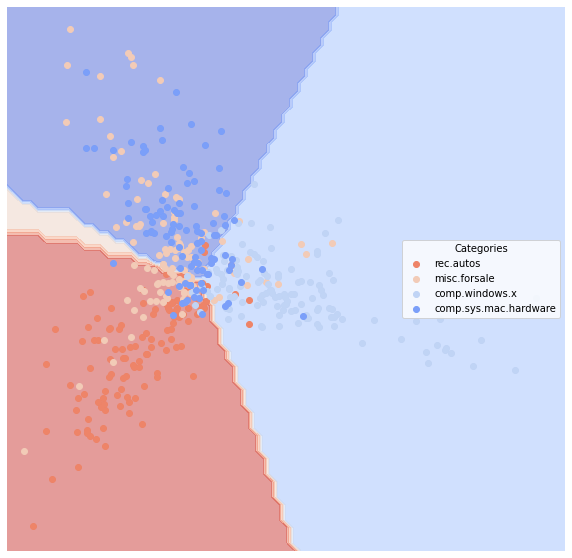

None
Time taken for method  mlp  on dataset  News  is  48.21426010131836  seconds
.........................................
Dataset News
Method gbc
                       Error_Rate       AUC  ...  Average_Precision    Recall
Category                                     ...                             
rec.autos                0.131915  0.864232  ...           0.644867  0.856000
misc.forsale             0.102128  0.842047  ...           0.667440  0.734513
comp.windows.x           0.085106  0.885302  ...           0.754943  0.820312
comp.sys.mac.hardware    0.102128  0.838062  ...           0.638100  0.730769

[4 rows x 5 columns]


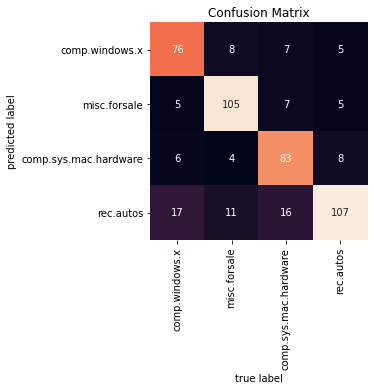

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

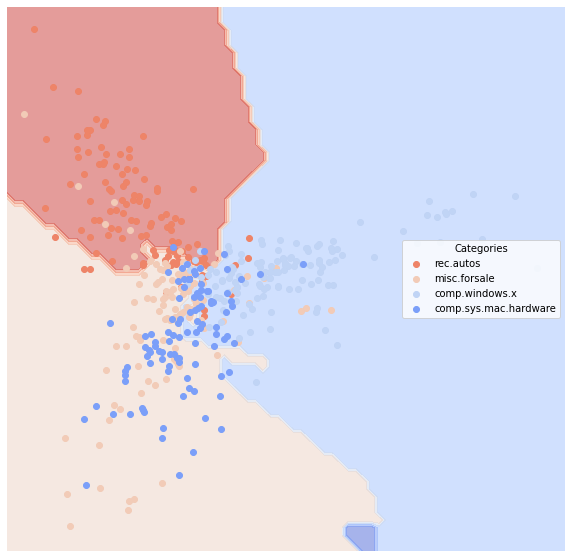

None
Time taken for method  gbc  on dataset  News  is  209.16862297058105  seconds
.........................................
Dataset Sen
Method nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.178886  0.812629   0.844660           0.809038  0.857143
Obama       0.178886  0.812629   0.785185           0.696955  0.768116


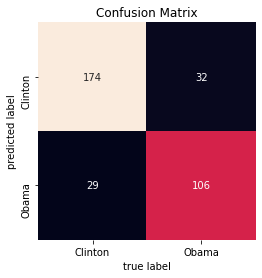

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


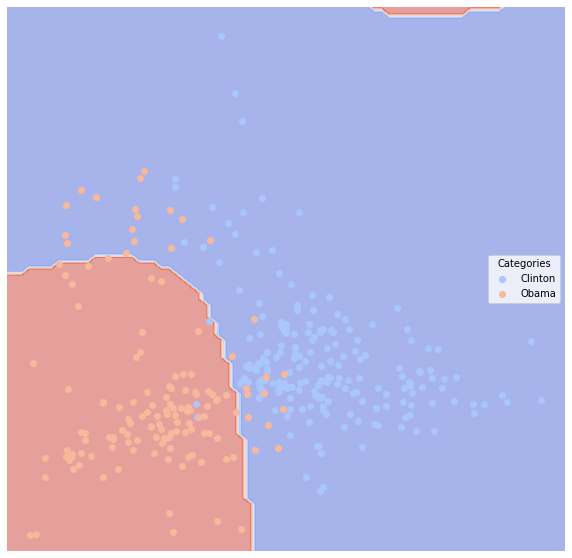

None
Time taken for method  nb  on dataset  Sen  is  1.682426929473877  seconds
.........................................
Dataset Sen
Method linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.005865  0.992754   0.990244           0.990244  1.000000
Obama       0.005865  0.992754   1.000000           0.991372  0.985507


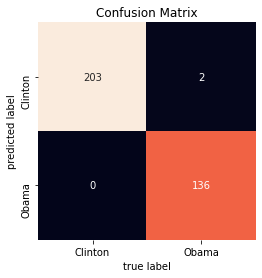

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


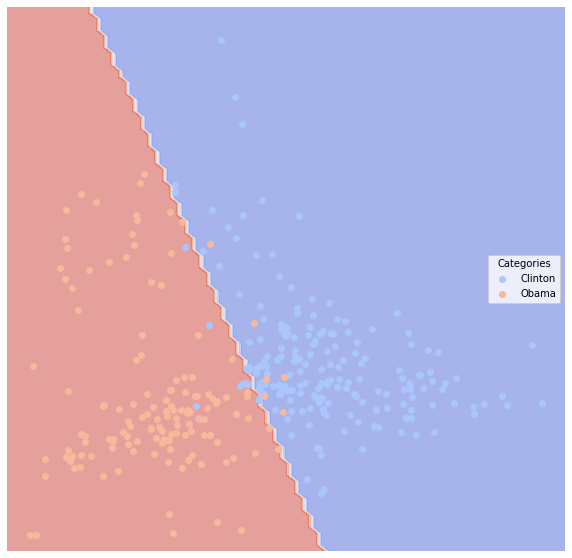

None
Time taken for method  linsvc  on dataset  Sen  is  102.26187586784363  seconds
.........................................
Dataset Sen
Method polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton       0.1261  0.847683   0.833333           0.829816  0.985222
Obama         0.1261  0.847683   0.970297           0.806354  0.710145


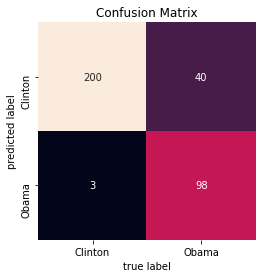

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


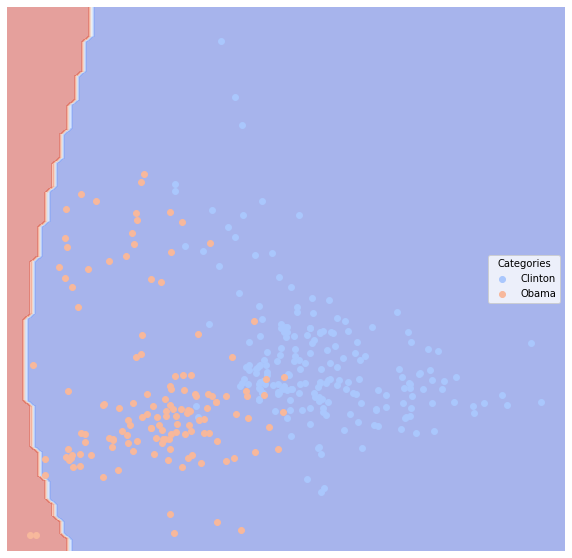

None
Time taken for method  polysvc  on dataset  Sen  is  232.71981263160706  seconds
.........................................
Dataset Sen
Method neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.111437  0.885522   0.910448           0.879400  0.901478
Obama       0.111437  0.885522   0.857143           0.798128  0.869565


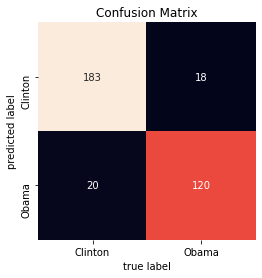

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


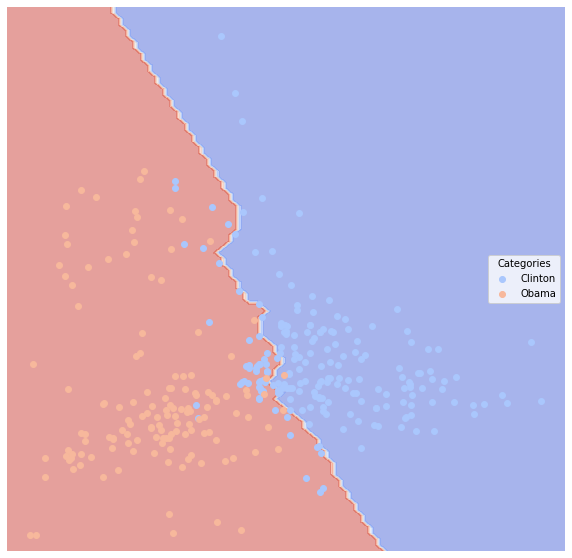

None
Time taken for method  neigh  on dataset  Sen  is  193.26417875289917  seconds
.........................................
Dataset Sen
Method logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.020528  0.974638   0.966667           0.966667  1.000000
Obama       0.020528  0.974638   1.000000           0.969803  0.949275


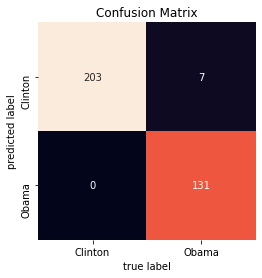

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


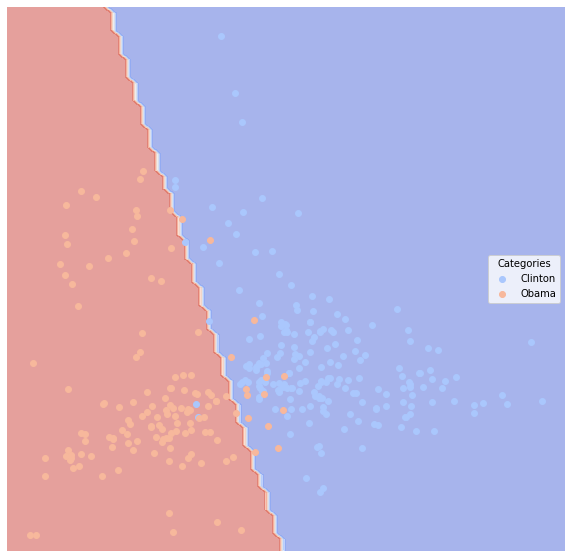

None
Time taken for method  logreg  on dataset  Sen  is  1.4481863975524902  seconds
.........................................
Dataset Sen
Method dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.002933  0.996377   0.995098           0.995098  1.000000
Obama       0.002933  0.996377   1.000000           0.995686  0.992754


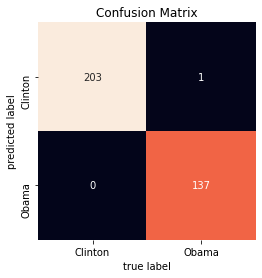

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


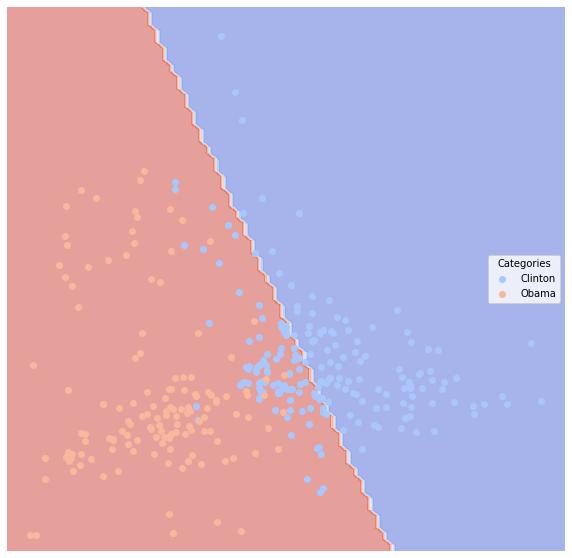

None
Time taken for method  dtree  on dataset  Sen  is  1.3484399318695068  seconds
.........................................
Dataset Sen
Method rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.002933  0.996377   0.995098           0.995098  1.000000
Obama       0.002933  0.996377   1.000000           0.995686  0.992754


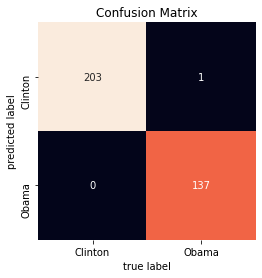

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


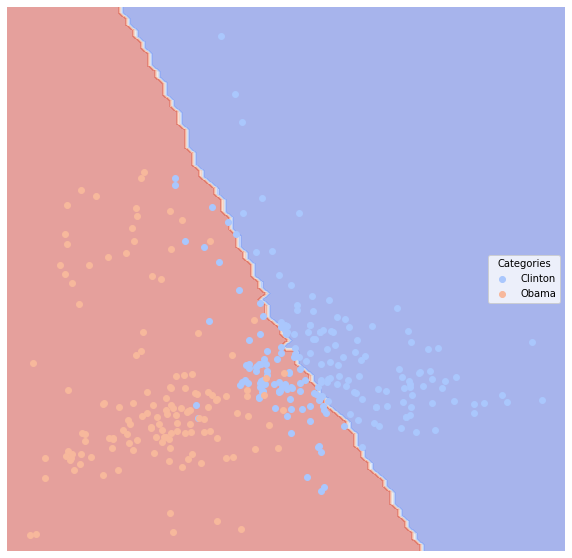

None
Time taken for method  rf  on dataset  Sen  is  2.4965224266052246  seconds
.........................................
Dataset Sen
Method mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
Clinton     0.049853  0.951167   0.969697           0.949410  0.945813
Obama       0.049853  0.951167   0.923077           0.900538  0.956522


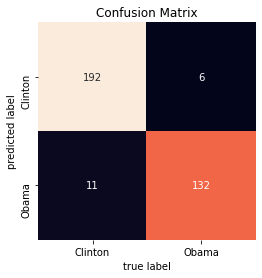

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


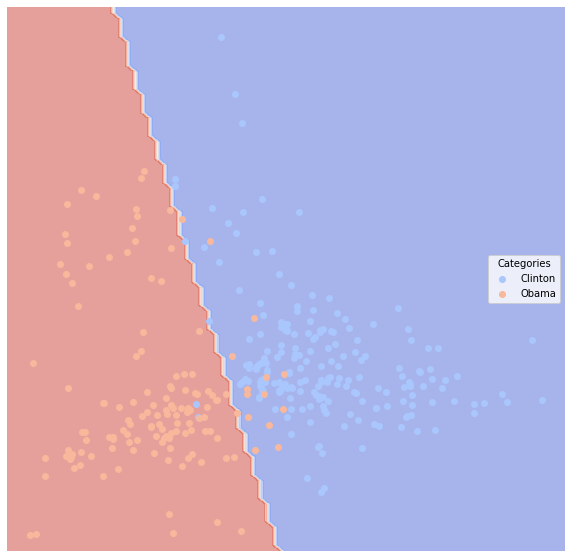

None
Time taken for method  mlp  on dataset  Sen  is  28.759706020355225  seconds
.........................................
Dataset Sen
Method gbc
          Error_Rate  AUC  Precision  Average_Precision  Recall
Category                                                       
Clinton          0.0  1.0        1.0                1.0     1.0
Obama            0.0  1.0        1.0                1.0     1.0


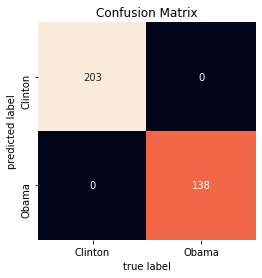

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


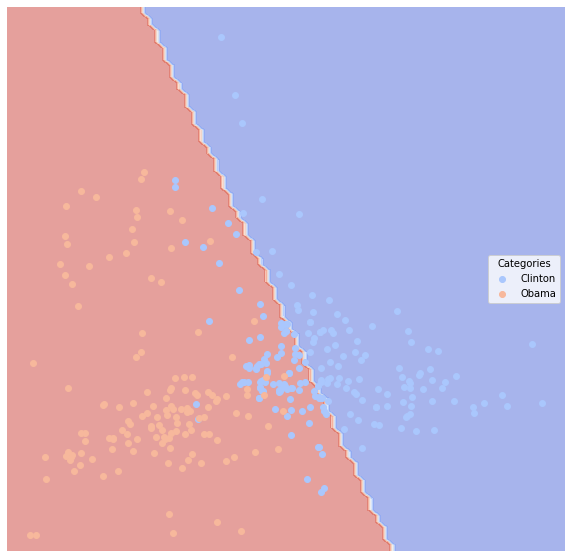

None
Time taken for method  gbc  on dataset  Sen  is  35.74770712852478  seconds
.........................................
Dataset Spam
Method nb
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.165205  0.794962   0.446541           0.366804  0.739583
not spam    0.165205  0.794962   0.952381           0.938503  0.850340


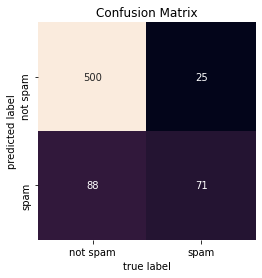

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


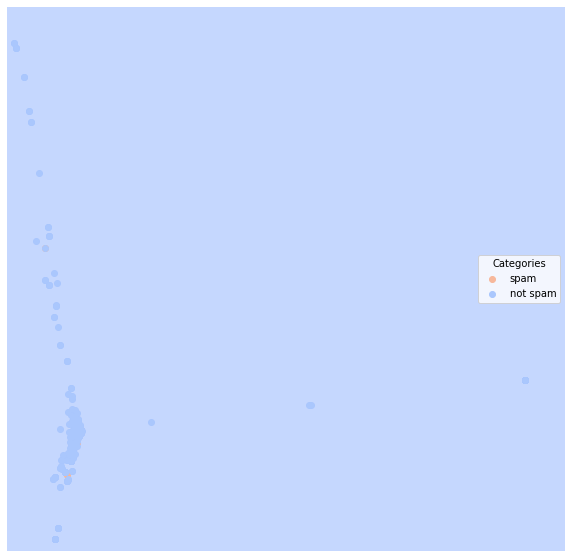

None
Time taken for method  nb  on dataset  Spam  is  0.6622884273529053  seconds
.........................................
Dataset Spam
Method linsvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.080409  0.752764   0.847458           0.508636  0.520833
not spam    0.080409  0.752764   0.926400           0.925378  0.984694


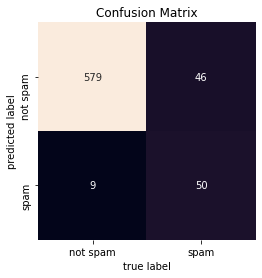

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


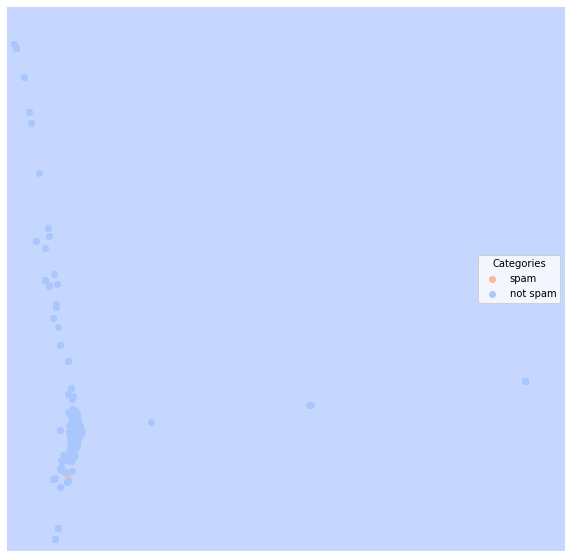

None
Time taken for method  linsvc  on dataset  Spam  is  47.34705471992493  seconds
.........................................
Dataset Spam
Method polysvc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.081871  0.730123   0.900000           0.496436  0.468750
not spam    0.081871  0.730123   0.919558           0.919049  0.991497


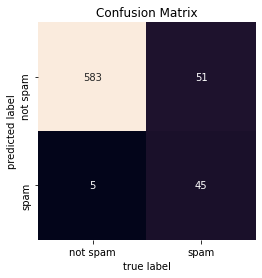

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


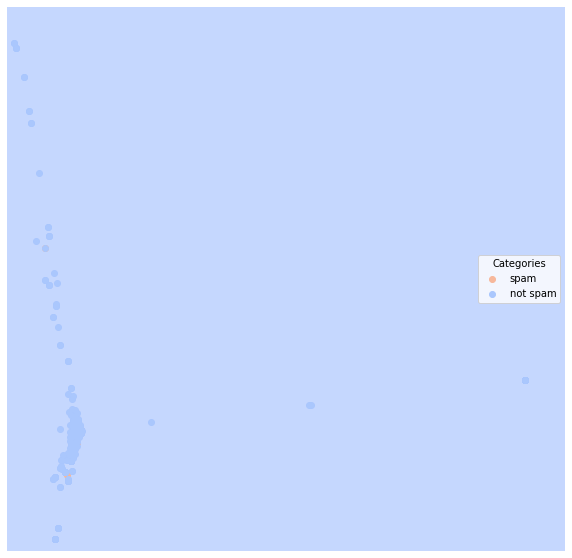

None
Time taken for method  polysvc  on dataset  Spam  is  84.03894758224487  seconds
.........................................
Dataset Spam
Method neigh
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.097953  0.703338   0.773585           0.410795  0.427083
not spam    0.097953  0.703338   0.912837           0.911751  0.979592


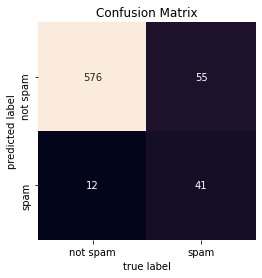

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


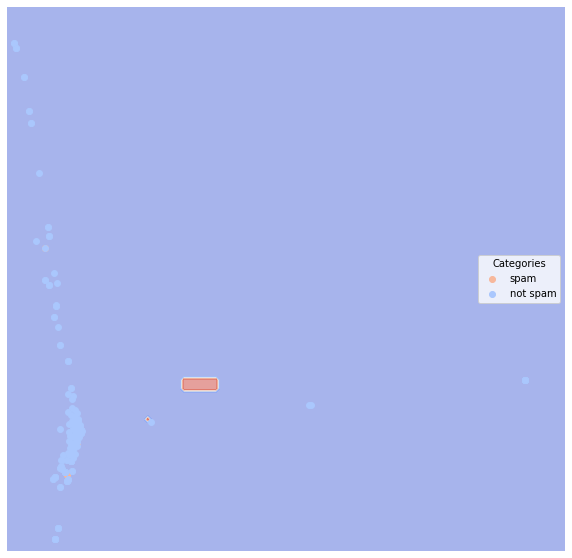

None
Time taken for method  neigh  on dataset  Spam  is  100.6516182422638  seconds
.........................................
Dataset Spam
Method logreg
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.102339  0.639775   0.964286           0.372083  0.281250
not spam    0.102339  0.639775   0.894817           0.894757  0.998299


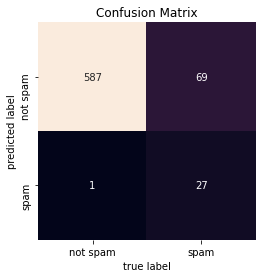

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


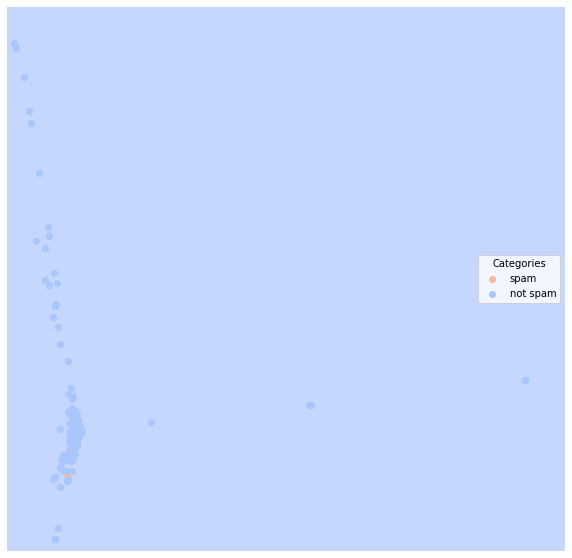

None
Time taken for method  logreg  on dataset  Spam  is  0.8494884967803955  seconds
.........................................
Dataset Spam
Method dtree
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.099415  0.750425   0.684211           0.434942  0.541667
not spam    0.099415  0.750425   0.927632           0.924857  0.959184


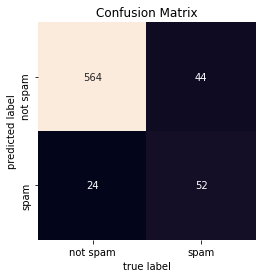

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


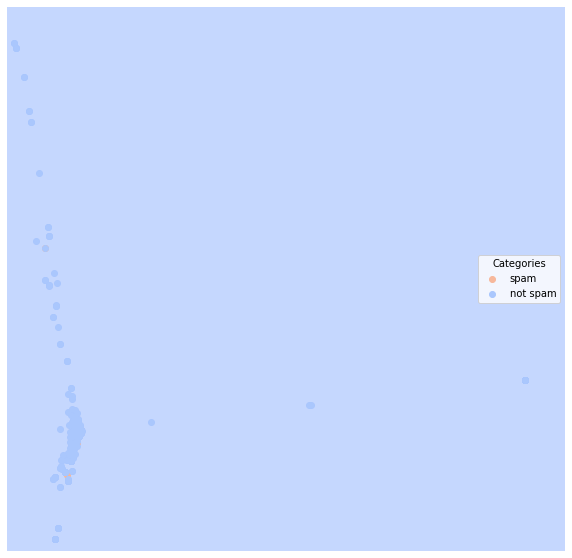

None
Time taken for method  dtree  on dataset  Spam  is  4.6735310554504395  seconds
.........................................
Dataset Spam
Method rf
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.076023  0.772747   0.843750           0.536013  0.562500
not spam    0.076023  0.772747   0.932258           0.931023  0.982993


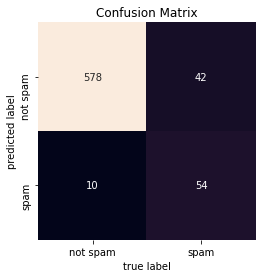

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


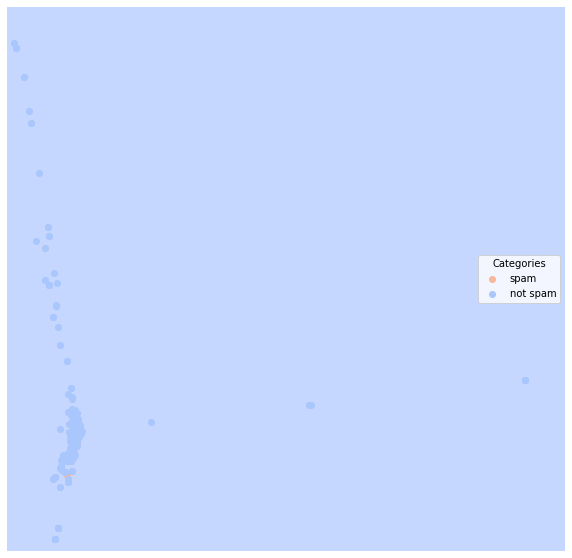

None
Time taken for method  rf  on dataset  Spam  is  7.808053493499756  seconds
.........................................
Dataset Spam
Method mlp
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.096491  0.804422   0.653061           0.482158  0.666667
not spam    0.096491  0.804422   0.945392           0.940435  0.942177


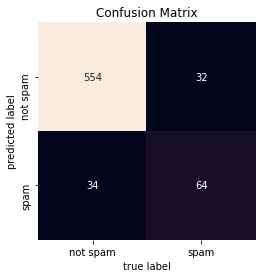

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


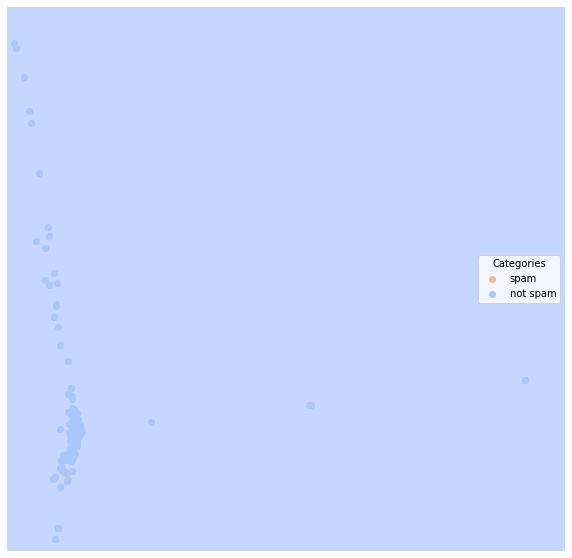

None
Time taken for method  mlp  on dataset  Spam  is  18.22884964942932  seconds
.........................................
Dataset Spam
Method gbc
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
spam        0.105263  0.638074   0.900000           0.354002  0.281250
not spam    0.105263  0.638074   0.894495           0.894318  0.994898


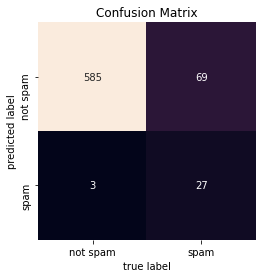

None


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


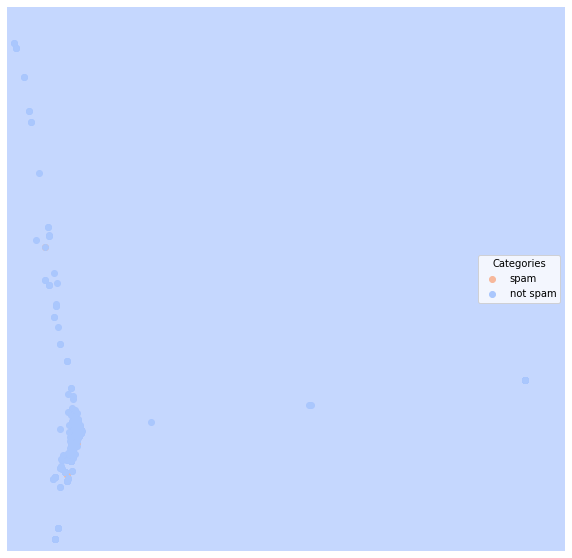

None
Time taken for method  gbc  on dataset  Spam  is  11.238883018493652  seconds
.........................................


In [0]:
import time
trainFull = [dfTrainReddit,dfTrainNews,dfTrainSen,dfTrainSpam]
trainString = ['Reddit','News','Sen','Spam']
testFull = [dfTestReddit,dfTestNews,dfTestSen, dfTestSpam ]
methods = [clf_nb, clf_linsvc, clf_polysvc, clf_neigh, clf_logreg, clf_dtree,\
           clf_rf, clf_mlp, clf_gbc]
methodsString = ['nb', 'linsvc', 'polysvc', 'neigh', 'logreg', 'dtree',\
           'rf', 'mlp', 'gbc']
for i in range(len(trainFull)):
    for j in range(len(methods)):
        clf = methods[j]
        print ("Dataset", trainString[i])
        print ('Method', methodsString[j])
        dfTrain = trainFull[i]
        dfTest = testFull[i]
        t0=time.time()
        clf.fit(np.stack(dfTrain['vect'], axis=0), dfTrain['category'])
        print (lucem_illud_2020.evaluateClassifier(clf, dfTest))
        print (lucem_illud_2020.plotConfusionMatrix(clf, dfTest))
        print (lucem_illud_2020.plotregions(clf, dfTest))
        t1=time.time()
        print ('Time taken for method ',methodsString[j] , ' on dataset ',trainString[i],' is ',t1-t0, ' seconds')
        print (".........................................")

Amongst the aritfical datasets, intresingly the blob data seems to be most amenable to classification with all the classifiers doing well except for Stochastic gradient descent. Perhaps SGD needs more iterations to converge. 

The dataset made with andsplit also seems to be amenable to classification, being a simple dataset. The classifier that worked best on that was the logistic regression classifier which gave upon plotting the region seems to have captured the noisy interfacial points very well.


For Reddit dataset it was Multi layer perceptron that performed best. 
For Newsgroup dataset it was MLP as well as Linear Support Vector Classifier that did well
For the Senate data, multiple methods did well including once again linsvc, but also logistic regression but Gradient Boostting classifier did the best classifying each single datapoint correctly!
For the SPAM data, MLP did the best considering AUC scores. This is probably the hardest problem for a classifier since, the proportions are off balance and the problem is akin to outlier detection than classification. However, if we consider the fact that in spam detection precision is more important than recall, logisitc regression does the best.

Thus we can see from the above examples that when it comes to text data, different methods do well for different datasets.



## <span style="color:red">*Exercise 2*</span>

<span style="color:red">In the cells immediately following, perform Logistic and Naïve Bayes classification (binary or multinomial) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project (e.g., these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week). Visualize the confusion matrix for training and testing sets. Calculate precision, recall, the F-measure, and AUC, then perform an ROC visualization. How do these classifiers perform? Exrapolate codes from these models to all uncoded data.


I am classifying below if tweets are fake or not, based on a publicly available dataset of about 1500 tweets, manually annoted by two experts(tweet is considered fake news, if they both agree it meets the standards of "intentionally misleading information").

In [0]:
Faketweets = pandas.read_csv('/content/drive/My Drive/Content Analysis/week-3/electionday_m.csv', index_col=False)

In [0]:
Faketweets.head()

,is_fake_news,fake_news_category,tweet_id,created_at,retweet_count,text,user_screen_name,user_verified,user_friends_count,user_followers_count,user_favourites_count,tweet_source,geo_coordinates,num_hashtags,num_mentions,num_urls,num_media
0,False,NaN,264033382076407808,Thu Nov 01 15:57:18 +0000 2012,4698,@realDonaldTrump you are full of shit!,RalphGilles,True,763,26680,3079,"<a href=""http://twitter.com/download/iphone"" r...",0,0,2,0,0
1,False,NaN,265895586660757505,Tue Nov 06 19:17:02 +0000 2012,9646,@realDonaldTrump you're fucking retarded,TimmyWait,False,839,397,504,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",0,0,2,0,0
2,False,NaN,265895723445411841,Tue Nov 06 19:17:35 +0000 2012,1823,@realDonaldTrump You are the stupidest man on ...,mattcale52,False,1184,1353,3355,"<a href=""http://twitter.com/download/iphone"" r...",0,0,2,0,0
3,False,NaN,265896172726661120,Tue Nov 06 19:19:22 +0000 2012,1168,@realDonaldTrump I am continually amazed and t...,MichaelWHill,False,1603,704,1479,"<a href=""http://twitter.com/download/iphone"" r...",0,0,2,0,0
4,False,NaN,266042962650226688,Wed Nov 07 05:02:39 +0000 2012,1979,Hey @realDonaldTrump You Mad Bro?,ThePresObama,False,135,70218,931,"<a href=""http://twitter.com"" rel=""nofollow"">Tw...",0,0,2,0,0


In [0]:
uncodedFaketweets = pandas.read_csv('/content/drive/My Drive/Content Analysis/week-3/twitter_fakenews_m.csv', index_col=False, nrows=2000)[-200:]

In [0]:
uncodedFaketweets.head()

,is_fake_news_1,is_fake_news_2,fake_news_category_1,fake_news_category_2,tweet_id,created_at,retweet_count,text,user_screen_name,user_verified,user_friends_count,user_followers_count,user_favourites_count,tweet_source,geo_coordinates_available,num_hashtags,num_mentions,num_urls,num_media
1800,FALSE,FALSE,0,0,784891515977932800,Sat Oct 08 23:01:34 +0000 2016,1315,I couldn't be prouder to be casting my vote fo...,EricSpracklen,False,369,89725,13157,Twitter for iPhone,2,2,2,0,0
1801,FALSE,FALSE,0,0,784891532620902400,Sat Oct 08 23:01:38 +0000 2016,2076,It's funny to hear people declare @realDonaldT...,DineshDSouza,True,4246,382309,530,Twitter for iPhone,0,0,2,0,0
1802,FALSE,FALSE,0,0,784910077803180032,Sun Oct 09 00:15:20 +0000 2016,3088,"2 days of Trumptalk and all I can say is, Real...",billmaher,True,41,5857083,13,Twitter for iPhone,0,0,2,0,0
1803,FALSE,TRUE,0,1,784914786068881412,Sun Oct 09 00:34:02 +0000 2016,3358,What's worse Americans abandoned in Benghazi o...,seanhannity,True,6815,1863011,109,Twitter for iPhone,0,0,1,1,0
1804,TRUE,TRUE,5,1,784916104569380870,Sun Oct 09 00:39:17 +0000 2016,5898,4 Americans are dead after being abandoned by ...,seanhannity,True,7285,2171256,111,Twitter for iPhone,0,0,2,0,0


In [0]:
Faketweets['category'] = [s == True for s in Faketweets['is_fake_news']]
Faketweets['tokenized_text'] = Faketweets['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
Faketweets['normalized_text'] = Faketweets['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))

In [0]:
uncodedFaketweets['category'] = [(s=='TRUE') or (r=='TRUE') for (s,r) in zip(uncodedFaketweets['is_fake_news_1'],uncodedFaketweets['is_fake_news_2'])]
uncodedFaketweets['tokenized_text'] = uncodedFaketweets['text'].apply(lambda x: lucem_illud_2020.word_tokenize(x))
uncodedFaketweets['normalized_text'] = uncodedFaketweets['tokenized_text'].apply(lambda x: lucem_illud_2020.normalizeTokens(x))
uncoded_data_df=uncodedFaketweets

I load a similiar dataset of fakenews to use as uncoded data.

In [0]:
uncodedFaketweets.head()

,is_fake_news_1,is_fake_news_2,fake_news_category_1,fake_news_category_2,tweet_id,created_at,retweet_count,text,user_screen_name,user_verified,user_friends_count,user_followers_count,user_favourites_count,tweet_source,geo_coordinates_available,num_hashtags,num_mentions,num_urls,num_media,category,tokenized_text,normalized_text
1800,FALSE,FALSE,0,0,784891515977932800,Sat Oct 08 23:01:34 +0000 2016,1315,I couldn't be prouder to be casting my vote fo...,EricSpracklen,False,369,89725,13157,Twitter for iPhone,2,2,2,0,0,False,"[I, could, n't, be, prouder, to, be, casting, ...","[proud, cast, vote, @realdonaldtrump, retweet,..."
1801,FALSE,FALSE,0,0,784891532620902400,Sat Oct 08 23:01:38 +0000 2016,2076,It's funny to hear people declare @realDonaldT...,DineshDSouza,True,4246,382309,530,Twitter for iPhone,0,0,2,0,0,False,"[It, 's, funny, to, hear, people, declare, @re...","[funny, hear, people, declare, @realdonaldtrum..."
1802,FALSE,FALSE,0,0,784910077803180032,Sun Oct 09 00:15:20 +0000 2016,3088,"2 days of Trumptalk and all I can say is, Real...",billmaher,True,41,5857083,13,Twitter for iPhone,0,0,2,0,0,False,"[2, days, of, Trumptalk, and, all, I, can, say...","[day, trumptalk, @realdonaldtrump, kiss, daugh..."
1803,FALSE,TRUE,0,1,784914786068881412,Sun Oct 09 00:34:02 +0000 2016,3358,What's worse Americans abandoned in Benghazi o...,seanhannity,True,6815,1863011,109,Twitter for iPhone,0,0,1,1,0,False,"[What, 's, worse, Americans, abandoned, in, Be...","[wrong, americans, abandon, benghazi, locker, ..."
1804,TRUE,TRUE,5,1,784916104569380870,Sun Oct 09 00:39:17 +0000 2016,5898,4 Americans are dead after being abandoned by ...,seanhannity,True,7285,2171256,111,Twitter for iPhone,0,0,2,0,0,False,"[4, Americans, are, dead, after, being, abando...","[americans, dead, abandon, @hillaryclinton, lo..."


In [0]:
holdBackFraction = .2
train_data_df, test_data_df = lucem_illud_2020.trainTestSplit(Faketweets, holdBackFraction=holdBackFraction)
print("Train data size:", len(train_data_df))
print("Test data size:", len(test_data_df))
print(len(test_data_df))
TFVectorizer = sklearn.feature_extraction.text.TfidfVectorizer(max_df=100, min_df=2, stop_words='english', norm='l2')
TFVects = TFVectorizer.fit_transform(train_data_df['text'])
train_data_df['vect'] = [np.array(v).flatten() for v in TFVects.todense()]


pca = sklearn.decomposition.PCA()
reduced_data = pca.fit_transform(np.stack(train_data_df['vect'], axis=0))
train_data_df['pca'] = [r for r in reduced_data]

Train data size: 1062
Test data size: 265
265


In [0]:
print(len(train_data_df['category']))
print(sum(list(train_data_df['category'])))
print(len(test_data_df['category']))
print(sum(list(test_data_df['category'])))

1062
105
265
31


There are 1062 datapoints in train of which 105 are fake news tweets
A similiar proportion of tweets are marked fake for the test set. This suggests our test set is balanced.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


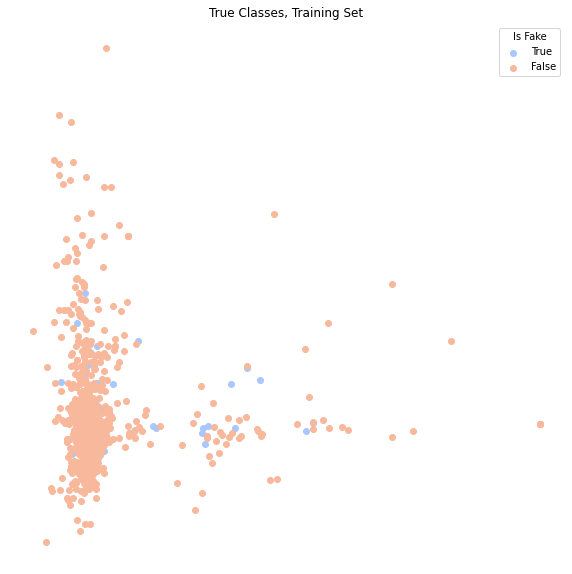

In [0]:
fig, ax = plt.subplots(figsize = (10,10))
ax.axis('off')
pallet = seaborn.color_palette(palette='coolwarm', n_colors = 2)

#Plot Fake
a = np.stack(train_data_df[train_data_df['category']]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[0], label = "True")

#Plot not Fake
a = np.stack(train_data_df[train_data_df['category'].eq(False)]['pca'])
ax.scatter(a[:,0], a[:, 1], c = pallet[1], label = "False")
    
ax.legend(loc = 'upper right', title = 'Is Fake')
plt.title('True Classes, Training Set')
plt.show()



We can see how a linear method would struggle with this dataset since a linear classifier will somehow draw a plane through what seems like an entangled space.

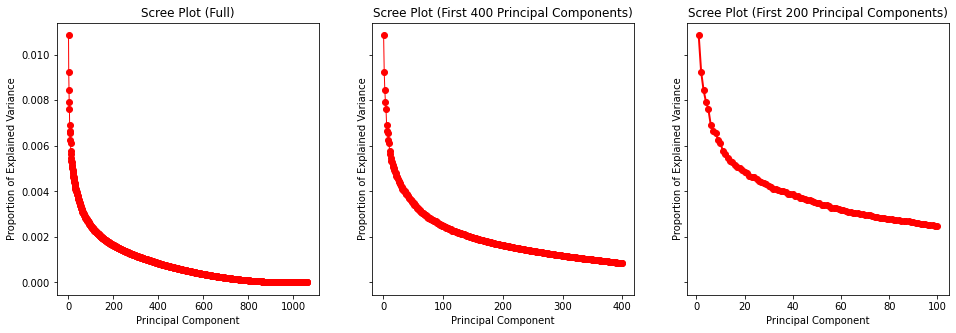

In [0]:
n = len(train_data_df)

fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (16, 5), sharey=True)

eigen_vals = np.arange(n) + 1
ax1.plot(eigen_vals, pca.explained_variance_ratio_, 'ro-', linewidth=1)
ax1.set_title('Scree Plot (Full)')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Proportion of Explained Variance')

eigen_vals = np.arange(400) + 1
ax2.plot(eigen_vals, pca.explained_variance_ratio_[:400], 'ro-', linewidth=1)
ax2.set_title('Scree Plot (First 400 Principal Components)')
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Proportion of Explained Variance')


eigen_vals = np.arange(100) + 1
ax3.plot(eigen_vals, pca.explained_variance_ratio_[:100], 'ro-', linewidth=2)
ax3.set_title('Scree Plot (First 200 Principal Components)')
ax3.set_xlabel('Principal Component')
ax3.set_ylabel('Proportion of Explained Variance')

plt.show()

I first looked at 1000 components above and then zoomed in to find the elbow. There seems to be an elbow at n=20, so we will choose 20 components.

In [0]:
train_data_df['pca_reduced_20'] = train_data_df['pca'].apply(lambda x: x[:20])
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_20'], axis=0), train_data_df['category'])
logistic.score(np.stack(train_data_df['pca_reduced_20'], axis=0), train_data_df['category'])


0.8926553672316384

In [0]:
train_data_df['pca_reduced_100'] = train_data_df['pca'].apply(lambda x: x[:100])
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])
logistic.score(np.stack(train_data_df['pca_reduced_100'], axis=0), train_data_df['category'])

0.8973634651600754

In [0]:
train_data_df['pca_reduced_200'] = train_data_df['pca'].apply(lambda x: x[:200])
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])
logistic.score(np.stack(train_data_df['pca_reduced_200'], axis=0), train_data_df['category'])

0.8973634651600754

From looking at the scores for 100 and 200 pca components, it seems that our guess of n=20 is a good fit since the extra components don't seem to add much to the classifier.

In [0]:
TFVects_test = TFVectorizer.transform(test_data_df['text'])
test_data_df['vect'] = [np.array(v).flatten() for v in TFVects_test.todense()]

TFVects_uncoded = TFVectorizer.transform(uncoded_data_df['text'])
uncoded_data_df['vect'] = [np.array(v).flatten() for v in TFVects_uncoded.todense()]

In [0]:
#PCA
train_data_df['pca_reduced_20'] = train_data_df['pca'].apply(lambda x: x[:20])
logistic = sklearn.linear_model.LogisticRegression()
logistic.fit(np.stack(train_data_df['pca_reduced_20'], axis=0), train_data_df['category'])
logistic.score(np.stack(train_data_df['pca_reduced_20'], axis=0), train_data_df['category'])

reduced_data_test = pca.transform(np.stack(test_data_df['vect'], axis=0))
test_data_df['pca'] = [r for r in reduced_data_test]
test_data_df['pca_reduced_20'] = test_data_df['pca'].apply(lambda x: x[:20])

reduced_data_uncoded = pca.transform(np.stack(uncoded_data_df['vect'], axis=0))
uncoded_data_df['pca'] = [r for r in reduced_data_uncoded]
uncoded_data_df['pca_reduced_20'] = uncoded_data_df['pca'].apply(lambda x: x[:20])

#Test
print("Score for test data", logistic.score(np.stack(test_data_df['pca_reduced_20'], axis=0), test_data_df['category']))
#Uncoded
print('Score for uncoded data', logistic.score(np.stack(uncoded_data_df['pca_reduced_20'], axis=0), uncoded_data_df['category']))


Score for test data 0.9169811320754717
Score for uncoded data 0.8


Not suprisingly the accuracy for the uncoded data is much lower. However accuracy is misleading in this unbalanced dataset as the negative case which is numerous is easily detected due to the classifier learning the imbalance in the dataset.

In [0]:
naiveBayes = sklearn.naive_bayes.BernoulliNB()
naiveBayes.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
print("Training:")
print(naiveBayes.score(np.stack(train_data_df['vect'], axis=0), train_data_df['category']))
print("Testing:")
print(naiveBayes.score(np.stack(test_data_df['vect'], axis=0), test_data_df['category']))
print(lucem_illud_2020.evaluateClassifier(naiveBayes, test_data_df))
print("Uncoded:")
print(naiveBayes.score(np.stack(uncoded_data_df['vect'], axis=0), uncoded_data_df['category']))
print(lucem_illud_2020.evaluateClassifier(naiveBayes, uncoded_data_df))

Training:
0.9265536723163842
Testing:
0.9207547169811321
          Error_Rate       AUC  Precision  Average_Precision    Recall
Category                                                              
False       0.079245  0.522727   0.920455           0.920455  1.000000
True        0.079245  0.522727   1.000000           0.124700  0.045455
Uncoded:
0.805
          Error_Rate     AUC  Precision  Average_Precision  Recall
Category                                                          
False          0.195  0.5125    0.80402            0.80402   1.000
True           0.195  0.5125    1.00000            0.22000   0.025


This is not giving great results overall. Given the complexity of the problem, a linear model might be insufficient to learn from the data(which is scarce). However, from the precision numbers, we can see that if this model identifies an tweet as fake, it probably is. This is encouraging if we are interested in fake news detection where precision becomes important in relation to censorship(better to let some "fake news articles/tweets" pass the filter than to block "non fake news articles/tweets"

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">In the cells immediately following, perform decision tree and random forest classification (binary, multinomial or continuous) using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. As with ***Exercise 2***, these could be crowd-sourced codes gathered through Amazon Mechanical Turk last week. Visualize the classification of data points. Calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Now build an ensemble classifier by bagging trees into a random forest. Visualize the result. How do these classifiers perform? What does ensemble learning do?

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


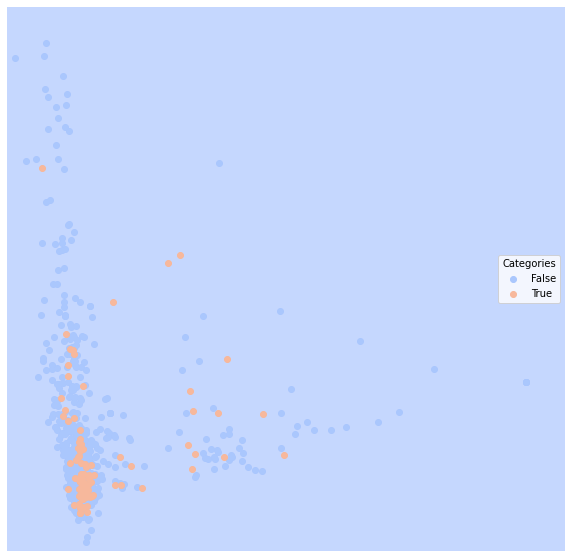

In [0]:
clf_tree = sklearn.tree.DecisionTreeClassifier(max_depth=4,random_state=0)
clf_tree.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])
lucem_illud_2020.plotregions(clf_tree, train_data_df)


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


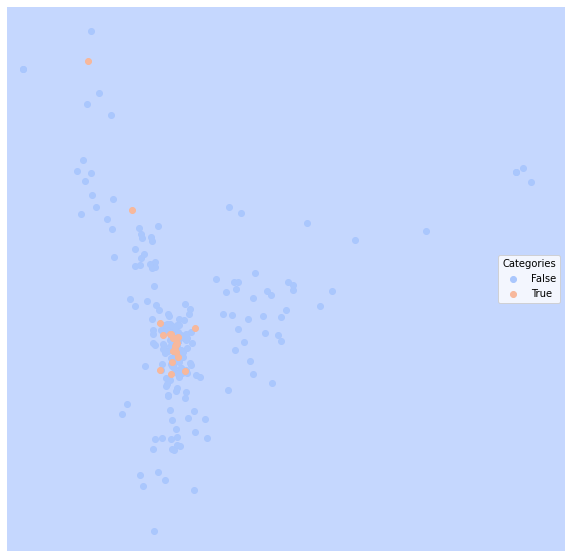

In [0]:
lucem_illud_2020.plotregions(clf_tree, test_data_df)


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


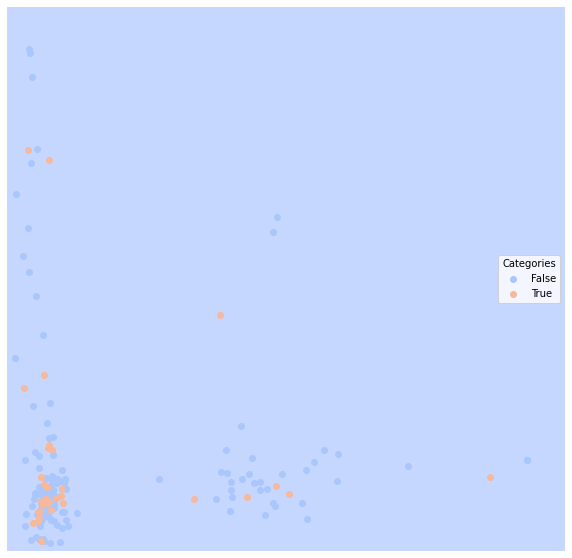

In [0]:
lucem_illud_2020.plotregions(clf_tree, uncoded_data_df)

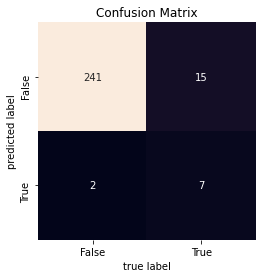

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.064151,0.654976,0.941406,0.941205,0.991770
True,0.064151,0.654976,0.777778,0.304079,0.318182


In [0]:
lucem_illud_2020.plotConfusionMatrix(clf_tree, test_data_df)
lucem_illud_2020.evaluateClassifier(clf_tree, test_data_df)

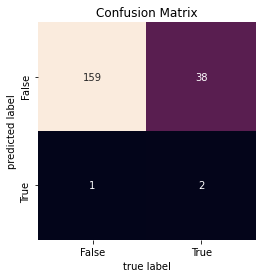

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.195,0.521875,0.807107,0.807062,0.99375
True,0.195,0.521875,0.666667,0.223333,0.05000


In [0]:
lucem_illud_2020.plotConfusionMatrix(clf_tree, uncoded_data_df)
lucem_illud_2020.evaluateClassifier(clf_tree, uncoded_data_df)

These results are slightly worse than the last method for the test dataset, since just like in SPAM detection, precision of the True cases is most important. The uncoded dataset gets predictably even worse results.

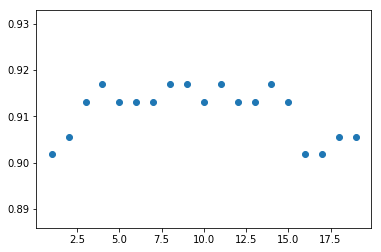

In [0]:
depthvec = []
scorevec = []
for i in range(1,20):
    tree2 = sklearn.tree.DecisionTreeClassifier(max_depth=i,random_state=0)
    tree2.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category'])
    score = sklearn.metrics.accuracy_score(test_data_df['category'], tree2.predict(np.stack(test_data_df['vect'], axis = 0)))
    depthvec.append(i)
    scorevec.append(score)
plt.scatter(depthvec,scorevec)
plt.show()

In [0]:
tree = sklearn.tree.DecisionTreeClassifier(max_depth=10) #Create an instance of our decision tree classifier.
bag = sklearn.ensemble.BaggingClassifier(tree, n_estimators=100, max_samples=0.8, random_state=1) #Each tre
bag.fit(np.stack(train_data_df['vect'], axis =0), train_data_df['category']) #Fit the bagged classifier

BaggingClassifier(base_estimator=DecisionTreeClassifier(ccp_alpha=0.0,
                                                        class_weight=None,
                                                        criterion='gini',
                                                        max_depth=10,
                                                        max_features=None,
                                                        max_leaf_nodes=None,
                                                        min_impurity_decrease=0.0,
                                                        min_impurity_split=None,
                                                        min_samples_leaf=1,
                                                        min_samples_split=2,
                                                        min_weight_fraction_leaf=0.0,
                                                        presort='deprecated',
                                                        random_state=None,
  

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


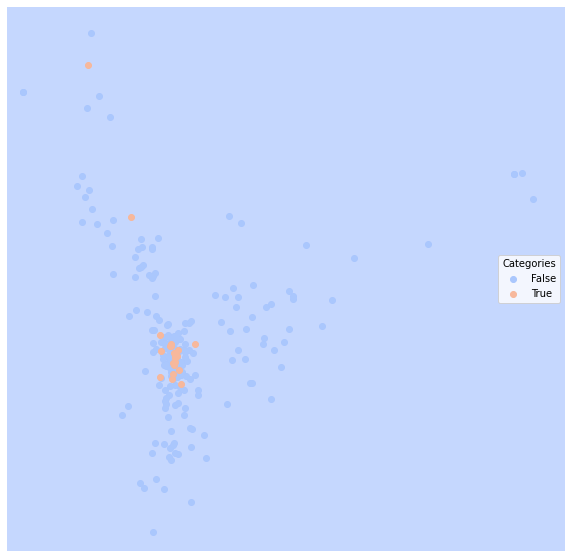

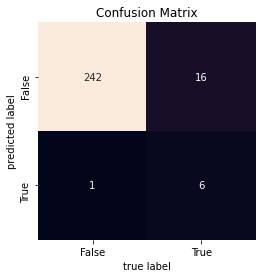

In [0]:
lucem_illud_2020.plotregions(bag, test_data_df)
lucem_illud_2020.plotConfusionMatrix(bag, test_data_df)

In [0]:
lucem_illud_2020.evaluateClassifier(bag, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.064151,0.634306,0.937984,0.937898,0.995885
True,0.064151,0.634306,0.857143,0.294144,0.272727


Precision for True cases sees a huge jump in this method, suggesting this a good method for our needs.

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


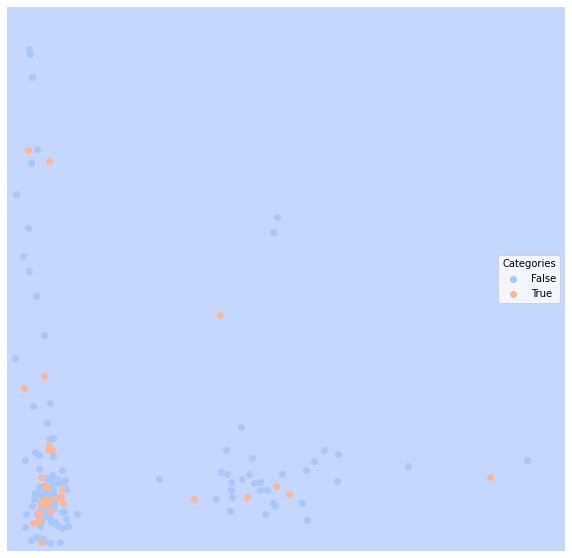

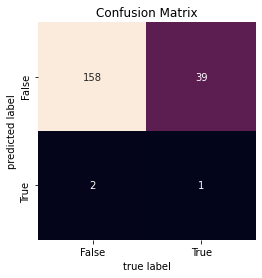

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.205,0.50625,0.802030,0.802005,0.9875
True,0.205,0.50625,0.333333,0.203333,0.0250


In [0]:
lucem_illud_2020.plotregions(bag, uncoded_data_df)
lucem_illud_2020.plotConfusionMatrix(bag, uncoded_data_df)
lucem_illud_2020.evaluateClassifier(bag, uncoded_data_df)

Unfortunately for the uncoded dataset, the performance isn't as good, suggesting the method doesn't generalize well to datasets other than training data.

# K-Nearest Neighbors

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform and visualize k-nearest neighbor classification using training, testing and extrapolation (uncoded) data from texts and hand-classifications associated with your final project. Visualize the classification of data points and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). Articulate how the *k*-nearest neighbor approach relates to *k*-means clustering explored in ***week 3***?

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


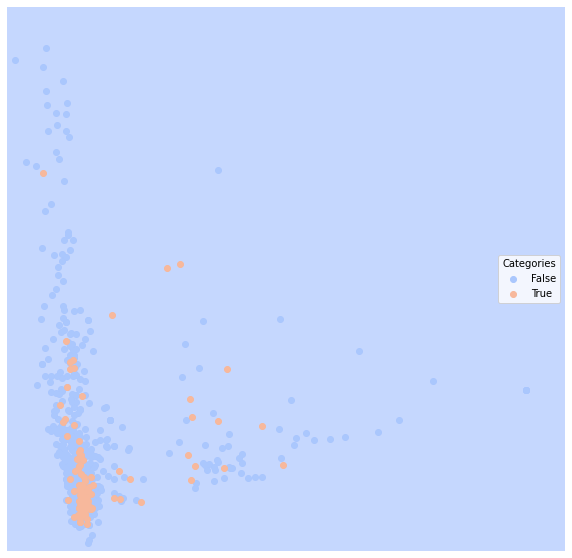

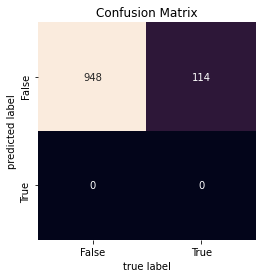

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.107345,0.5,0.892655,0.892655,1.0
True,0.107345,0.5,0.000000,0.107345,0.0


In [0]:
n_neighbors = 15
weights="uniform"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knearest.fit(np.stack(train_data_df['vect'], axis = 0), train_data_df['category'])
lucem_illud_2020.plotregions(clf_knearest, train_data_df)
lucem_illud_2020.plotConfusionMatrix(clf_knearest, train_data_df)
lucem_illud_2020.evaluateClassifier(clf_knearest, train_data_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


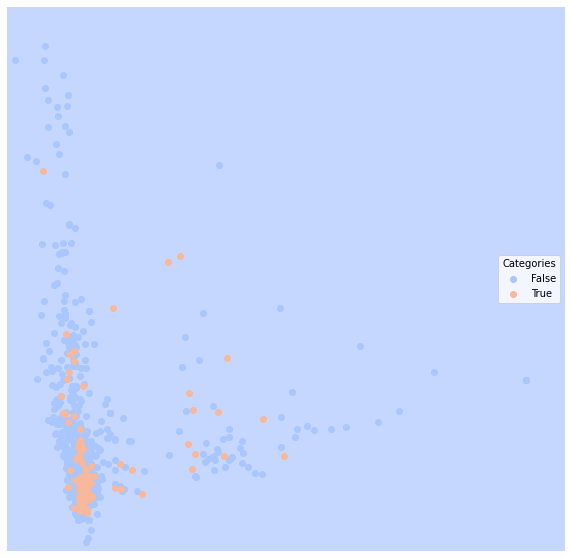

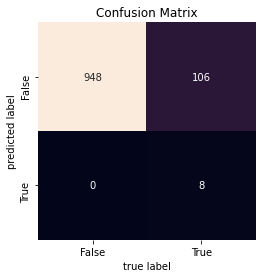

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.099812,0.535088,0.899431,0.899431,1.000000
True,0.099812,0.535088,1.000000,0.169987,0.070175


In [0]:
n_neighbors = 5
weights="uniform"
clf_knearest_unif = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knearest_unif.fit(np.stack(train_data_df['vect'], axis = 0), train_data_df['category'])
lucem_illud_2020.plotregions(clf_knearest_unif, train_data_df)
lucem_illud_2020.plotConfusionMatrix(clf_knearest_unif, train_data_df)
lucem_illud_2020.evaluateClassifier(clf_knearest_unif, train_data_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


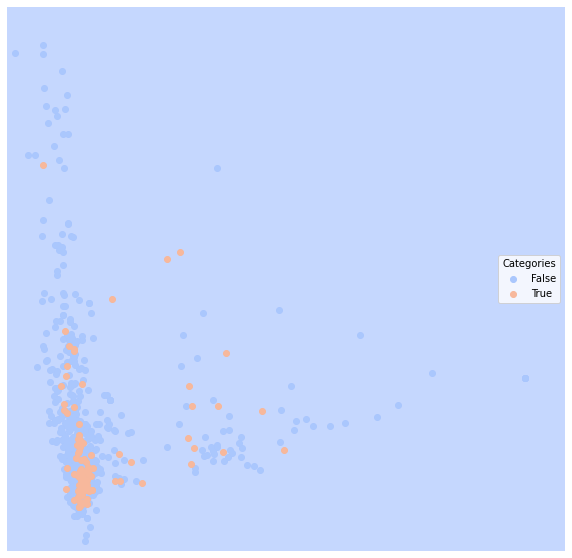

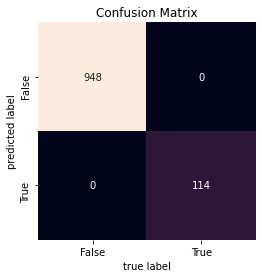

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.0,1.0,1.0,1.0,1.0
True,0.0,1.0,1.0,1.0,1.0


In [0]:
n_neighbors = 5
weights="distance"
clf_knearest = sklearn.neighbors.KNeighborsClassifier(n_neighbors, weights=weights)
clf_knearest.fit(np.stack(train_data_df['vect'], axis = 0), train_data_df['category'])
lucem_illud_2020.plotregions(clf_knearest, train_data_df)
lucem_illud_2020.plotConfusionMatrix(clf_knearest, train_data_df)
lucem_illud_2020.evaluateClassifier(clf_knearest, train_data_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


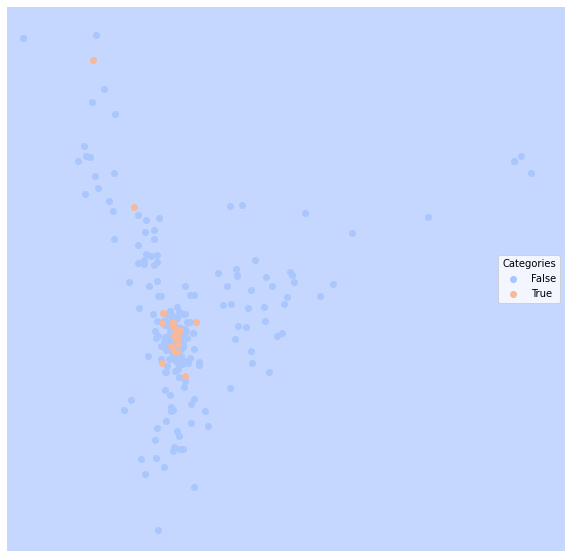

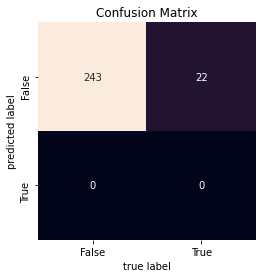

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.083019,0.5,0.916981,0.916981,1.0
True,0.083019,0.5,0.000000,0.083019,0.0


In [0]:
lucem_illud_2020.plotregions(clf_knearest, test_data_df)
lucem_illud_2020.plotConfusionMatrix(clf_knearest, test_data_df)
lucem_illud_2020.evaluateClassifier(clf_knearest, test_data_df)

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


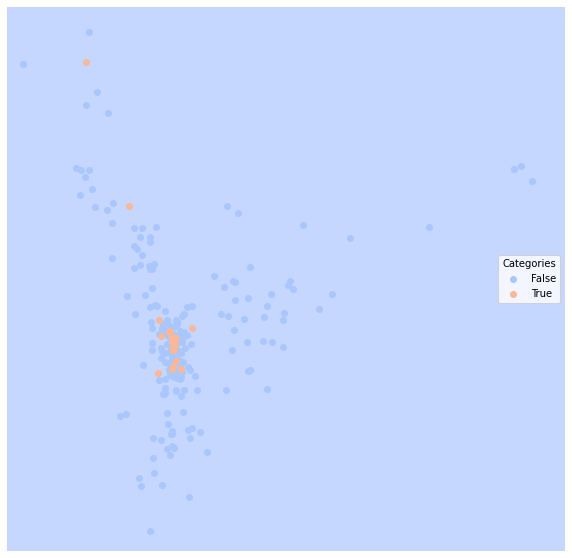

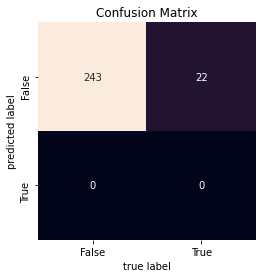

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.083019,0.5,0.916981,0.916981,1.0
True,0.083019,0.5,0.000000,0.083019,0.0


In [0]:
lucem_illud_2020.plotregions(clf_knearest_unif, test_data_df)
lucem_illud_2020.plotConfusionMatrix(clf_knearest_unif, test_data_df)
lucem_illud_2020.evaluateClassifier(clf_knearest_unif, test_data_df)

In nearest neighbour, the centroids determines to which cluster the nearby points belong to. In k-neighbours, the centroids allows the datapoints near it to borrow the label. As we can see from the training set confusion matrix, this method overlearned the training set and thus performed poorly while giving zero precision for both the test set and the uncoded set!!

## <span style="color:red">*Exercise 5*</span>

<span style="color:red">In the cells immediately following, perform a neural network classification and calculate relevant metrics (e.g., precision, recall, the F-measure, and AUC). How does this classify relevant to *k*-nearest neighbor, Naive Bayes, logistic and decision-tree approaches?

I finally try the MLP classifier

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.


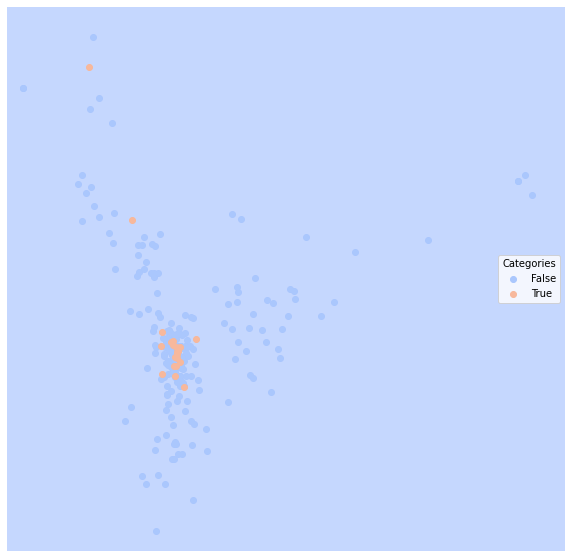

In [0]:
clf_nn = sklearn.neural_network.MLPClassifier()
clf_nn.fit(np.stack(train_data_df['vect'], axis=0), train_data_df['category'])
lucem_illud_2020.plotregions(clf_nn, test_data_df)

In [0]:
lucem_illud_2020.evaluateClassifier(clf_nn, test_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.090566,0.619903,0.936255,0.93562,0.967078
True,0.090566,0.619903,0.428571,0.17726,0.272727


In [0]:
lucem_illud_2020.evaluateClassifier(clf_nn, uncoded_data_df)

,Error_Rate,AUC,Precision,Average_Precision,Recall
Category,,,,,
False,0.185,0.603125,0.836066,0.834488,0.95625
True,0.185,0.603125,0.588235,0.297059,0.25000


The NN model performs very poorly in our category of interest: precision of True cases. This is suprising as NNs are uniquely suited to capturing the non-linearitites in text data, however we may have been undone by our lack of data. For this category, this is the worst performing model!